# CODEX analyses

## Imports and data loading

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from time import time
import warnings
import joblib
# from pathlib3x import Path
from pathlib import Path
from time import time
from tqdm import tqdm
import copy
from skimage import color
import matplotlib as mpl
import napari
import colorcet as cc
import composition_stats as cs

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan
from sklearn.cluster import OPTICS, cluster_optics_dbscan
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler, PowerTransformer, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score
import sklearn.metrics as metrics
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV, HalvingGridSearchCV
from sklearn.utils.class_weight import compute_sample_weight
from scipy.stats import loguniform
from sklearn.inspection import permutation_importance

from skimage import io

from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

from tysserand import tysserand as ty
from mosna import mosna

import matplotlib as mpl
mpl.rcParams["figure.facecolor"] = 'white'
mpl.rcParams["axes.facecolor"] = 'white'
mpl.rcParams["savefig.facecolor"] = 'white'

/home/alexis/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/statsmodels/compat/pandas.py:61: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [2]:
# If need to reload modules after their modification
from importlib import reload
ty = reload(ty)
mosna = reload(mosna)

In [3]:
RUN_LONG = False

### Objects data

File that contains all the detected objects (the cells) across all samples.

In [4]:
data_dir = Path("../data/raw/CODEX_CTCL")
try:
    objects_path = data_dir / "41467_2021_26974_MOESM3_ESM_-_Objects.jbl"
    obj = joblib.load(objects_path)
except FileNotFoundError:
    objects_path = data_dir / "41467_2021_26974_MOESM3_ESM_-_Objects.xlsx"
    obj = pd.read_excel(objects_path, skiprows=2)
obj

,Count,EventCount,Index in File,ClusterID,FileName,ClusterName,Spots,Patients,Groups,FOXP3,...,PD-1+CD8+,CD4+Tcells,PD-1+tumor,CD8+Tcells,Ki67+CD4+,Ki-67+Tregs,ICOS+Tregs,IDO+Tregs,Ki67+tumor,original_index
0,0,1,60,33987,reg001,B cells,1,1,1,0.692403,...,0,0,0,0,0,0,0,0,0,0
1,1,1,94,33987,reg001,B cells,1,1,1,8.094747,...,0,0,0,0,0,0,0,0,0,1
2,2,1,198,33987,reg001,B cells,1,1,1,4.110389,...,0,0,0,0,0,0,0,0,0,2
3,3,1,284,33987,reg001,B cells,1,1,1,0.000000,...,0,0,0,0,0,0,0,0,0,3
4,4,1,298,33987,reg001,B cells,1,1,1,2.937673,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117165,116917,1,633,33981,reg066,vasculature,66,14,4,84.269714,...,0,0,0,0,0,0,0,0,0,116917
117166,116918,1,677,33981,reg066,vasculature,66,14,4,56.425945,...,0,0,0,0,0,0,0,0,0,116918
117167,116919,1,681,33981,reg066,vasculature,66,14,4,63.152092,...,0,0,0,0,0,0,0,0,0,116919
117168,116920,1,705,33981,reg066,vasculature,66,14,4,66.873306,...,0,0,0,0,0,0,0,0,0,116920


In [5]:
# sample_cols = obj.columns[:10]
obj.rename(columns={'X': 'x', 'Y': 'y', 'Z':'z'}, inplace=True)
sample_cols = ['FileName', 'ClusterName', 'Patients', 'Spots' ,'Groups']
marker_cols = obj.columns[9:67]
marker_cols = [x for x in marker_cols if x != 'HOECHST1:Cyc_1_ch_1']
# cell_pos_cols = obj.columns[69:76]
cell_pos_cols = ['x', 'y'] # no z this time ! 
# cell_type_cols = obj.columns[76:101]
cell_type_cols = list(obj.columns[75:96])
marker_posit_cols = list(obj.columns[100:-1])
all_cols = sample_cols + marker_cols + cell_pos_cols + cell_type_cols + marker_posit_cols
nb_clusters = obj['ClusterName'].unique().size

In [6]:
obj.shape

(117170, 121)

In [7]:
# Select only pre-treatment samples
obj = obj.loc[obj['Groups'] < 3, :]
obj.index = np.arange(len(obj))
obj['Groups'].unique()

array([1, 2])

In [8]:
# some debuging...
obj.loc[obj["FileName"] == 'reg040', :]

,Count,EventCount,Index in File,ClusterID,FileName,ClusterName,Spots,Patients,Groups,FOXP3,...,PD-1+CD8+,CD4+Tcells,PD-1+tumor,CD8+Tcells,Ki67+CD4+,Ki-67+Tregs,ICOS+Tregs,IDO+Tregs,Ki67+tumor,original_index
46,567,1,265,33987,reg040,B cells,40,10,1,105.316605,...,0,0,0,0,0,0,0,0,0,567
47,568,1,560,33987,reg040,B cells,40,10,1,41.249653,...,0,0,0,0,0,0,0,0,0,568
48,569,1,1087,33987,reg040,B cells,40,10,1,42.894711,...,0,0,0,0,0,0,0,0,0,569
434,3040,1,449,33988,reg040,CD4+ T cells,40,10,1,146.861786,...,0,1,0,0,0,0,0,0,0,3040
435,3043,1,880,33988,reg040,CD4+ T cells,40,10,1,98.519394,...,0,1,0,0,0,0,0,0,0,3043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36663,114847,1,1297,33981,reg040,vasculature,40,10,1,126.448128,...,0,0,0,0,0,0,0,0,0,114847
36664,114848,1,1302,33981,reg040,vasculature,40,10,1,60.009136,...,0,0,0,0,0,0,0,0,0,114848
36665,114849,1,1303,33981,reg040,vasculature,40,10,1,7.867873,...,0,0,0,0,0,0,0,0,0,114849
36666,114850,1,1304,33981,reg040,vasculature,40,10,1,25.090118,...,0,0,0,0,0,0,0,0,0,114850


In [9]:
pd.set_option('display.max_rows', 500)
obj[['FileName', 'Patients', 'Groups', 'Count']].groupby(['Patients', 'Groups', 'FileName']).count()

Count
Patients Groups FileName       
1        1      reg001     1301
                reg002     2324
2        1      reg005      112
                reg006      603
3        2      reg009     2334
                reg010     1970
4        2      reg013     1765
                reg014     1270
5        1      reg017      558
                reg018      458
6        2      reg021     2483
                reg022     2325
7        2      reg025      144
                reg026      257
8        2      reg029     1916
                reg030     1909
                reg031     1102
9        1      reg035     2053
                reg036      618
10       1      reg039     1225
                reg040     1317
11       1      reg041     1105
                reg042      385
12       2      reg045     1914
                reg046      808
13       1      reg051     1082
                reg052     1707
14       2      reg057     1166
                reg058     1854

In [10]:
pd.set_option('display.max_rows', 10)

### Response status pre/post treatment

In [11]:
code_groups = {
  1: 'Responder, pre-treatment',
  2: 'Non-responder, pre-treatment',
  3: 'Responder, post-treatment',
  4: 'Non-responder, post-treatment',
} 

In [12]:
status_path = data_dir / "41467_2021_26974_MOESM5_ESM - Patients_spots_conditons.xlsx"
status = pd.read_excel(status_path, skiprows=2, usecols=['Patients', 'Groups', 'Spots'])
# samples 25, 36, 37, 40, 44 are missing
# 36 and 37 should be patient 9
# 40 is either 10 or 11
# 44 is 11, which make 4 samples of this patient
# so probably 40 is patient 10

# # /!\ this is a guess that makes sense, but it still might be wrong /!\
# guessed_data = [[9, 1, 36],
#                 [9, 3, 37],
#                 [10, 3, 40],
#                 [11, 3, 44],
#                 ]
# status = pd.concat([status, pd.DataFrame(guessed_data, columns=status.columns)], axis=0)

status['FileName'] = status['Spots'].apply(lambda x: f'reg{x:03}')
# pd.set_option('display.max_rows', 100)

if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
status.sort_values('Spots')

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg003,1,3,3
reg004,1,3,4
reg006,2,1,6
...,...,...,...
reg066,14,4,66
reg067,9,3,67
reg068,9,3,68


In [13]:
# Status has too many missing values
# we make a status dataframe from the objects dataframe
status = obj[['FileName', 'Patients', 'Groups', 'Count']].groupby(['Patients', 'Groups', 'FileName']).count().reset_index()
status.drop(columns=['Count'], inplace=True)
if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
status['Spots'] = [int(x[-2:]) for x in status.index]
status

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg005,2,1,5
reg006,2,1,6
reg009,3,2,9
...,...,...,...
reg046,12,2,46
reg051,13,1,51
reg052,13,1,52


### Survival data

In [14]:
survival_path = data_dir / "cohort_response.ods"
surv = pd.read_excel(survival_path)
surv.index = surv['Patient ID']
surv.drop(columns=['Patient ID'], inplace=True)
# surv.index.name = 'sample'
surv

,Age at screening (years),Gender,Diagnosis,Disease Stage,Prior therapies,Response status,Biopsy timepoints,CO2 (weeks),Response / progression time (weeks),EOT time (weeks),Death time (weeks),Follow-up time (weeks)
Patient ID,,,,,,,,,,,,
1,76.14,Male,MF,IIIA,3,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,142
2,60.59,Male,MF,IIIB,4,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,151
3,52.01,Male,SS,IVA,3,Non-responder,"Pre, EOT",NaN,NaN,98.0,98.0,98
4,85.14,Female,SS,IVA,4,Non-responder,"Pre, EOT",NaN,NaN,104.0,142.0,142
5,75.24,Male,MF,IIB,6,Responder,"Pre, EOT",NaN,NaN,104.0,NaN,103
...,...,...,...,...,...,...,...,...,...,...,...,...
10,66.40,Male,MF,IIIA,2,Responder,Pre,NaN,NaN,NaN,119.0,119
11,72.23,Male,SS,IVA,3,Responder,"Pre, Response",NaN,22.0,104.0,NaN,171
12,72.59,Male,SS,IVA,5,Non-responder,"Pre, Progression",NaN,15.0,15.0,NaN,15


## Spatial networks reconstruction

### Load samples of one patient

We will have a look at the spatial networks of the 4 samples of the first patient to check they seem "correct", i.e. not over nor under connected.

processing filename reg001
processing filename reg002


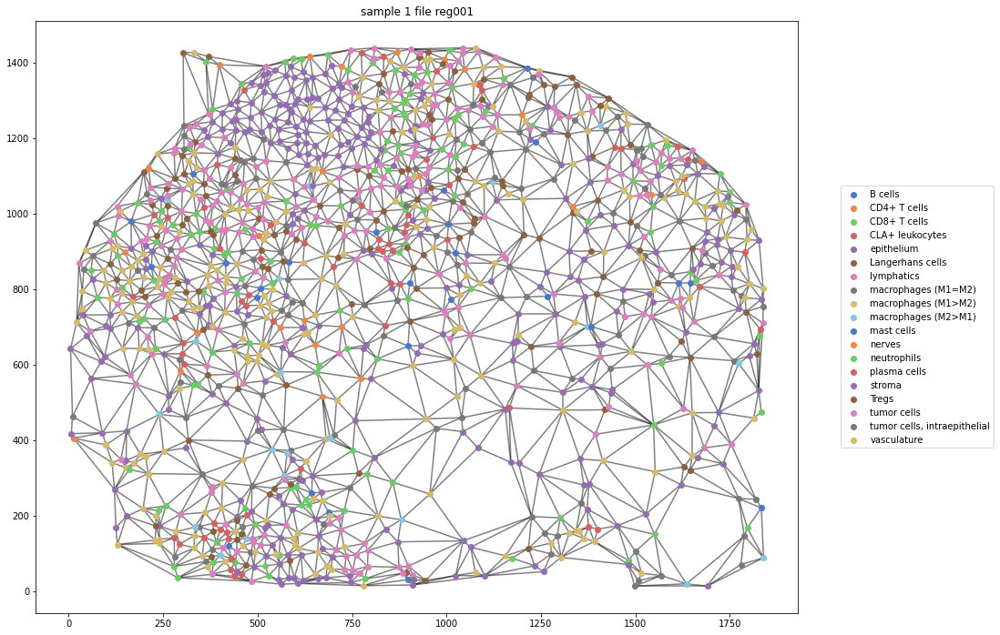

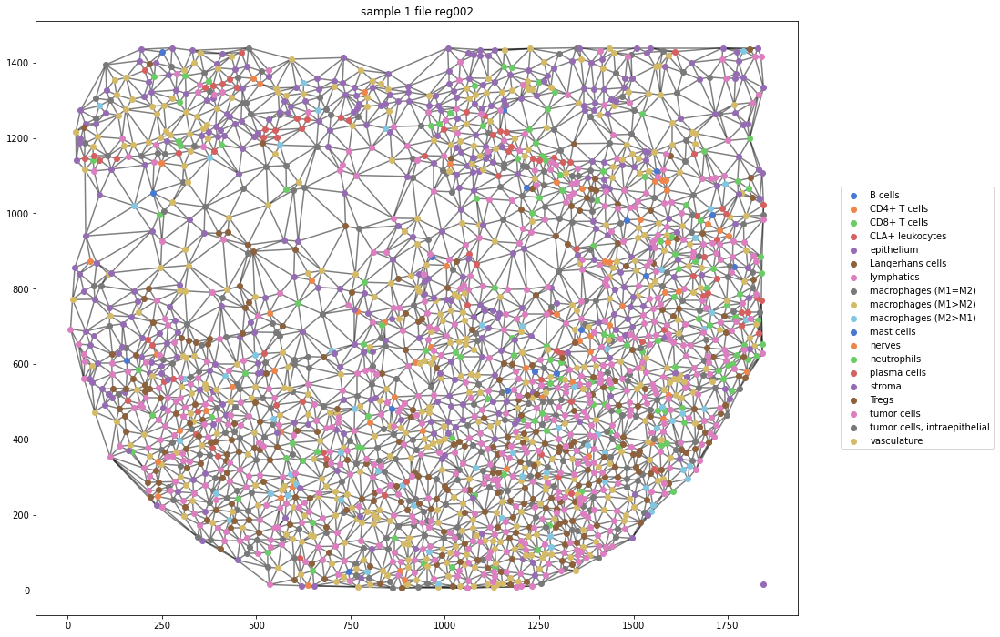

In [15]:
sample_id = 1  # that's our patient
select_sample = obj['Patients'] == sample_id
filenames = obj.loc[select_sample, 'FileName'].unique()  # look for the several samples per patient
for filename in filenames:
    print("processing filename {}".format(filename))
    select_file = obj['FileName'] == filename
    nodes = obj.loc[select_sample & select_file, all_cols]
    coords = nodes[cell_pos_cols].values
    pairs = ty.build_delaunay(coords, trim_dist=200)
    # we want to avoid isolated cells, so we link them to their 2 closest neighbors
    # pairs = ty.link_solitaries(coords, pairs, method='knn', k=2)

    fig, ax = ty.plot_network(coords, pairs, labels=nodes['ClusterName'],
                              legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)})
    plt.title("sample {} file {}".format(sample_id, filename))

### All samples network reconstruction

#### Plot spatial networks

In [16]:
processed_dir = Path('../data/processed/CODEX_CTCL')

In [17]:
# Choose optimal distances
save_dir = processed_dir / "pretreatment_samples_networks_xy_solitary-0_choose_distance"

files_dst = [
    "reg001",
    "reg003",
    "reg005",
    "reg006",
    "reg037",
    "reg040",
    "reg042",
    "reg051",
    "reg054",
    "reg055",
    "reg016",
    "reg058",
    "reg060",
    "reg019",
]

k_sol = 0 

if RUN_LONG:
    for filename in files_dst:
        print("    processing filename {}".format(filename))
        select_file = obj['FileName'] == filename
        nodes = obj.loc[select_file, all_cols]
        coords = nodes[cell_pos_cols].values
        pairs = ty.build_delaunay(coords, trim_dist=200)
        print("    ", end="")
        if k_sol > 0:
            pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)
        distances = ty.distance_neighbors(coords, pairs)

        fig, ax = ty.plot_network_distances(
            coords, pairs, distances, labels=nodes['ClusterName'],
            legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)}
            )
        plt.axis('off');
        title = f"network_distances_filename-{filename}"
        plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
        plt.show()

In [18]:
trim_dist = 200 # or 'percentile_size'
k_sol = 0 # or 1, 2, 3, ...
reconst_dir = processed_dir / f"pretreatment_samples_networks_xy_trim_dist-{trim_dist}_solitary-{k_sol}"
save_dir = reconst_dir / "networks_images"

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [19]:
if RUN_LONG:
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            fig, ax = ty.plot_network(coords, pairs, labels=nodes['ClusterName'],
                                      legend_opt={'loc': 'center left', 'bbox_to_anchor': (1.05, 0.5)})
            plt.axis('off');
            title = f"sample-{sample_id}_filename-{filename}_network_delaunay"
            plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
            plt.show()

#### Merge all samples

In [ ]:
if RUN_LONG:
    edges_all = pd.DataFrame(data=None, columns=['source', 'target'])
    # number of nodes previously seen
    nb_nodes = 0
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            # increase ids in pairs by the number of nodes in all previously loaded networks
            pairs = pairs + nb_nodes
            edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
            # update number of nodes for next network
            nb_nodes = nb_nodes + coords.shape[0]
            edges_all = pd.concat([edges_all, edges], ignore_index=True)
    edges_all.to_csv(reconst_dir / 'sample_all-edges.csv', index=False)
else:
    edges_all = pd.read_csv(reconst_dir / 'sample_all-edges.csv')

In [21]:
# or save in separate file for convenience
if RUN_LONG:
    for sample_id in obj['Patients'].unique():
        print(f"processing sample {sample_id}")
        select_sample = obj['Patients'] == sample_id
        filenames = obj.loc[select_sample, 'FileName'].unique()
        for filename in filenames:
            print("    processing filename {}".format(filename))
            select_file = obj['FileName'] == filename
            nodes = obj.loc[select_sample & select_file, all_cols]
            coords = nodes[cell_pos_cols].values
            pairs = ty.build_delaunay(coords, trim_dist=trim_dist)
            print("    ", end="")
            if k_sol > 0:
                pairs = ty.link_solitaries(coords, pairs, method='knn', k=k_sol)

            edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
            edges.to_csv(reconst_dir / f'edges_sample-{filename}.csv', index=False)

## Response groups characteristics and survival analysis

We will look at what variables define or explain response to therapy or longer survival.  
For this, we will start with the simplest statistics, like proportions of cell types or marker-positive cells, and we will gradulally increase the complexity of variables, looking at interactions between cell types and finally discovering spatial neighborhoods, potentially predictive of response to therapy.

### Cell types proportions

In [27]:
# we add attributes to nodes to color network figures
nodes_all = obj[cell_pos_cols].copy()
nodes_all['CellCluster'] = obj['ClusterName'].values
nodes_all = nodes_all.join(pd.get_dummies(obj['ClusterName']))
attribute_uniq = nodes_all['CellCluster'].unique()

In [28]:
# here we don't use `FileName` in the group / unstack procedure to aggregate statistics 
# per patient and condition (before / after treatment) rather than per sample.

count_types = obj[['Patients', 'Groups', 'Count']].join(nodes_all['CellCluster']).groupby(['Patients', 'Groups', 'CellCluster']).count().unstack()
count_types.columns = count_types.columns.droplevel()
count_types = count_types.fillna(value=0).astype(int)
# count_types.index.name = 'sample'
count_types.to_csv(save_dir / 'count_types_per_patient_per_condition.csv')
count_types.head(6)

,CellCluster,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,macrophages (M1>M2),macrophages (M2>M1),mast cells,nerves,neutrophils,plasma cells,stroma,tumor cells,"tumor cells, intraepithelial",vasculature
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,34,50,229,20,0,0,42,350,112,23,...,545,83,9,33,36,133,582,777,48,149
2,1,6,3,5,3,0,0,12,15,6,5,...,71,64,3,6,1,4,203,155,2,95
3,2,2,208,186,14,0,2,130,99,1759,24,...,397,39,33,17,0,4,328,546,274,86
4,2,178,20,45,0,0,0,16,9,901,7,...,202,10,12,9,0,4,356,987,5,186
5,1,0,0,1,0,0,0,5,6,913,0,...,17,2,2,3,0,1,34,7,1,18
6,2,83,200,693,15,0,3,95,357,11,102,...,809,43,20,5,26,35,679,1157,22,255


Instead of counts we use proportions of cell types per patient and condition.

In [29]:
prop_types = count_types.div(count_types.sum(axis=1), axis=0)
prop_types

,CellCluster,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,macrophages (M1>M2),macrophages (M2>M1),mast cells,nerves,neutrophils,plasma cells,stroma,tumor cells,"tumor cells, intraepithelial",vasculature
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,0.009379,0.013793,0.063172,0.005517,0.000000,0.000000,0.011586,0.096552,0.030897,0.006345,...,0.150345,0.022897,0.002483,0.009103,0.009931,0.036690,0.160552,0.214345,0.013241,0.041103
2,1,0.008392,0.004196,0.006993,0.004196,0.000000,0.000000,0.016783,0.020979,0.008392,0.006993,...,0.099301,0.089510,0.004196,0.008392,0.001399,0.005594,0.283916,0.216783,0.002797,0.132867
3,2,0.000465,0.048327,0.043216,0.003253,0.000000,0.000465,0.030204,0.023002,0.408690,0.005576,...,0.092240,0.009061,0.007667,0.003950,0.000000,0.000929,0.076208,0.126859,0.063662,0.019981
4,2,0.058649,0.006590,0.014827,0.000000,0.000000,0.000000,0.005272,0.002965,0.296870,0.002306,...,0.066557,0.003295,0.003954,0.002965,0.000000,0.001318,0.117298,0.325206,0.001647,0.061285
5,1,0.000000,0.000000,0.000984,0.000000,0.000000,0.000000,0.004921,0.005906,0.898622,0.000000,...,0.016732,0.001969,0.001969,0.002953,0.000000,0.000984,0.033465,0.006890,0.000984,0.017717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,1,0.002754,0.005507,0.028718,0.000000,0.000000,0.000000,0.007081,0.042486,0.291503,0.010228,...,0.125492,0.011408,0.007868,0.003147,0.001574,0.001180,0.162864,0.064516,0.001967,0.123131
11,1,0.001342,0.006711,0.014765,0.000000,0.000671,0.000000,0.014765,0.053691,0.306040,0.004698,...,0.065101,0.029530,0.024832,0.004027,0.000000,0.000000,0.195302,0.117450,0.011409,0.095973
12,2,0.005878,0.018001,0.039309,0.001837,0.000000,0.000735,0.020206,0.059882,0.316312,0.008450,...,0.100661,0.008450,0.004409,0.005143,0.000735,0.001470,0.072741,0.212344,0.042983,0.038942


#### Descriptive statistics

##### First order

In [66]:
pvals = mosna.find_DE_markers(prop_types, group_ref=1, group_tgt=2, group_var='Groups', composed_vars=False)
pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
CellCluster,,
macrophages (M1=M2),0.212121,0.999961
CD4+ T cells,0.212121,0.999961
tumor cells,0.575175,0.999961
macrophages (M2>M1),0.575175,0.999961
lymphatics,0.575175,0.999961
...,...,...
neutrophils,0.962704,0.999961
stroma,0.962704,0.999961
"DCs, CD11c+",0.999961,0.999961


Cell types proportions are not significantly associated with response / non response in samples before treatment.  
But `mosna` can find composed variables potentially related to response of patients:

In [91]:
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
prop_types_comp = pd.concat([prop_types, mosna.make_composed_variables(prop_types, order=1)], axis=1)

pvals = mosna.find_DE_markers(prop_types_comp, group_ref=1, group_tgt=2, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [92]:
pvals.head(20)

,pval,pval_corr
(lymphatics / macrophages (M1=M2)),0.008159,0.907407
(tumor cells / vasculature),0.053030,0.907407
(B cells / macrophages (M2>M1)),0.053030,0.907407
(lymphatics / vasculature),0.053030,0.907407
(CD8+ T cells / macrophages (M2>M1)),0.053030,0.907407
(CD4+ T cells / macrophages (M2>M1)),0.053030,0.907407
(nerves / tumor cells),0.053030,0.907407
(CD8+ T cells / mast cells),0.053030,0.907407
(lymphatics / macrophages (M2>M1)),0.053030,0.907407
"(CD4+ T cells / tumor cells, intraepithelial)",0.053030,0.907407


#### Visualization

In [93]:
prop_types_comp

,,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,(plasma cells / stroma),(plasma cells / tumor cells),"(plasma cells / tumor cells, intraepithelial)",(plasma cells / vasculature),(stroma / tumor cells),"(stroma / tumor cells, intraepithelial)",(stroma / vasculature),"(tumor cells / tumor cells, intraepithelial)",(tumor cells / vasculature),"(tumor cells, intraepithelial / vasculature)"
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,0.009379,0.013793,0.063172,0.005517,0.000000,0.000000,0.011586,0.096552,0.030897,0.006345,...,0.228522,0.171171,2.770833,0.892617,0.749035,12.125000,3.906040,16.187500,5.214765,0.322148
2,1,0.008392,0.004196,0.006993,0.004196,0.000000,0.000000,0.016783,0.020979,0.008392,0.006993,...,0.019704,0.025806,2.000000,0.042105,1.309677,101.500000,2.136842,77.500000,1.631579,0.021053
3,2,0.000465,0.048327,0.043216,0.003253,0.000000,0.000465,0.030204,0.023002,0.408690,0.005576,...,0.012195,0.007326,0.014599,0.046512,0.600733,1.197080,3.813953,1.992701,6.348837,3.186047
4,2,0.058649,0.006590,0.014827,0.000000,0.000000,0.000000,0.005272,0.002965,0.296870,0.002306,...,0.011236,0.004053,0.800000,0.021505,0.360689,71.200000,1.913978,197.400000,5.306452,0.026882
5,1,0.000000,0.000000,0.000984,0.000000,0.000000,0.000000,0.004921,0.005906,0.898622,0.000000,...,0.029412,0.142857,1.000000,0.055556,4.857143,34.000000,1.888889,7.000000,0.388889,0.055556
6,2,0.017263,0.041597,0.144135,0.003120,0.000000,0.000624,0.019759,0.074251,0.002288,0.021215,...,0.051546,0.030251,1.590909,0.137255,0.586863,30.863636,2.662745,52.590909,4.537255,0.086275
7,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002494,0.000000,0.000000,0.007481,...,0.000000,0.000000,NaN,0.000000,60.000000,inf,5.625000,inf,0.093750,0.000000
8,2,0.004871,0.008524,0.007916,0.002841,0.000000,0.000000,0.001827,0.007713,0.068602,0.009133,...,0.035591,0.014897,3.875000,0.101307,0.418549,108.875000,2.846405,260.125000,6.800654,0.026144
9,1,0.000749,0.007113,0.019094,0.000749,0.000000,0.000000,0.004118,0.003370,0.389742,0.001498,...,0.000000,0.000000,0.000000,0.000000,0.471372,29.500000,2.107143,62.583333,4.470238,0.071429


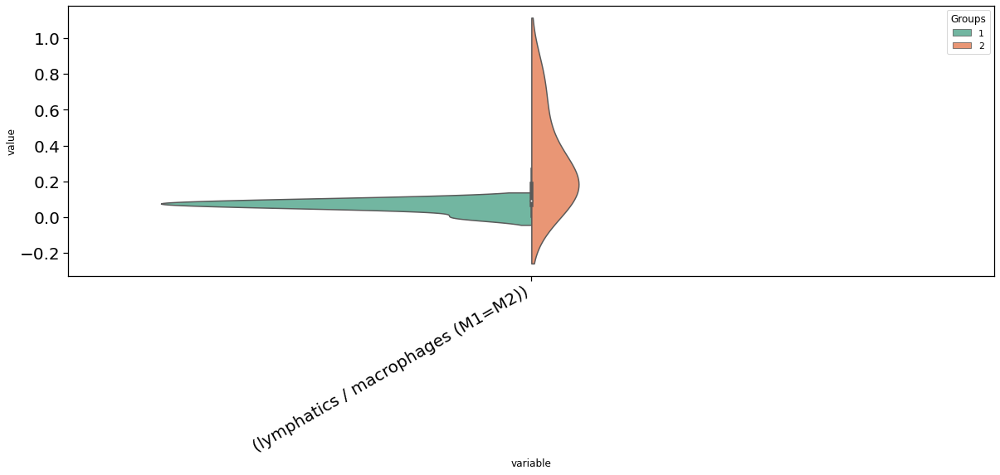

In [94]:
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

In [96]:
# we need to clean-up data for further analyses and visualizations
prop_types_comp_cleaned, select_finite = mosna.clean_data(
    prop_types_comp, 
    method='mixed',
    thresh=0.9,
    )

There are 315 non finite values
Imputing data








-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

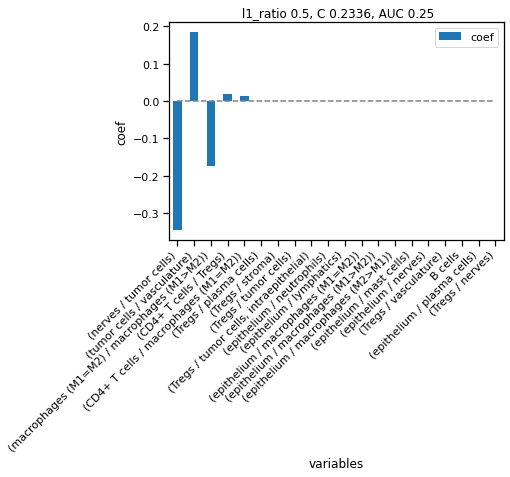

<Figure size 432x288 with 0 Axes>

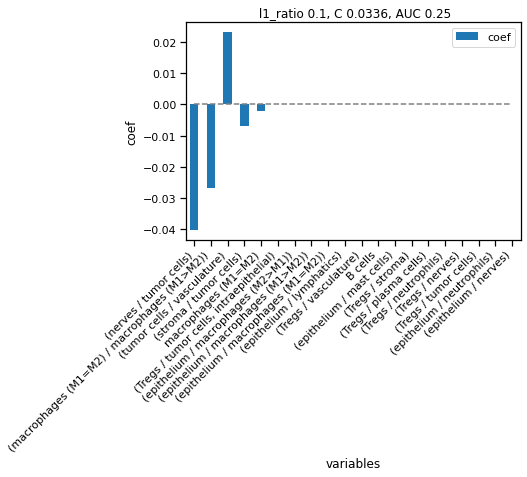

<Figure size 432x288 with 0 Axes>

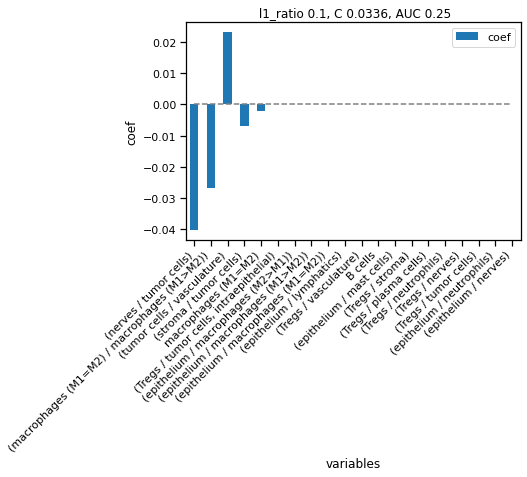

In [98]:
# Elasticnet logistic regression

# def write_log(file, message):
#     print(message)
#     file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = prop_types_comp_cleaned.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    # dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    # dir_save.mkdir(parents=True, exist_ok=True)
    # log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        # plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    # scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
# log_file.close()

Ratios of cell types proportions are not good predictors of response.

##### Second order

In [71]:
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
prop_types_comp = pd.concat([prop_types, mosna.make_composed_variables(prop_types, order=2)], axis=1)

pvals = mosna.find_DE_markers(prop_types_comp, group_ref=1, group_tgt=2, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [72]:
pvals.head(20)

,pval,pval_corr
((lymphatics / macrophages (M1=M2)) / (macrophages (M1=M2) / macrophages (M1>M2))),0.000583,1.0
((CD8+ T cells / nerves) / (Tregs / tumor cells)),0.008159,1.0
((lymphatics / macrophages (M1>M2)) / (stroma / tumor cells)),0.008159,1.0
((lymphatics / tumor cells) / (macrophages (M1=M2) / tumor cells)),0.008159,1.0
(lymphatics / macrophages (M1=M2)),0.008159,1.0
((lymphatics / macrophages (M2>M1)) / (macrophages (M1=M2) / macrophages (M1>M2))),0.008159,1.0
((lymphatics / macrophages (M2>M1)) / (macrophages (M1=M2) / macrophages (M2>M1))),0.008159,1.0
((lymphatics / stroma) / (stroma / tumor cells)),0.008159,1.0
((lymphatics / macrophages (M2>M1)) / (macrophages (M1=M2) / tumor cells)),0.008159,1.0
((macrophages (M1=M2) / macrophages (M1>M2)) / (tumor cells / vasculature)),0.008159,1.0


The first variables related to cell types proportions are composed variables of the 2nd order (ratio of ratios), only `lymphatics / macrophages (M1=M2)` appear in the simpler composed variables, but all corrected pvalues are > 0.05. This is because mosna produced *a lot* of composed variables.

#### Visualization

In [73]:
prop_types_comp

,,B cells,CD4+ T cells,CD8+ T cells,CLA+ leukocytes,"DCs, CD11c+",IDO+ stromal cells,Langerhans cells,Tregs,epithelium,lymphatics,...,"((stroma / tumor cells, intraepithelial) / (stroma / vasculature))","((stroma / tumor cells, intraepithelial) / (tumor cells / tumor cells, intraepithelial))","((stroma / tumor cells, intraepithelial) / (tumor cells / vasculature))","((stroma / tumor cells, intraepithelial) / (tumor cells, intraepithelial / vasculature))","((stroma / vasculature) / (tumor cells / tumor cells, intraepithelial))",((stroma / vasculature) / (tumor cells / vasculature)),"((stroma / vasculature) / (tumor cells, intraepithelial / vasculature))","((tumor cells / tumor cells, intraepithelial) / (tumor cells / vasculature))","((tumor cells / tumor cells, intraepithelial) / (tumor cells, intraepithelial / vasculature))","((tumor cells / vasculature) / (tumor cells, intraepithelial / vasculature))"
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,0.009379,0.013793,0.063172,0.005517,0.000000,0.000000,0.011586,0.096552,0.030897,0.006345,...,3.104167,0.749035,2.325129,37.638021,0.241300,0.749035,12.125000,3.104167,50.248698,16.187500
2,1,0.008392,0.004196,0.006993,0.004196,0.000000,0.000000,0.016783,0.020979,0.008392,0.006993,...,47.500000,1.309677,62.209677,4821.250000,0.027572,1.309677,101.500000,47.500000,3681.250000,77.500000
3,2,0.000465,0.048327,0.043216,0.003253,0.000000,0.000465,0.030204,0.023002,0.408690,0.005576,...,0.313869,0.600733,0.188551,0.375726,1.913962,0.600733,1.197080,0.313869,0.625446,1.992701
4,2,0.058649,0.006590,0.014827,0.000000,0.000000,0.000000,0.005272,0.002965,0.296870,0.002306,...,37.200000,0.360689,13.417629,2648.640000,0.009696,0.360689,71.200000,37.200000,7343.280000,197.400000
5,1,0.000000,0.000000,0.000984,0.000000,0.000000,0.000000,0.004921,0.005906,0.898622,0.000000,...,18.000000,4.857143,87.428571,612.000000,0.269841,4.857143,34.000000,18.000000,126.000000,7.000000
6,2,0.017263,0.041597,0.144135,0.003120,0.000000,0.000624,0.019759,0.074251,0.002288,0.021215,...,11.590909,0.586863,6.802271,357.737603,0.050631,0.586863,30.863636,11.590909,609.576446,52.590909
7,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002494,0.000000,0.000000,0.007481,...,inf,NaN,inf,inf,0.000000,60.000000,inf,inf,inf,inf
8,2,0.004871,0.008524,0.007916,0.002841,0.000000,0.000000,0.001827,0.007713,0.068602,0.009133,...,38.250000,0.418549,16.009491,4164.468750,0.010942,0.418549,108.875000,38.250000,9949.781250,260.125000
9,1,0.000749,0.007113,0.019094,0.000749,0.000000,0.000000,0.004118,0.003370,0.389742,0.001498,...,14.000000,0.471372,6.599201,413.000000,0.033669,0.471372,29.500000,14.000000,876.166667,62.583333


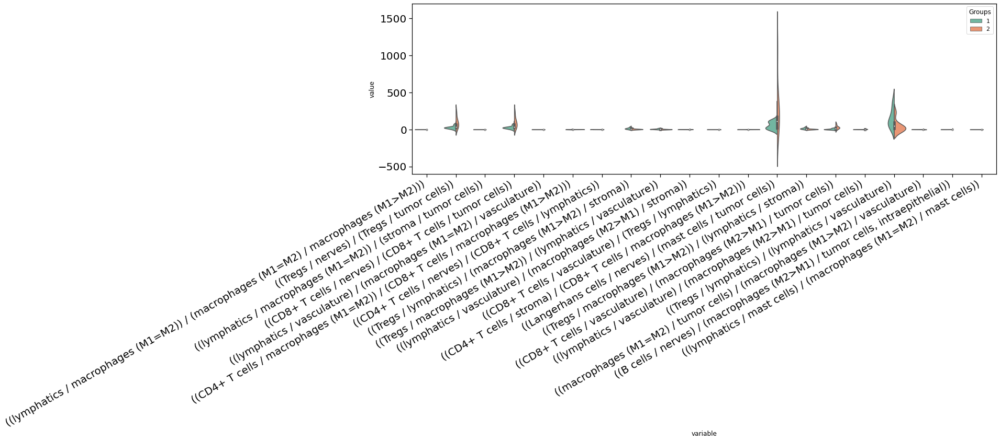

In [74]:
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

Some variables hide the distribution of other variables by their much larger range, we can exclude them to better see the other variables:

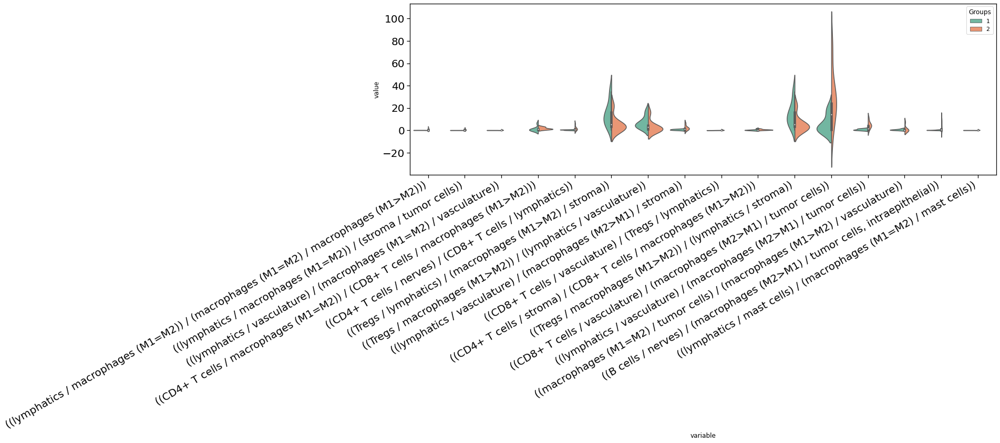

In [75]:
exclude_vars = [
    '((Langerhans cells / nerves) / (mast cells / tumor cells))',
    '((Tregs / lymphatics) / (lymphatics / vasculature))',
    '((Tregs / nerves) / (Tregs / tumor cells))',
    '((CD8+ T cells / nerves) / (CD8+ T cells / tumor cells))',
]
fig, ax = mosna.plot_distrib_groups(
    prop_types_comp, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    exclude_vars=exclude_vars,
    )

### Heatmap of cell types proportions

Here we standardize the columns to make them more comparable between each other and get a more relevant bi-clustering.

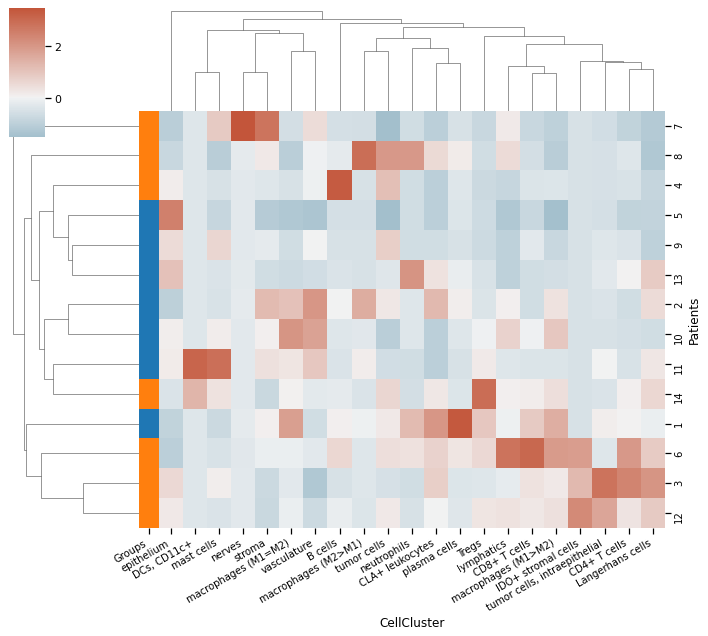

In [76]:
g = mosna.plot_heatmap(
    prop_types.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    )

There is no clear separation of patients into their respective groups from their proportions of cell types scaled across patients.

In [77]:
# we need to clean-up data for further analyses and visualizations
prop_types_comp_cleaned, select_finite = mosna.clean_data(
    prop_types_comp, 
    method='mixed',
    thresh=0.9,
    )

There are 82218 non finite values
Imputing data


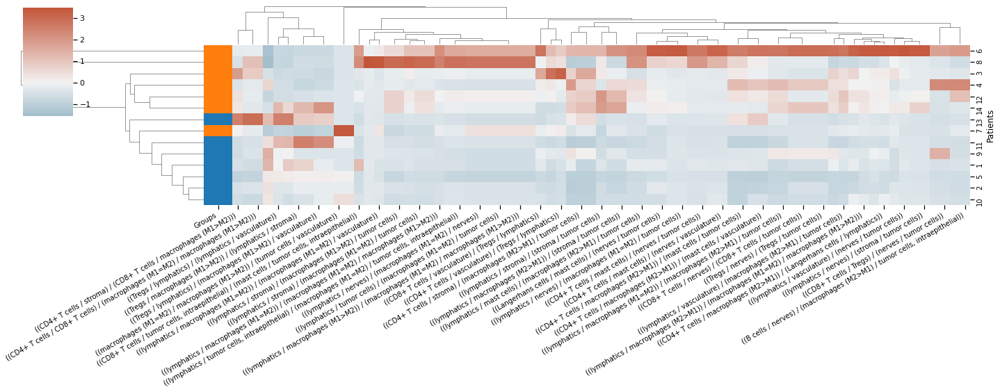

In [78]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index
# or to select only 20 variables:
# best_pval_names = pvals.head(20).index
mosna.plot_heatmap(
    prop_types_comp_cleaned[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    figsize=(20, 12),
    )

By selecting the variables with p-values under 5%, although their corresponding corrected p-values are not significant, we can notice a much better separation between patients groups.  
We must be careful though: we have computed a lot of composed variables, and selected those who happened to have the best p-values.

#### Stepwise logistic regression

In [79]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
model, included = mosna.stepwise_regression(X=prop_types_comp_cleaned, y_name='Groups', y_values=[1, 2], col_names=best_pval_names, verbose=True)

Add  ((Langerhans cells / lymphatics) / (Langerhans cells / macrophages (M1=M2))) with p-value 0.000972217
Add  ((macrophages (M1>M2) / vasculature) / (macrophages (M2>M1) / tumor cells)) with p-value 0.00017107
Add  ((lymphatics / macrophages (M2>M1)) / (macrophages (M1=M2) / macrophages (M1>M2))) with p-value 3.821e-05


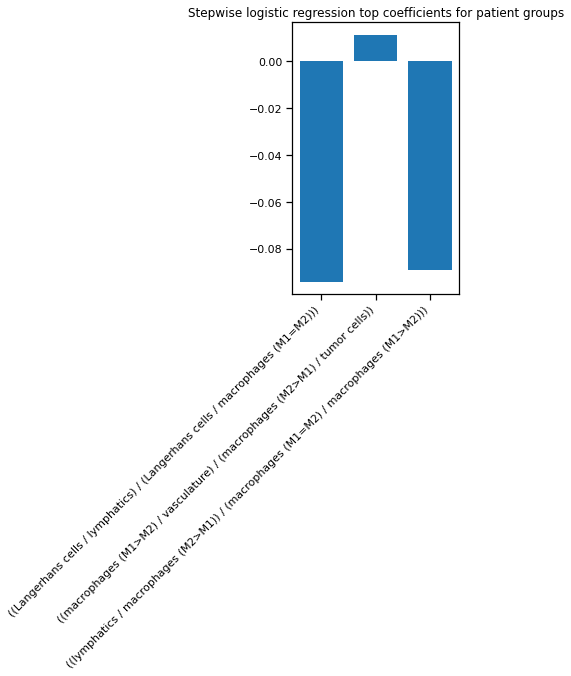

In [80]:
# plot the model's coefficients
coefs = model.params[1:] # skip intercept
nb_coefs = min(coefs.size, 20)
if nb_coefs > 0:
    fig, ax = plt.subplots(figsize=(nb_coefs,5))
    ax.bar(coefs.index, coefs)
    plt.xticks(rotation=45, ha='right');
    title = f"Stepwise logistic regression top coefficients for patient groups"
    plt.title(title)

In [ ]:
X_test, y_test = mosna.extract_X_y(prop_types_comp_cleaned, y_name='Groups', y_values=[1, 2])

# TODO: make scikit-learn model object
# result = permutation_importance(
#     model, X_test, y_test, n_repeats=10, random_state=0, n_jobs=8,
# )
# importances = pd.Series(result.importances_mean, index=prop_types_comp_cleaned.columns)


# Need to automatically extract variables from DataFrame and add constant to run prediction
# # y_pred_proba = model.predict_proba(X_test)[:, 1]
# y_pred = model.predict(X_test)
# score = {
#     # 'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
#     # 'AP' : metrics.average_precision_score(y_test, y_pred_proba),
#     'MCC': metrics.matthews_corrcoef(y_test, y_pred),
#     'balanced accuracy' : metrics.balanced_accuracy_score(y_test, y_pred),
#     'f1' : metrics.f1_score(y_test, y_pred, pos_label=1, average='binary'),
# }
# score







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

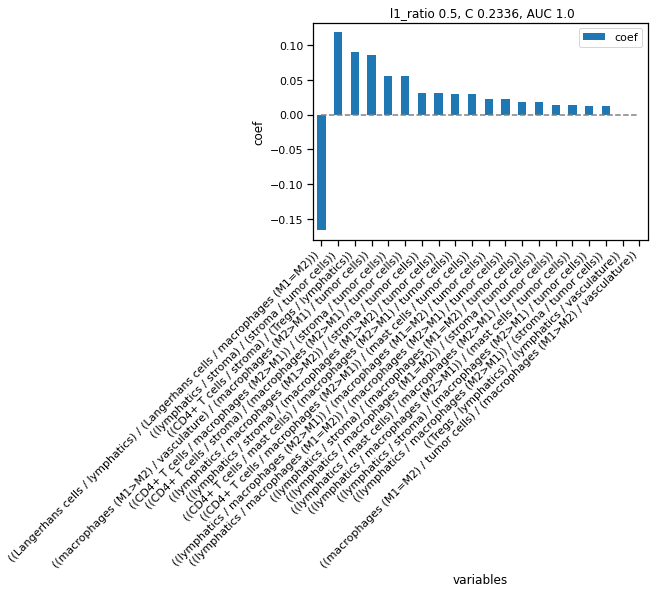

<Figure size 432x288 with 0 Axes>

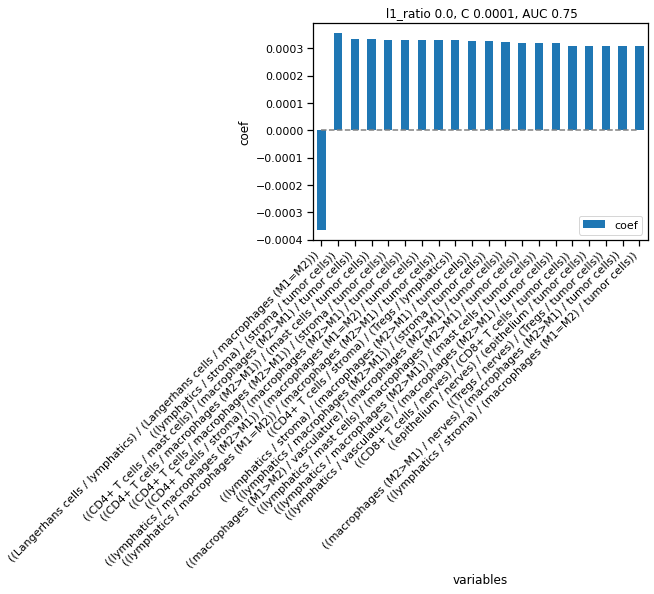

<Figure size 432x288 with 0 Axes>

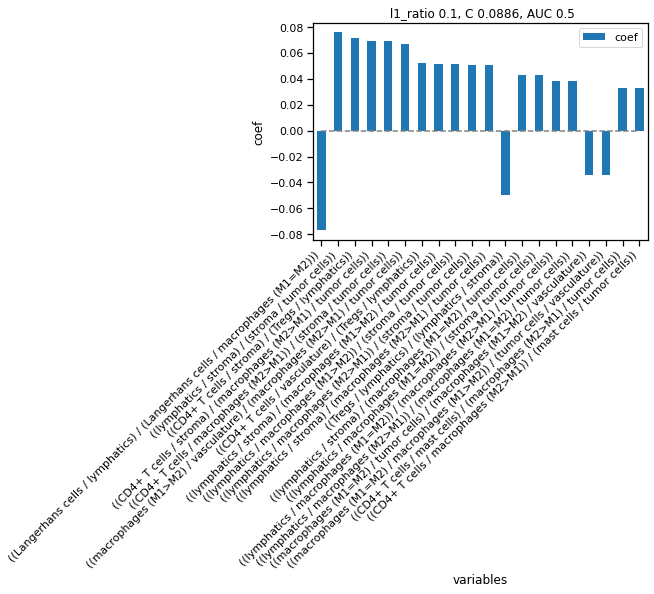

In [90]:
# Elasticnet logistic regression

# def write_log(file, message):
#     print(message)
#     file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = prop_types_comp_cleaned[best_pval_names].reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    # dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    # dir_save.mkdir(parents=True, exist_ok=True)
    # log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        # plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    # scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
# log_file.close()

The first model has a perfect ROC AUC score.  
The second variable involves CD4 and Tregs, which are used in the authors' score to predict response to therapies.

#### Risk ratios

#### Survival analysis

### Marker-positive cells proportions

In [66]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

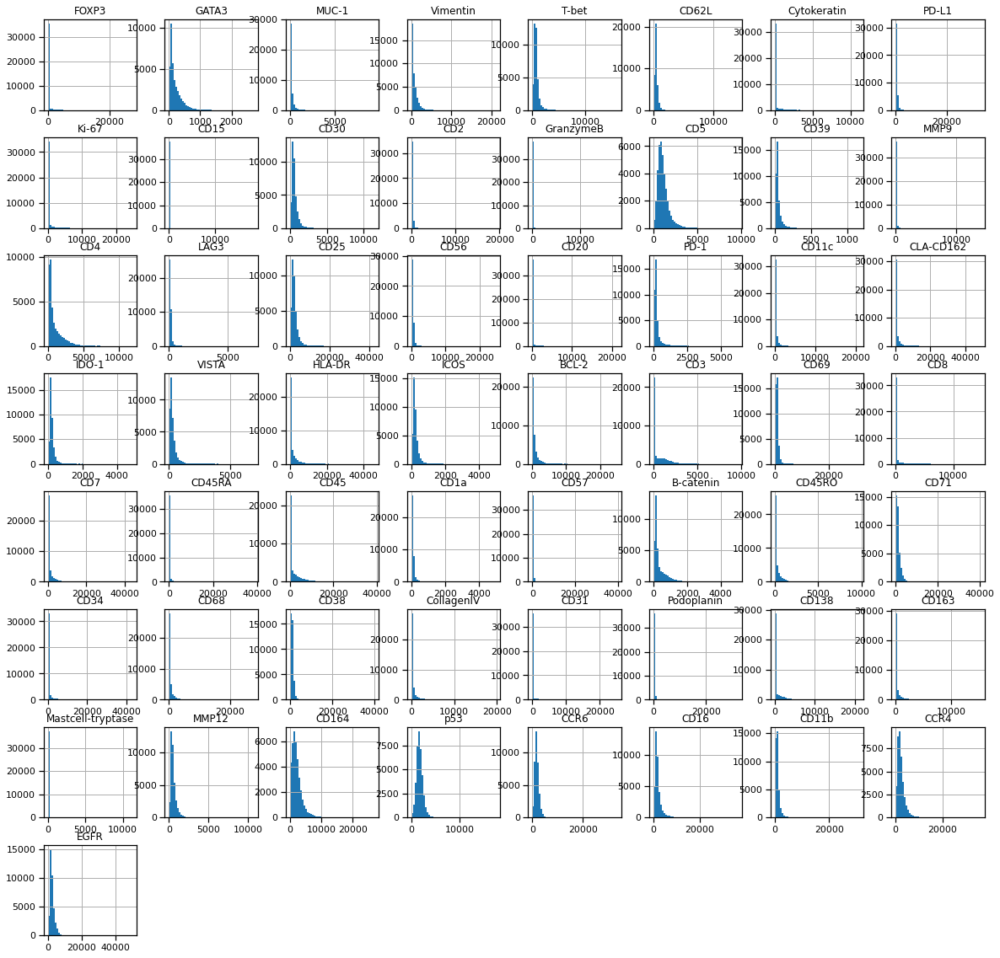

In [68]:
obj[marker_cols].hist(bins=50, figsize=(20, 20));

In [ ]:
marker_thresh = {
    'FOXP3',
    'GATA3',
    'MUC-1',
    'Vimentin',
    'T-bet',
    'CD62L',
    'Cytokeratin',
    'PD-L1',
    'Ki-67',
    'CD15',
    'CD30',
    'CD2',
    'GranzymeB',
    'CD5',
    'CD39',
    'MMP9',
    'CD4',
    'LAG3',
    'CD25',
    'CD56',
    'CD20',
    'PD-1',
    'CD11c',
    'CLA-CD162',
    'IDO-1',
    'VISTA',
    'HLA-DR',
    'ICOS',
    'BCL-2',
    'CD3',
    'CD69',
    'CD8',
    'CD7',
    'CD45RA',
    'CD45',
    'CD1a',
    'CD57',
    'B-catenin',
    'CD45RO',
    'CD71',
    'CD34',
    'CD68',
    'CD38',
    'CollagenIV',
    'CD31',
    'Podoplanin',
    'CD138',
    'CD163',
    'Mastcell-tryptase',
    'MMP12',
    'CD164',
    'p53',
    'CCR6',
    'CD16',
    'CD11b',
    'CCR4',
    'EGFR'
}

We have seen that cell types proportions don't explain response of patient to therapy. But maybe interactions between cell types play a role in response?  
To answer this question we will look at the *mixing matrix* and *assortativity* of tissue networks.  

## Cell types interactions

We compute cell types interactions per sample to aggregate latter per patient or condition.

###  Assortativity and Mixing Matrix

#### Computation of assortativity

In [70]:
grouping = 'FileName'
n_shuffle = 500
load_dir = reconst_dir
save_dir = load_dir / "assortativity"
filename = save_dir / f'network_interactions_stats_grouping-{grouping}_n_shuffle-{n_shuffle}.csv'

if RUN_LONG or not filename.exists():
    print("Computing z-scored assortativity")
    start = time()
    net_stats = mosna.batch_assort_mixmat(nodes_all, edges_all, 
                                    attributes=attribute_uniq, 
                                    groups=obj[grouping], 
                                    n_shuffle=n_shuffle,
                                    parallel_groups=False,
                                    memory_limit='100GB',
                                    save_intermediate_results=False, 
                                    dir_save_interm=save_dir)
    end = time()
    duration = end - start
    print(f"Assortativity took {duration}s for n_suffle {n_shuffle}")

    net_stats.index = net_stats['id']
    net_stats.drop(columns=['id'], inplace=True)

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    net_stats.to_csv(filename)
else:
    print("Loading z-scored assortativity")
    net_stats = pd.read_csv(filename, index_col=0)

Loading z-scored assortativity


In [71]:
net_stats

,# total,% B cells,% CD4+ T cells,% CD8+ T cells,% CLA+ leukocytes,"% DCs, CD11c+",% epithelium,% IDO+ stromal cells,% Langerhans cells,% lymphatics,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,1301,0.017679,0.012298,0.082244,0.009224,0.0,0.069178,0.0,0.016910,0.011530,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,2324,0.004733,0.014630,0.052496,0.003442,0.0,0.009466,0.0,0.008606,0.003442,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,603,0.009950,0.004975,0.008292,0.004975,0.0,0.006633,0.0,0.019900,0.008292,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,2053,0.000487,0.007306,0.014613,0.000974,0.0,0.500731,0.0,0.004384,0.000000,...,-0.781031,-1.563830,-0.543025,NaN,NaN,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,618,0.001618,0.006472,0.033981,0.000000,0.0,0.021036,0.0,0.003236,0.006472,...,-1.144622,-1.455334,-1.300634,NaN,NaN,-6.625174,-0.654349,-5.928589,NaN,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg017,558,0.000000,0.000000,0.001792,0.000000,0.0,0.910394,0.0,0.005376,0.000000,...,-0.257600,-0.151831,-0.198749,NaN,NaN,-0.537285,-0.341667,-0.383833,-0.214535,6.674080
reg005,112,0.000000,0.000000,0.000000,0.000000,0.0,0.017857,0.0,0.000000,0.000000,...,-1.281009,-0.508607,NaN,NaN,NaN,-4.210659,NaN,-1.011409,NaN,5.123528
reg018,458,0.000000,0.000000,0.000000,0.000000,0.0,0.884279,0.0,0.004367,0.000000,...,NaN,-0.169725,-0.261488,NaN,-0.198749,-0.772891,-0.248685,-0.239522,NaN,5.298144


#### Example of Mixing Matrix

In [72]:
sample_id = 'reg001'
# TODO: reimplement the 'RAW' flag
# raw_cols = [x for x in net_stats.columns if x.endswith('RAW') and not x.startswith('assort')]
raw_cols = net_stats.iloc[:, 26:257].columns
z_cols = [x for x in net_stats.columns if x.endswith('Z') and not x.startswith('assort')]

mixmat_raw = mosna.series_to_mixmat(net_stats.loc[sample_id, raw_cols], discard=' RAW').astype(float)
mixmat_z = mosna.series_to_mixmat(net_stats.loc[sample_id, z_cols], discard=' Z').astype(float)
assort_raw = net_stats.loc[sample_id, "assort"]
assort_z = net_stats.loc[sample_id, "assort Z"]

# select_cols = np.logical_and(mixmat_raw.isna(axis=0) == 0, mixmat_z.isna(axis=0) == 0)

Raw assortativity by cell types: 0.97
Z-scored assortativity by cell types: 118.32


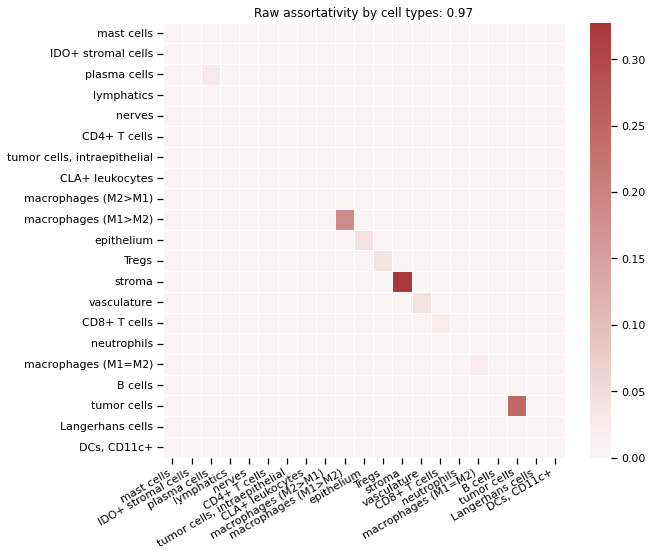

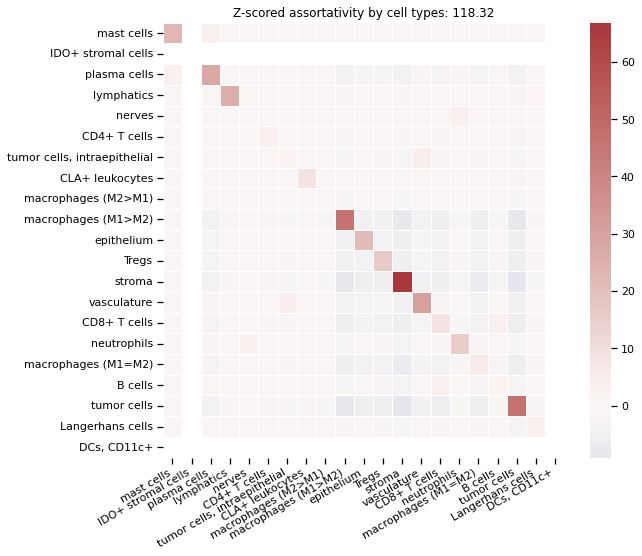

In [73]:
# sns.set_context('talk')
sns.set_context("notebook")
figsize = (9, 8)

title = "Raw assortativity by cell types: {:.2f}".format(assort_raw)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_raw, center=0, cmap="vlag", annot=False, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.xticks(rotation=30, ha='right');
# plt.xticks(rotation=30, ha='right', fontsize=20);
# plt.yticks(fontsize=20);
plt.savefig(save_dir / f"assortativity_raw_sample-{sample_id}", bbox_inches='tight', facecolor='white')

title = "Z-scored assortativity by cell types: {:.2f}".format(assort_z)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_z, center=0, cmap="vlag", annot=False, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.savefig(save_dir / "assortativity_z-scored_sample-{sample_id}", bbox_inches='tight', facecolor='white')

Raw assortativity by cell types: 0.97
Z-scored assortativity by cell types: 118.32


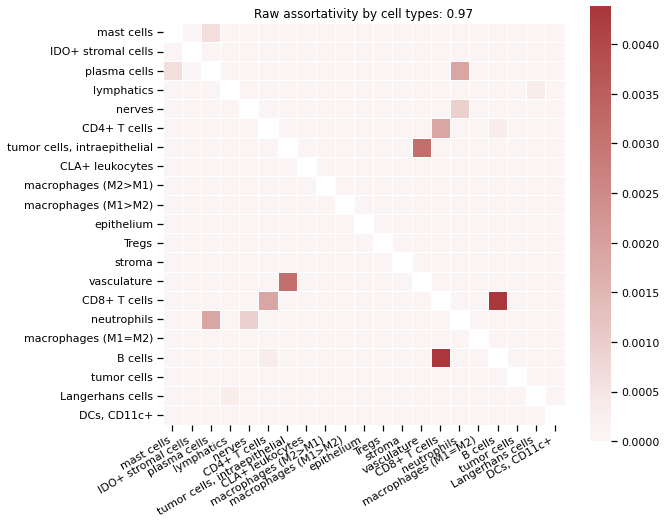

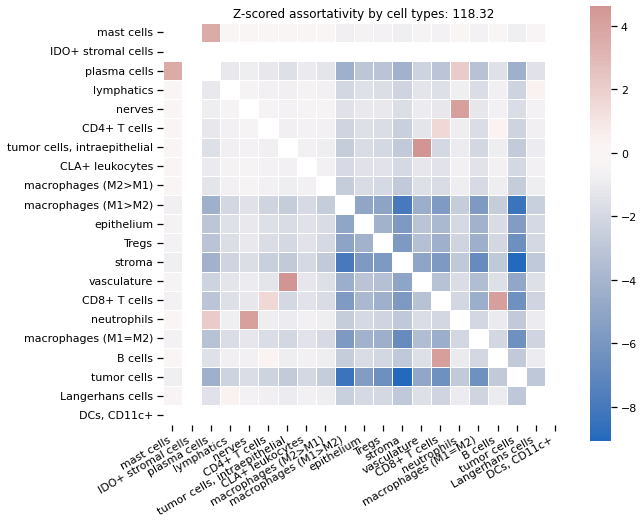

In [74]:
# Hide diagonal
# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(mixmat_raw, dtype=bool))
# Generate a mask for the diagonal
mask = np.eye(mixmat_raw.shape[0], dtype=bool)

# sns.set_context('talk')
sns.set_context("notebook")
figsize = (9, 8)

title = "Raw assortativity by cell types: {:.2f}".format(assort_raw)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_raw, mask=mask, center=0, cmap="vlag", annot=False, square=True, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.xticks(rotation=30, ha='right');#, fontsize=20);
# plt.yticks(fontsize=20);
plt.savefig(save_dir / f"assortativity_raw_sample-{sample_id}_diagonal", bbox_inches='tight', facecolor='white')

title = "Z-scored assortativity by cell types: {:.2f}".format(assort_z)
print(title)
f, ax = plt.subplots(figsize=figsize)
sns.heatmap(mixmat_z, mask=mask, center=0, cmap="vlag", annot=False, square=True, linewidths=.5, ax=ax)
ax.set_title(title)
plt.xticks(rotation=30, ha='right');
plt.savefig(save_dir / "assortativity_z-scored_sample-{sample_id}_diagonal", bbox_inches='tight', facecolor='white')

After removing highly self-assortative cell-types, we can notice that ~~most cell types tend to avoid other cell types in this sample.~~

#### Assortativity and patients response

In [85]:
z_cols = [x for x in net_stats.columns if x.endswith('Z')]
z_net_stats = net_stats[z_cols]

In [86]:
z_net_stats

,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,-0.695376,-0.598468,-1.417702,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,-0.291235,-0.534386,-0.949284,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,97.992931,NaN,-0.135388,15.522748,-0.189234,-0.841861,23.532646,NaN,-0.265827,-0.303167,...,-0.781031,-1.563830,-0.543025,NaN,NaN,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,49.643293,NaN,-0.119159,-0.135388,-0.243207,-0.465250,10.063439,NaN,NaN,NaN,...,-1.144622,-1.455334,-1.300634,NaN,NaN,-6.625174,-0.654349,-5.928589,NaN,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg017,36.384874,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.257600,-0.151831,-0.198749,NaN,NaN,-0.537285,-0.341667,-0.383833,-0.214535,6.674080
reg005,10.062674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1.281009,-0.508607,NaN,NaN,NaN,-4.210659,NaN,-1.011409,NaN,5.123528
reg018,29.590299,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.169725,-0.261488,NaN,-0.198749,-0.772891,-0.248685,-0.239522,NaN,5.298144


In [ ]:
# Have a look at nan values
for name, value in z_net_stats.isna().sum().iteritems():
    print(name, ' ' * (52- len(name)), value)

(array([31., 45., 53., 21., 29., 11.,  1.,  0., 19., 22.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

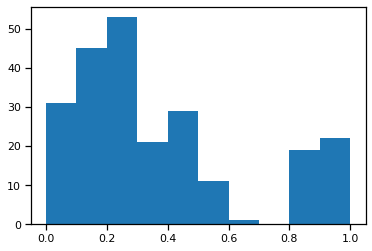

In [78]:
plt.hist(z_net_stats.isna().sum(axis=0) / z_net_stats.shape[0])

In [89]:
nans = z_net_stats.isna().sum(axis=1) / z_net_stats.shape[1]
nans.sort_values()[-10:]

id
reg014    0.418103
reg035    0.422414
reg031    0.426724
reg042    0.482759
reg036    0.482759
reg017    0.646552
reg018    0.724138
reg026    0.810345
reg005    0.844828
reg025    0.909483
dtype: float64

There are some nan values due to interactions between rare cell types that never happened.  
Can can have a first look at the sample, but it would be more informative to have a look at samples before therapy, grouping them per patient.

In [90]:
# we need to clean-up data for further analyses and visualizations
z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats, 
    method='mixed',
    thresh=0.9,
    )
print("Final z_net_stats shape:", z_net_stats_cleaned.shape)

There are 2422 non finite values
Imputing data
Final z_net_stats shape: (29, 210)


In [41]:
# try dropping first observations with too many NaN, then columns:
print("Original z_net_stats shape:", z_net_stats.shape)
z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats, 
    method='drop',
    thresh=0.8,
    axis=1,
    )
unselected = ~select_finite
print(f"There are {unselected.sum()} observations discarded")
print("Intermediate z_net_stats shape:", z_net_stats_cleaned.shape)

z_net_stats_cleaned, select_finite = mosna.clean_data(
    z_net_stats_cleaned, 
    method='mixed',
    thresh=0.7,
    axis=0,
    )
unselected = ~select_finite
print(f"There are {unselected.sum()} variables discarded")
print("Final z_net_stats shape:", z_net_stats_cleaned.shape)

Original z_net_stats shape: (29, 232)
There are 2422 non finite values
There are 3 observations discarded
Intermediate z_net_stats shape: (26, 232)
There are 1827 non finite values
Imputing data
There are 41 variables discarded
Final z_net_stats shape: (26, 191)


/home/alexis/Postdoc_CRCT/Projects/mosna/mosna/mosna.py:1384: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[to_nan] = np.nan
/home/alexis/Postdoc_CRCT/Projects/mosna/mosna/mosna.py:1384: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[to_nan] = np.nan


In [91]:
z_net_stats_cleaned

,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,-0.695376,-0.598468,-1.417702,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,-0.291235,-0.534386,-0.949284,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg006,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg035,97.992931,0.353385,-0.135388,15.522748,-0.189234,-0.841861,23.532646,-0.321044,-0.265827,-0.303167,...,-0.781031,-1.563830,-0.543025,-1.136264,-0.960592,-4.633134,-0.985088,-8.573065,1.618052,25.689617
reg036,49.643293,0.903052,-0.119159,-0.135388,-0.243207,-0.465250,10.063439,-0.136941,-0.236958,-0.289252,...,-1.144622,-1.455334,-1.300634,-0.677810,-0.546862,-6.625174,-0.654349,-5.928589,-0.744839,15.272627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg017,36.384874,0.796432,1.537718,5.712723,-0.339451,-0.690345,7.223679,-0.133720,-0.239864,-0.289477,...,-0.257600,-0.151831,-0.198749,-0.698737,-0.368566,-0.537285,-0.341667,-0.383833,-0.214535,6.674080
reg005,10.062674,0.878780,1.711736,6.303637,-0.354303,-0.724767,7.140771,-0.132751,-0.241182,-0.294548,...,-1.281009,-0.508607,-1.397655,-0.692415,-0.456663,-4.210659,-0.680599,-1.011409,-0.691983,5.123528
reg018,29.590299,0.847082,1.547971,5.645596,-0.344136,-0.689315,7.491060,-0.135058,-0.241237,-0.290860,...,-0.960151,-0.169725,-0.261488,-0.704832,-0.198749,-0.772891,-0.248685,-0.239522,-0.480955,5.298144


Let's add information about patients' group and time of biopsy

In [92]:
if 'FileName' in status.columns:
    status.index = status['FileName']
    status.drop(columns=['FileName'], inplace=True)
    status.index.name = 'id'
# status.sort_values('Spots')
status

,Patients,Groups,Spots
id,,,
reg001,1,1,1
reg002,1,1,2
reg005,2,1,5
reg006,2,1,6
reg009,3,2,9
...,...,...,...
reg046,12,2,46
reg051,13,1,51
reg052,13,1,52


In [93]:
# samples 25, 36, 37, 40, 44 are missing
# pd.set_option('display.max_rows', 10)
# reg026 and reg044 not in biopsies
z_net_stats_cleaned = pd.concat([status, z_net_stats_cleaned], axis=1, join='inner')#.sort_values('Spots')
# z_net_stats_cleaned.drop(columns=['Spots'], inplace=True)
z_net_stats_cleaned

,Patients,Groups,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
id,,,,,,,,,,,,,,,,,,,,,
reg001,1,1,1,118.322045,2.303197,0.319617,3.737300,4.237213,1.592328,8.319898,...,-1.549946,-0.508612,-0.969886,-1.717401,-2.302747,-5.030768,-3.364859,-4.921611,4.617037,30.524675
reg002,1,1,2,137.208092,-0.231748,0.942463,6.068523,7.768863,2.053927,28.931623,...,-2.386706,-0.735220,-1.505281,-1.103783,-2.390947,-5.118748,-4.635056,-6.358490,4.408911,34.495248
reg005,2,1,5,10.062674,0.878780,1.711736,6.303637,-0.354303,-0.724767,7.140771,...,-1.281009,-0.508607,-1.397655,-0.692415,-0.456663,-4.210659,-0.680599,-1.011409,-0.691983,5.123528
reg006,2,1,6,55.655024,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,...,-2.679097,-0.520487,-0.858949,-0.397250,-0.719195,-4.577619,-1.436174,-4.268267,-0.518298,21.647247
reg009,3,2,9,147.886215,0.595291,-0.553307,31.125710,-0.529696,-4.215097,30.693043,...,-0.836447,-0.658226,-0.358074,-1.161119,-0.372213,-2.332969,-1.347953,-3.170252,-2.498158,45.250934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,12,2,46,58.320174,-0.127515,2.069256,14.043893,-0.536480,-0.975387,2.046266,...,-0.681015,-0.761447,-0.505641,-0.274784,-0.581513,-2.918940,-1.759396,-3.840053,-1.686975,29.846570
reg051,13,1,51,73.188113,-0.044766,2.821890,8.566951,-0.163383,-0.647322,8.224060,...,-1.112099,-1.256780,-0.759326,-1.804454,-1.129151,-5.246719,-1.594605,-5.598527,-1.216330,64.150258
reg052,13,1,52,104.690865,-0.089803,-0.312898,13.080265,-0.182989,-0.425656,6.667424,...,-0.510580,-0.335473,-0.793651,-1.026081,-0.337292,-2.082092,-1.294113,-3.159960,-0.623933,33.387218


In [94]:
pvals = mosna.find_DE_markers(z_net_stats_cleaned.iloc[:, 1:], group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [95]:
pvals.head(20)

,pval,pval_corr
CD8+ T cells - B cells Z,0.000003,0.000724
neutrophils - neutrophils Z,0.000152,0.016046
"tumor cells, intraepithelial - tumor cells, intraepithelial Z",0.000812,0.042852
nerves - nerves Z,0.000812,0.042852
CD8+ T cells - CD4+ T cells Z,0.001251,0.052781
neutrophils - nerves Z,0.001837,0.055384
vasculature - vasculature Z,0.001837,0.055384
tumor cells - B cells Z,0.002862,0.075496
Langerhans cells - Langerhans cells Z,0.003662,0.085854
tumor cells - macrophages (M1>M2) Z,0.004940,0.104241


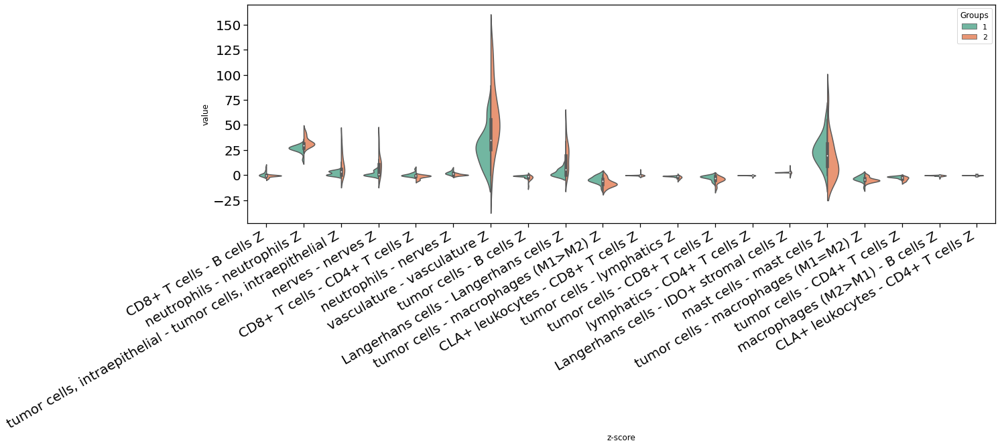

In [96]:
reload(mosna)
fig, ax = mosna.plot_distrib_groups(
    z_net_stats_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    )

Some variables hide the distribution of other variables by their much larger range, we can exclude them to better see the other variables:

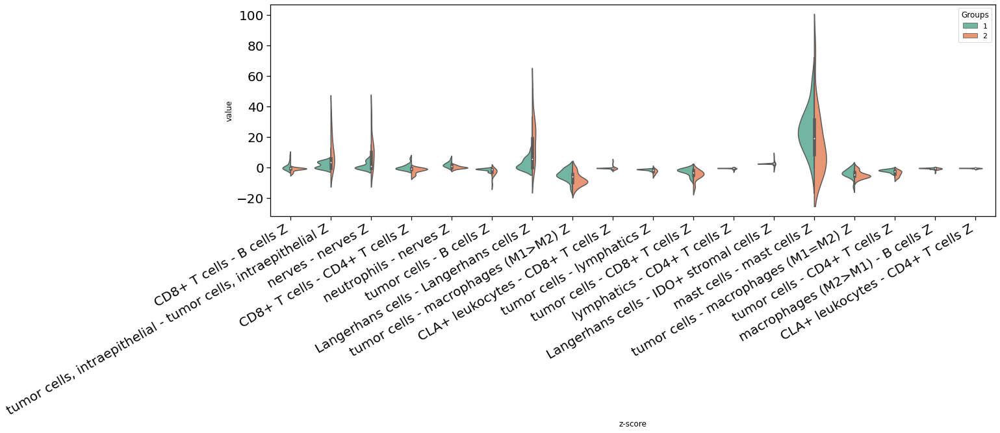

In [97]:
exclude_vars = [
    'assort Z',
    'vasculature - vasculature Z',
    'neutrophils - neutrophils Z',
    'tumor cells - tumor cells Z',
]
fig, ax = mosna.plot_distrib_groups(
    z_net_stats_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    exclude_vars=exclude_vars,
    )

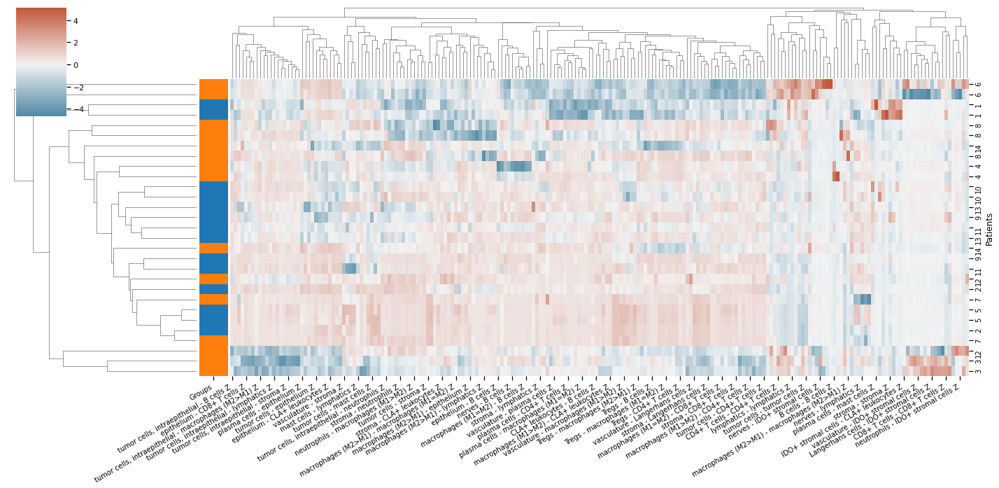

In [98]:
mosna.plot_heatmap(
    z_net_stats_cleaned, 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    skip_cols=['assort Z'],
    )

Samples are a bit clustered into consistent response groups, but it's not incredible.  
We also need to aggregate samples per patient and time of biopsy, that may help us correcting nan values and have more variables, and hopefully better clusters.

#### Samples aggregation per patient and time point.

In [99]:
z_net_stats = pd.concat([status, z_net_stats], axis=1, join='inner')#.sort_values('Spots')
# z_net_stats.drop(columns=['Spots'], inplace=True)

In [100]:
# good news: the mean of aggregated data already ignores nans
z_net_stats_agg = z_net_stats.groupby(['Patients', 'Groups']).mean()
z_net_stats_agg

,,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,1.5,127.765069,1.035724,0.631040,4.902911,6.003038,1.823127,18.625760,-0.493305,-0.566427,...,-1.968326,-0.621916,-1.237584,-1.410592,-2.346847,-5.074758,-3.999958,-5.640050,4.512974,32.509961
2,1,5.5,32.858849,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,...,-1.980053,-0.514547,-0.858949,-0.397250,-0.719195,-4.394139,-1.436174,-2.639838,-0.518298,13.385387
3,2,9.5,138.616416,NaN,-0.553307,24.884557,-0.529696,-3.575596,32.704188,-0.119159,-0.901588,...,-0.972747,-0.913132,-0.665754,NaN,-0.372213,-2.945860,-1.539348,-3.793203,-2.542240,60.206274
4,2,13.5,93.038644,45.875689,-0.469180,1.022058,-1.638282,-0.664937,8.211085,NaN,NaN,...,-0.881655,-1.038831,-0.842403,NaN,-0.550534,-5.252879,-0.868580,-8.796836,-0.627303,70.429987
5,1,17.5,32.987587,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.257600,-0.160778,-0.230118,NaN,-0.198749,-0.655088,-0.295176,-0.311678,-0.214535,5.986112
6,2,21.5,135.110854,8.737449,5.091435,28.393471,-3.510018,-5.323816,15.450405,-0.524361,-0.820920,...,-1.581685,-1.096799,-0.658226,-1.259478,-1.436535,-6.364781,-4.704985,-7.423277,-1.078396,118.762569
7,2,25.5,19.212448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-0.954294,-3.009268,NaN,NaN,-3.055820,NaN,-0.445798,NaN,14.859733
8,2,30.0,97.791916,-0.220003,-0.000031,12.226180,-0.388645,-0.541957,8.565034,-0.333506,-0.463886,...,-6.369172,-0.365992,-1.422617,-1.642777,-1.241843,-7.056130,-1.263572,-9.652719,-0.657945,62.035321
9,1,35.5,73.818112,NaN,-0.127273,7.693680,-0.216220,-0.653556,16.798042,NaN,-0.265827,...,-0.962827,-1.509582,-0.921830,NaN,NaN,-5.629154,-0.819719,-7.250827,1.618052,20.481122


In [101]:
# Have a look at nan values
for name, value in z_net_stats_agg.isna().sum().iteritems():
    print(name, ' ' * (52- len(name)), value)

Spots                                                 0
assort Z                                              0
B cells - B cells Z                                   4
CD4+ T cells - B cells Z                              3
CD4+ T cells - CD4+ T cells Z                         2
CD8+ T cells - B cells Z                              2
CD8+ T cells - CD4+ T cells Z                         2
CD8+ T cells - CD8+ T cells Z                         2
CLA+ leukocytes - B cells Z                           6
CLA+ leukocytes - CD4+ T cells Z                      5
CLA+ leukocytes - CD8+ T cells Z                      5
CLA+ leukocytes - CLA+ leukocytes Z                   6
DCs, CD11c+ - B cells Z                               13
DCs, CD11c+ - CD4+ T cells Z                          12
DCs, CD11c+ - CD8+ T cells Z                          12
DCs, CD11c+ - CLA+ leukocytes Z                       13
DCs, CD11c+ - DCs, CD11c+ Z                           14
epithelium - B cells Z                     

(array([95., 40., 19., 15., 21.,  1.,  1., 17., 17.,  7.]),
 array([0.        , 0.04827586, 0.09655172, 0.14482759, 0.19310345,
        0.24137931, 0.28965517, 0.33793103, 0.3862069 , 0.43448276,
        0.48275862]),
 <BarContainer object of 10 artists>)

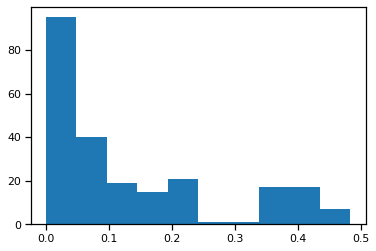

In [102]:
plt.hist(z_net_stats_agg.isna().sum(axis=0) / z_net_stats.shape[0])

In [103]:
pd.set_option('display.max_rows', 20)
z_net_stats_agg.isna().sum(axis=1) / z_net_stats_agg.shape[1]

Patients  Groups
1         1         0.175966
2         1         0.180258
3         2         0.188841
4         2         0.334764
5         1         0.592275
6         2         0.094421
7         2         0.806867
8         2         0.184549
9         1         0.356223
10        1         0.257511
11        1         0.347639
12        2         0.094421
13        1         0.175966
14        2         0.107296
dtype: float64

There are some nan values due to interactions between rare cell types that never happened.  
Can can have a first look at the sample, but it would be more informative to have a look at samples before therapy, grouping them per patient.

In [104]:
print("Original z_net_stats_agg shape:", z_net_stats_agg.shape)
z_net_agg_cleaned, select_finite = mosna.clean_data(
    z_net_stats_agg, 
    method='mixed',
    thresh=0.9,
    )
print("Final z_net_stats_agg shape:", z_net_agg_cleaned.shape)

Original z_net_stats_agg shape: (14, 233)
There are 908 non finite values
Imputing data
Final z_net_stats_agg shape: (14, 226)


In [105]:
pvals = mosna.find_DE_markers(z_net_agg_cleaned.iloc[:, 1:], group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [106]:
pvals.head(20)

,pval,pval_corr
neutrophils - neutrophils Z,0.000583,0.131119
"tumor cells, intraepithelial - tumor cells, intraepithelial Z",0.008159,0.397727
CD8+ T cells - B cells Z,0.008159,0.397727
"tumor cells, intraepithelial - B cells Z",0.008159,0.397727
assort Z,0.053030,0.397727
lymphatics - CD4+ T cells Z,0.053030,0.397727
"lymphatics - DCs, CD11c+ Z",0.053030,0.397727
"macrophages (M1=M2) - DCs, CD11c+ Z",0.053030,0.397727
"macrophages (M1>M2) - DCs, CD11c+ Z",0.053030,0.397727
"macrophages (M2>M1) - DCs, CD11c+ Z",0.053030,0.397727


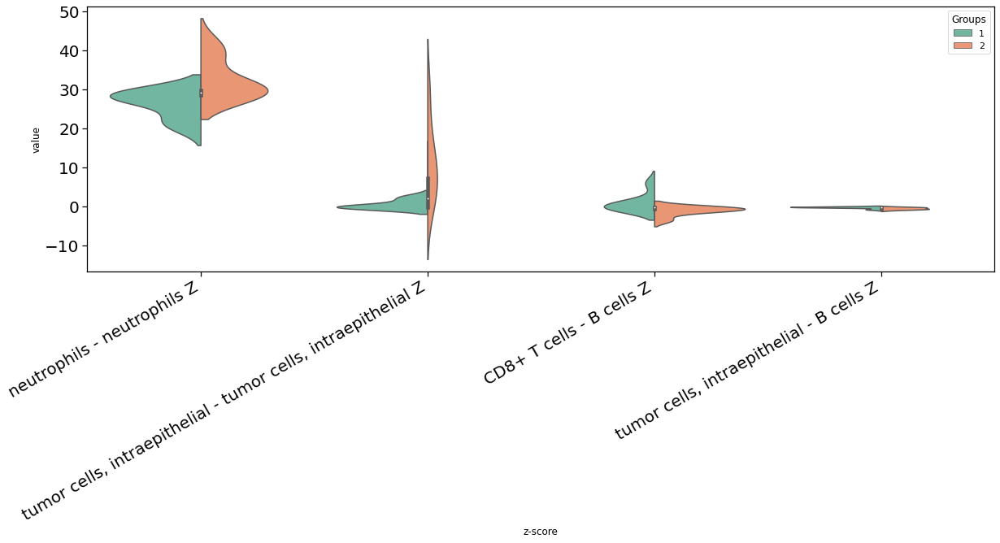

In [107]:
fig, ax = mosna.plot_distrib_groups(
    z_net_agg_cleaned, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    var_name='z-score',
    )

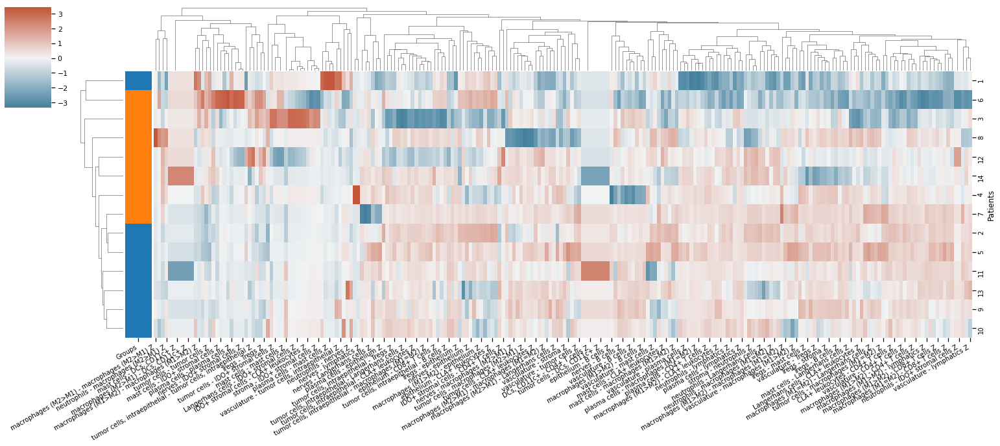

In [108]:
mosna.plot_heatmap(
    z_net_agg_cleaned.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )
plt.savefig(save_dir / "assortativity_z-scored_clustering-patients", bbox_inches='tight', facecolor='white')

In [118]:
# mosna.plot_heatmap(
#     z_net_agg_cleaned.reset_index(), 
#     obs_labels='Patients', 
#     group_var='Groups', 
#     groups=[1, 2],
#     figsize=(80, 12),
#     dendrogram_ratio=[0.05, 0.2],
#     cbar_pos=(-0.07, 0.8, 0.05, 0.18)
#     )
# plt.savefig(save_dir / "assortativity_z-scored_clustering-patients_wide", bbox_inches='tight', facecolor='white')

#### Logistic regression on interaction coefficients

In [110]:
z_net_agg_cleaned

,,Spots,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,...,vasculature - macrophages (M2>M1) Z,vasculature - mast cells Z,vasculature - nerves Z,vasculature - neutrophils Z,vasculature - plasma cells Z,vasculature - stroma Z,vasculature - Tregs Z,vasculature - tumor cells Z,"vasculature - tumor cells, intraepithelial Z",vasculature - vasculature Z
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,1.5,127.765069,1.035724,0.631040,4.902911,6.003038,1.823127,18.625760,-0.493305,-0.566427,...,-1.968326,-0.621916,-1.237584,-1.410592,-2.346847,-5.074758,-3.999958,-5.640050,4.512974,32.509961
2,1,5.5,32.858849,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,...,-1.980053,-0.514547,-0.858949,-0.397250,-0.719195,-4.394139,-1.436174,-2.639838,-0.518298,13.385387
3,2,9.5,138.616416,0.441319,-0.553307,24.884557,-0.529696,-3.575596,32.704188,-0.119159,-0.901588,...,-0.972747,-0.913132,-0.665754,-1.098054,-0.372213,-2.945860,-1.539348,-3.793203,-2.542240,60.206274
4,2,13.5,93.038644,45.875689,-0.469180,1.022058,-1.638282,-0.664937,8.211085,-0.189824,-0.339773,...,-0.881655,-1.038831,-0.842403,-0.904738,-0.550534,-5.252879,-0.868580,-8.796836,-0.627303,70.429987
5,1,17.5,32.987587,0.100203,0.718808,5.368425,-0.022184,0.151678,11.922889,-0.189779,-0.237101,...,-0.257600,-0.160778,-0.230118,-0.563785,-0.198749,-0.655088,-0.295176,-0.311678,-0.214535,5.986112
6,2,21.5,135.110854,8.737449,5.091435,28.393471,-3.510018,-5.323816,15.450405,-0.524361,-0.820920,...,-1.581685,-1.096799,-0.658226,-1.259478,-1.436535,-6.364781,-4.704985,-7.423277,-1.078396,118.762569
7,2,25.5,19.212448,0.139954,0.791565,5.963435,-0.104734,0.040978,11.277219,-0.191499,-0.238348,...,-1.157773,-0.954294,-3.009268,-0.553397,-0.509353,-3.055820,-1.132940,-0.445798,-0.420431,14.859733
8,2,30.0,97.791916,-0.220003,-0.000031,12.226180,-0.388645,-0.541957,8.565034,-0.333506,-0.463886,...,-6.369172,-0.365992,-1.422617,-1.642777,-1.241843,-7.056130,-1.263572,-9.652719,-0.657945,62.035321
9,1,35.5,73.818112,7.739196,-0.127273,7.693680,-0.216220,-0.653556,16.798042,-0.194055,-0.265827,...,-0.962827,-1.509582,-0.921830,-0.907662,-0.619125,-5.629154,-0.819719,-7.250827,1.618052,20.481122


Add  Langerhans cells - Langerhans cells Z with p-value 0.0053547
Add  macrophages (M1=M2) - lymphatics Z with p-value 0.000699537
Add  nerves - nerves Z              with p-value 0.00409421
Add  vasculature - macrophages (M1=M2) Z with p-value 0.000565896
Add  mast cells - CD8+ T cells Z    with p-value 0.00570139
Add  mast cells - macrophages (M1>M2) Z with p-value 0.0351673
Add  plasma cells - plasma cells Z  with p-value 0.0346666
Add  CD4+ T cells - B cells Z       with p-value 0.0385667
Add  mast cells - mast cells Z      with p-value 0.00575502
Add  stroma - Langerhans cells Z    with p-value 0.00375342
Add  plasma cells - macrophages (M2>M1) Z with p-value 0.00205694
Add  IDO+ stromal cells - CD4+ T cells Z with p-value 0.00332534


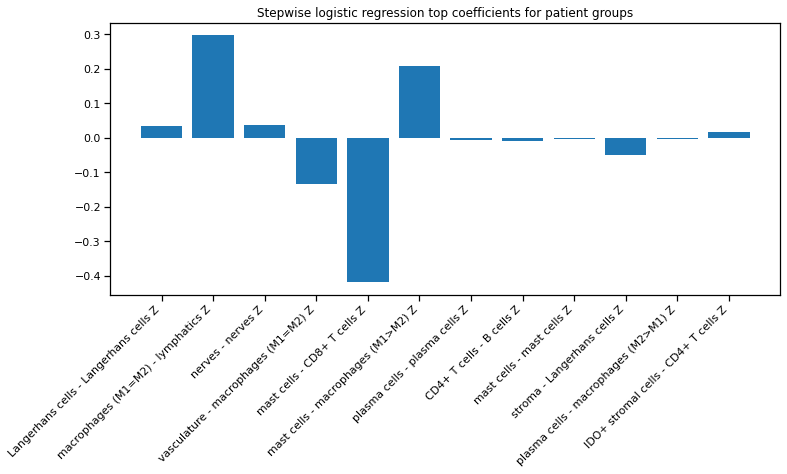

In [111]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=z_net_agg_cleaned.drop(columns=['Spots']), y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no interaction statistically related to response group")

TODO: Compute performance metrics for SWLR models







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

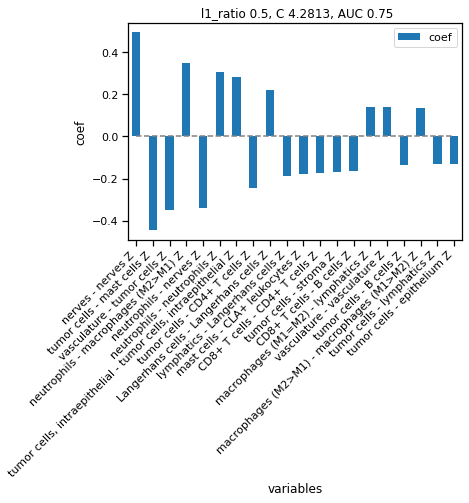

<Figure size 432x288 with 0 Axes>

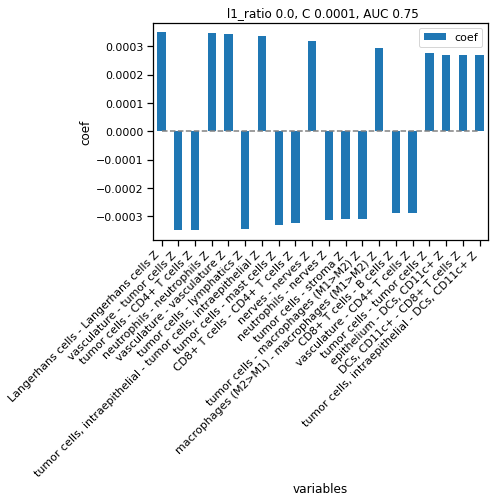

<Figure size 432x288 with 0 Axes>

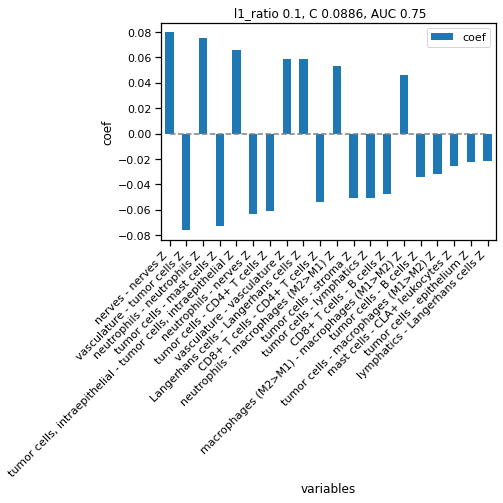

In [112]:
# Elasticnet logistic regression

def write_log(file, message):
    print(message)
    file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = z_net_agg_cleaned.drop(columns=['Spots']).reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    # dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    # dir_save.mkdir(parents=True, exist_ok=True)
    # log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        # plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    # scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
# log_file.close()

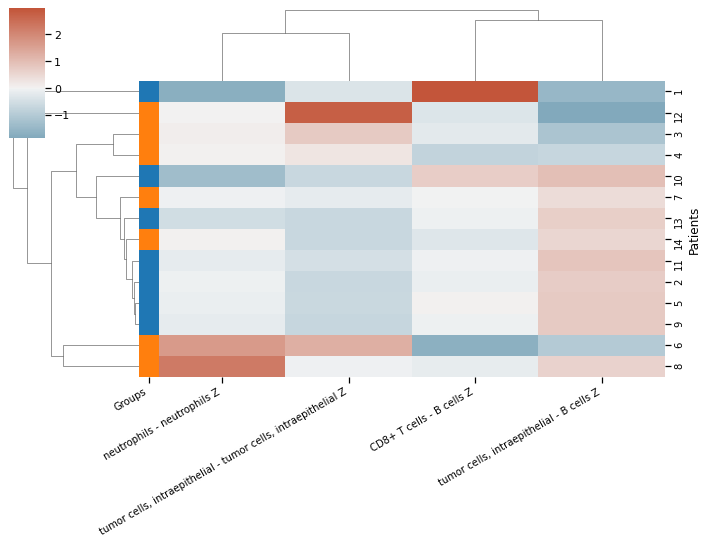

In [113]:
# use the most statistically relevant variable separating groups
# Note: that's to have a clue, do not use this method for real,
# it's a tautology!

nb_vars = np.sum(pvals['pval'] <= 0.05)
# nb_vars = min(nb_vars, 20)
marker_vars = pvals.sort_values(by='pval', ascending=True).head(nb_vars).index.tolist()

mosna.plot_heatmap(
    z_net_agg_cleaned[marker_vars].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    )

Selecting the significant mixing coefficients doesn't provide a good bi-clustering of patients.

### Ratio of MM elements

In [128]:
pvals = mosna.find_DE_markers(z_net_agg_cleaned.drop(columns=['Spots']).copy(), group_ref=1, group_tgt=2, group_var='Groups', composed_vars=False)
pvals = pvals.sort_values(by='pval', ascending=True)
pvals

,pval,pval_corr
neutrophils - neutrophils Z,0.000583,0.131119
"tumor cells, intraepithelial - tumor cells, intraepithelial Z",0.008159,0.397727
CD8+ T cells - B cells Z,0.008159,0.397727
"tumor cells, intraepithelial - B cells Z",0.008159,0.397727
assort Z,0.053030,0.397727
...,...,...
stroma - macrophages (M2>M1) Z,0.962704,0.980128
plasma cells - epithelium Z,0.999961,0.999961
stroma - epithelium Z,0.999961,0.999961
mast cells - macrophages (M2>M1) Z,0.999961,0.999961


In [130]:
# `find_DE_markers` can make composite variables, but we do it beforehand to reuse them
z_agg_ratios = pd.concat([z_net_agg_cleaned.drop(columns=['Spots']).copy(), mosna.make_composed_variables(z_net_agg_cleaned.drop(columns=['Spots']).copy(), order=1)], axis=1)

pvals = mosna.find_DE_markers(z_agg_ratios, group_ref=1, group_tgt=2, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [131]:
pvals.head(20)

,pval,pval_corr
(neutrophils - neutrophils Z / stroma - IDO+ stromal cells Z),0.000583,0.860706
(lymphatics - CD4+ T cells Z / macrophages (M1=M2) - CD4+ T cells Z),0.000583,0.860706
neutrophils - neutrophils Z,0.000583,0.860706
(Langerhans cells - Langerhans cells Z / macrophages (M1>M2) - Langerhans cells Z),0.000583,0.860706
"(mast cells - DCs, CD11c+ Z / neutrophils - neutrophils Z)",0.000583,0.860706
"(epithelium - DCs, CD11c+ Z / neutrophils - neutrophils Z)",0.000583,0.860706
(Langerhans cells - Langerhans cells Z / macrophages (M1=M2) - Langerhans cells Z),0.000583,0.860706
(neutrophils - macrophages (M1>M2) Z / tumor cells - CD4+ T cells Z),0.000583,0.860706
(lymphatics - CD4+ T cells Z / neutrophils - macrophages (M1=M2) Z),0.000583,0.860706
(Langerhans cells - Langerhans cells Z / plasma cells - macrophages (M1>M2) Z),0.000583,0.860706


In [132]:
z_agg_ratios

,,assort Z,B cells - B cells Z,CD4+ T cells - B cells Z,CD4+ T cells - CD4+ T cells Z,CD8+ T cells - B cells Z,CD8+ T cells - CD4+ T cells Z,CD8+ T cells - CD8+ T cells Z,CLA+ leukocytes - B cells Z,CLA+ leukocytes - CD4+ T cells Z,CLA+ leukocytes - CD8+ T cells Z,...,(vasculature - stroma Z / vasculature - Tregs Z),(vasculature - stroma Z / vasculature - tumor cells Z),"(vasculature - stroma Z / vasculature - tumor cells, intraepithelial Z)",(vasculature - stroma Z / vasculature - vasculature Z),(vasculature - Tregs Z / vasculature - tumor cells Z),"(vasculature - Tregs Z / vasculature - tumor cells, intraepithelial Z)",(vasculature - Tregs Z / vasculature - vasculature Z),"(vasculature - tumor cells Z / vasculature - tumor cells, intraepithelial Z)",(vasculature - tumor cells Z / vasculature - vasculature Z),"(vasculature - tumor cells, intraepithelial Z / vasculature - vasculature Z)"
Patients,Groups,,,,,,,,,,,,,,,,,,,,,
1,1,127.765069,1.035724,0.631040,4.902911,6.003038,1.823127,18.625760,-0.493305,-0.566427,-1.183493,...,1.268703,0.899772,-1.124482,-0.156099,0.709206,-0.886324,-0.123038,-1.249741,-0.173487,0.138818
2,1,32.858849,-0.177131,-0.257600,-0.127515,-0.280056,-0.201949,12.910897,-0.181818,-0.149983,-0.217241,...,3.059615,1.664549,8.478013,-0.328279,0.544039,2.770941,-0.107294,5.093281,-0.197218,-0.038721
3,2,138.616416,0.441319,-0.553307,24.884557,-0.529696,-3.575596,32.704188,-0.119159,-0.901588,-0.849985,...,1.913707,0.776615,1.158765,-0.048929,0.405817,0.605508,-0.025568,1.492071,-0.063003,-0.042226
4,2,93.038644,45.875689,-0.469180,1.022058,-1.638282,-0.664937,8.211085,-0.189824,-0.339773,-0.374884,...,6.047665,0.597133,8.373754,-0.074583,0.098738,1.384626,-0.012333,14.023271,-0.124902,-0.008907
5,1,32.987587,0.100203,0.718808,5.368425,-0.022184,0.151678,11.922889,-0.189779,-0.237101,-0.298550,...,2.219314,2.101813,3.053532,-0.109435,0.947055,1.375890,-0.049310,1.452809,-0.052067,-0.035839
6,2,135.110854,8.737449,5.091435,28.393471,-3.510018,-5.323816,15.450405,-0.524361,-0.820920,1.838965,...,1.352774,0.857408,5.902083,-0.053592,0.633815,4.362949,-0.039617,6.883631,-0.062505,-0.009080
7,2,19.212448,0.139954,0.791565,5.963435,-0.104734,0.040978,11.277219,-0.191499,-0.238348,-0.304200,...,2.697249,6.854718,7.268306,-0.205644,2.541374,2.694711,-0.076242,1.060336,-0.030000,-0.028293
8,2,97.791916,-0.220003,-0.000031,12.226180,-0.388645,-0.541957,8.565034,-0.333506,-0.463886,-0.409522,...,5.584271,0.730999,10.724504,-0.113744,0.130903,1.920484,-0.020369,14.671020,-0.155600,-0.010606
9,1,73.818112,7.739196,-0.127273,7.693680,-0.216220,-0.653556,16.798042,-0.194055,-0.265827,-0.303167,...,6.867178,0.776347,-3.478971,-0.274846,0.113052,-0.506609,-0.040023,-4.481209,-0.354025,0.079002


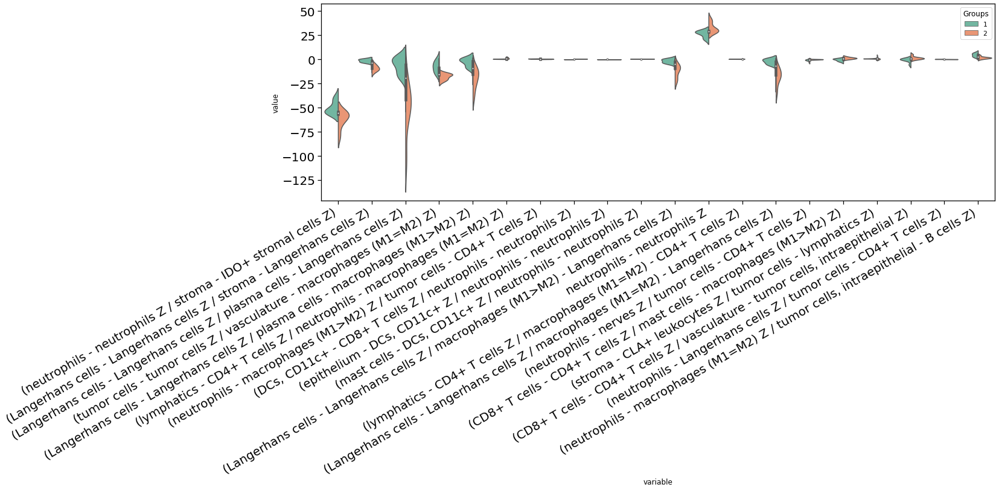

In [133]:
fig, ax = mosna.plot_distrib_groups(
    z_agg_ratios, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=pvals, 
    pval_col='pval', 
    max_cols=20, 
    multi_ind_to_col=True,
    )

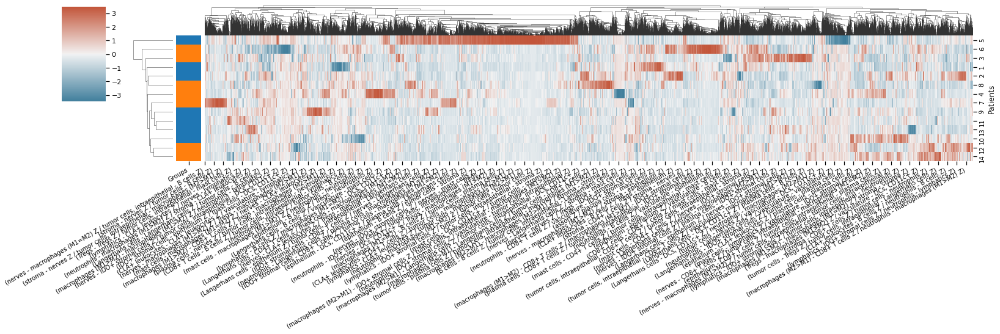

In [138]:
mosna.plot_heatmap(
    z_agg_ratios.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(20, 12),
    dendrogram_ratio=[0.05, 0.2],
    cbar_pos=(-0.07, 0.8, 0.05, 0.18)
    )
# plt.savefig(save_dir / "assortativity_z-scored_ratios_clustering-patients", bbox_inches='tight', facecolor='white')

In [ ]:
# # we need to clean-up data for further analyses and visualizations
# prop_types_comp_cleaned, select_finite = mosna.clean_data(
#     prop_types_comp, 
#     method='mixed',
#     thresh=0.9,
#     )







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

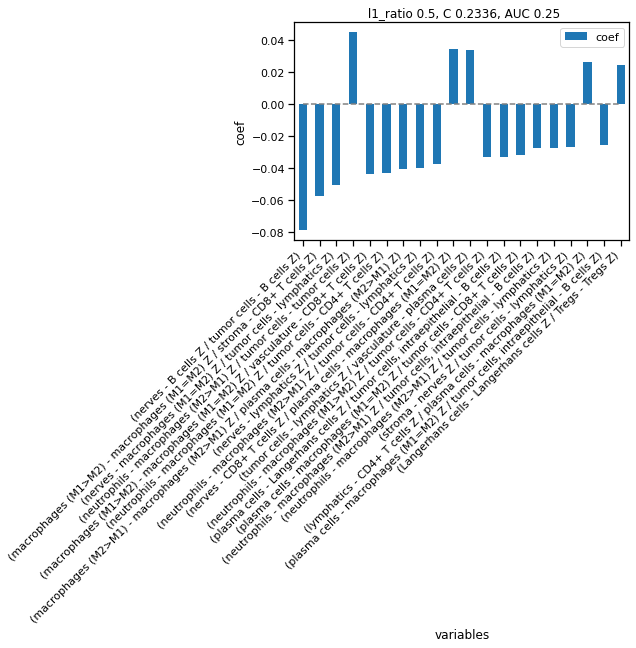

<Figure size 432x288 with 0 Axes>

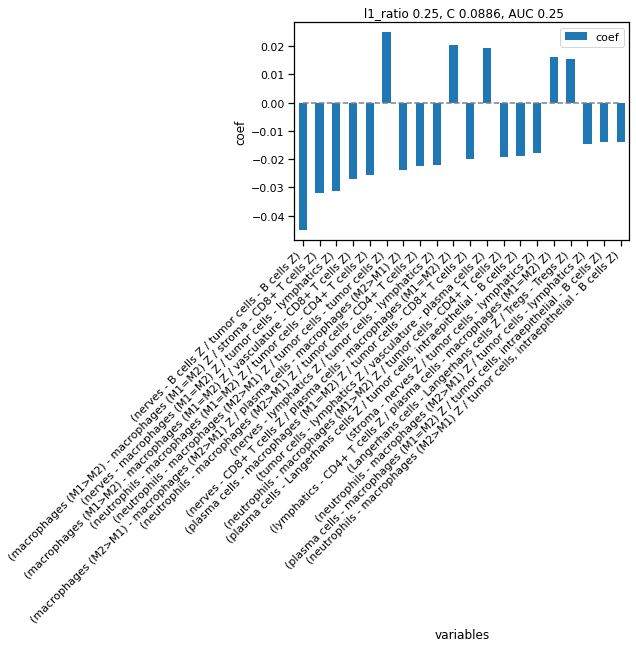

<Figure size 432x288 with 0 Axes>

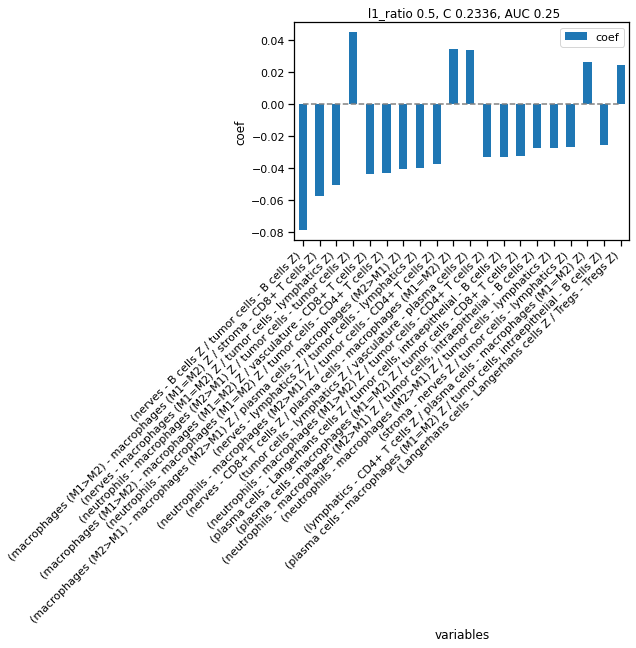

In [136]:
# Elasticnet logistic regression

# def write_log(file, message):
#     print(message)
#     file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = z_agg_ratios.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    # dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    # dir_save.mkdir(parents=True, exist_ok=True)
    # log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        # plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    # scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
# log_file.close()

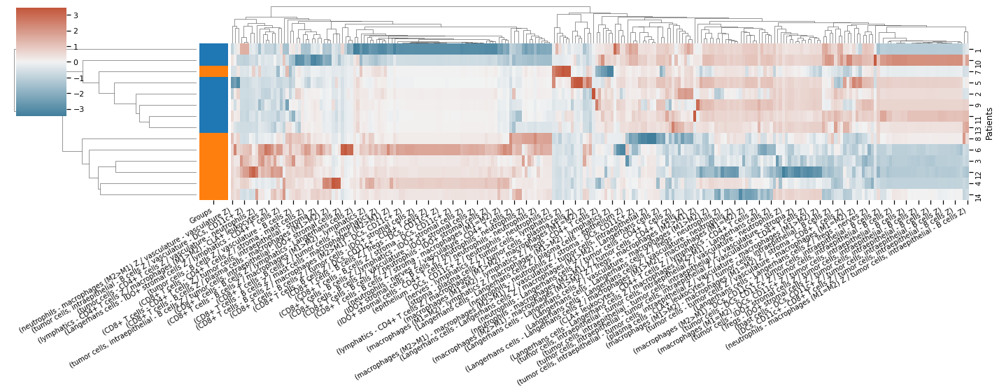

In [ ]:
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index
# or to select only 20 variables:
# best_pval_names = pvals.head(20).index
mosna.plot_heatmap(
    z_agg_ratios[best_pval_names].reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    z_score=1,
    figsize=(20, 12),
    )







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

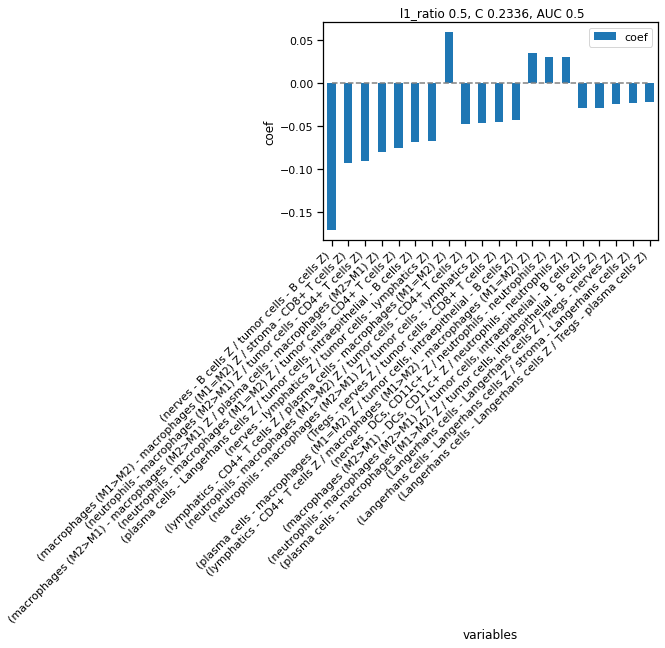

<Figure size 432x288 with 0 Axes>

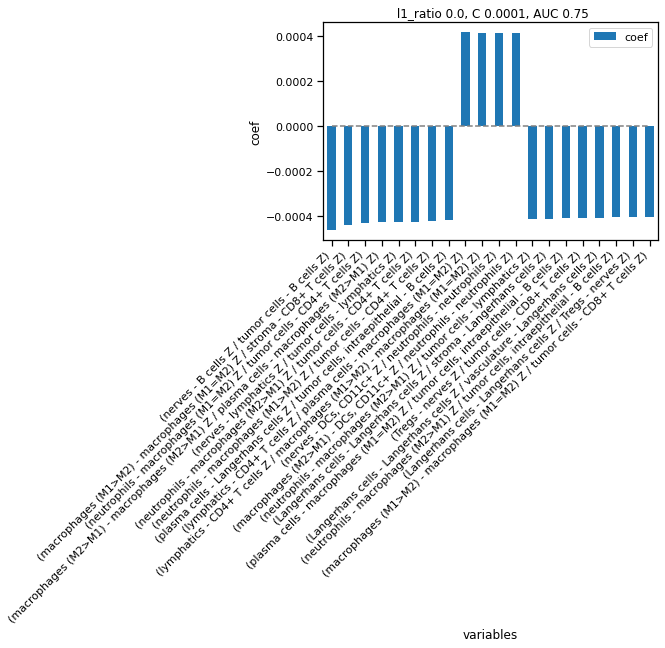

<Figure size 432x288 with 0 Axes>

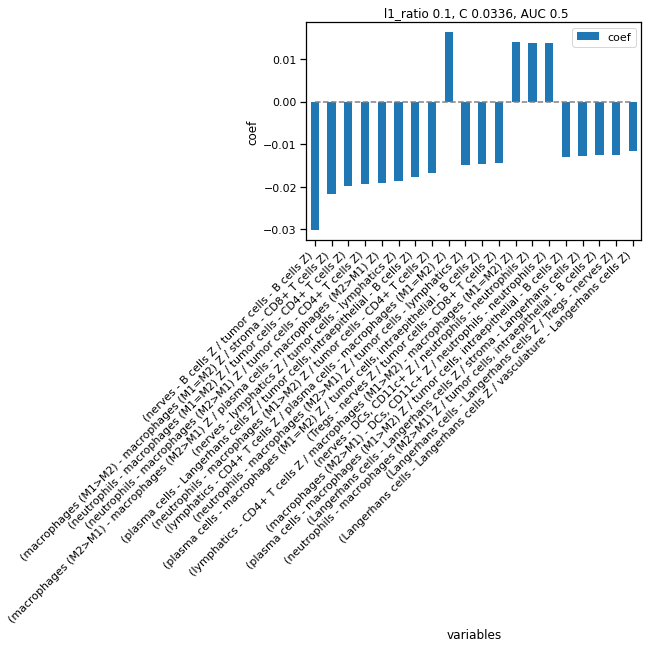

In [141]:
# Elasticnet logistic regression

# def write_log(file, message):
#     print(message)
#     file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = z_agg_ratios[best_pval_names].reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    # dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    # dir_save.mkdir(parents=True, exist_ok=True)
    # log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        # plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    # scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
# log_file.close()

### Marker-positive cells interactions

We can also compute the mixing matrix and assortativity between marker-positive cells.

## Cellular neighborhoods

The mixing matrix and assortativity give us information about the global network organization.  
Here we will see how to use the *Neighbors Aggregation Statistics* method to find local "cellular communities", or "neighborhoods", or "niches", that can be relevant to understand disease progression or response to therapies.  

### On cell types

First order neighbors, mean and std

In [50]:
order = 1
var_type = 'cell-types'
stat_names = 'mean-std'
aggreg_vars = cell_type_cols

# For UMAP visualization
marker = '.'
size_points = 10

In [51]:
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

In [52]:
# attrib_all = obj[cell_type_cols]
X = obj[aggreg_vars].values
edges_all = pd.read_csv(reconst_dir/ 'sample_all-edges.csv')
pairs = edges_all.values

In [53]:
filename = nas_dir / f'aggregation_statistics.csv'

if filename.exists():
    var_aggreg = pd.read_csv(filename)
else:
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(filename, index=False)

In [54]:
n_neighbors = 70
metric = 'euclidean'
min_dist = 0.0

reducer = umap.UMAP(
    random_state=0,
    n_neighbors=n_neighbors,
    metric=metric,
    min_dist=min_dist,
    # we don't modify the other parameters
    # spread=1.0,
    # set_op_mix_ratio=1.0,
    # local_connectivity=1.0,
    # repulsion_strength=1.0,
    # negative_sample_rate=5,
    # transform_queue_size=4.0,
    )
embedding = reducer.fit_transform(var_aggreg)
reducer_name = f"reducer-umap_nneigh-{n_neighbors}_metric-{metric}_min_dist-{min_dist}"
# save reduced coordinates
np.save(nas_dir / (reducer_name + '.npy'), embedding, allow_pickle=False, fix_imports=False)
# save the reducer object
joblib.dump(reducer, nas_dir / (reducer_name + '.pkl'))
embedding.shape

/home/alexis/.pyenv/versions/3.8.10/envs/spatial-networks/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


(117170, 2)

In [47]:
joblib.dump(reducer, str(nas_dir / (reducer_name + '.pkl')))

['../data/processed/CODEX_CTCL/all_samples_networks_xy_trim_dist-percentile_size_solitary-0/nas_on-cell-types_stats-mean-std_order-1/reducer-umap_nneigh-70_metric-euclidean_min_dist-0.0.pkl']

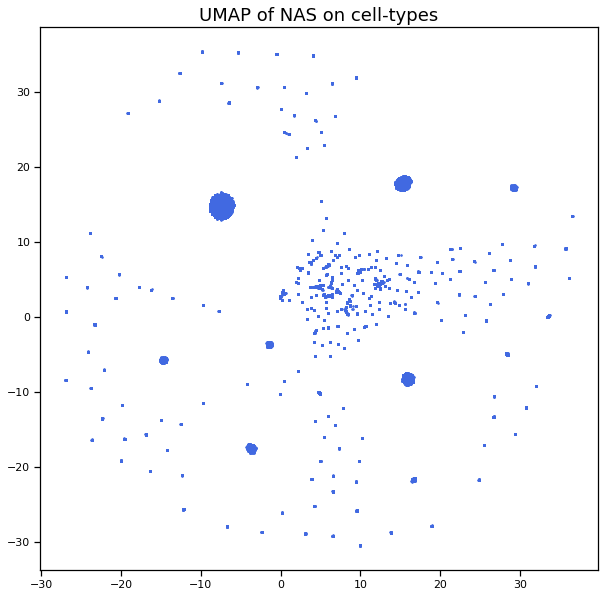

In [48]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

#### Screen NAS parameters

In [ ]:
from importlib import reload
reload(mosna)

orders = [1]
dim_clusts = [2, 3, 4, 5, 6, 7, 8, 9]
min_cluster_sizes = [100, 250, 500, 750, 1000]
parallel_dim = 'max'
parallel_clustering = 4
processed_dir = Path('../data/processed/CODEX_CTCL')
opt_str = '_samples-all_stat-mean-std'
save_dir = 'test-parallel'

mosna.screen_nas_parameters(X, pairs, markers, orders, dim_clusts, min_cluster_sizes, processed_dir, save_dir=save_dir, soft_clustering=True, 
                            opt_str=opt_str, parallel_dim=parallel_dim, parallel_clustering=parallel_clustering, memory_limit='800GB')


#### Clusters visualization

dim_clust: 2
    min_cluster_size: 100


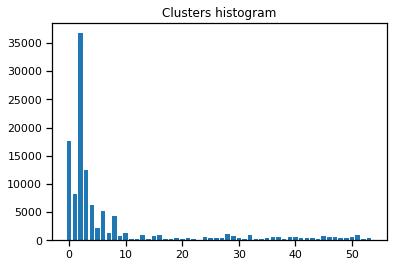

No handles with labels found to put in legend.


        sample: 1


In [188]:
reload(mosna)

orders = [1]
dim_clusts = [2, 3, 4, 5, 6, 7, 8, 9]
min_cluster_sizes = [100, 250, 500, 750, 1000]
processed_dir = Path('../data/processed/CODEX_CTCL')
opt_str = '_samples-all_stat-mean-std'

mosna.plot_screened_parameters(obj, cell_pos_cols, cell_type_cols, orders, dim_clusts, processed_dir,
                               min_cluster_sizes, all_edges='all_samples_networks', sampling=False, var_type=None, 
                               downsample=False, aggreg_dir=None, load_dir=None, save_dir=None, opt_str=opt_str)

### On markers

In [51]:
order = 1
var_type = 'markers'
stat_names = 'mean-std'
aggreg_vars = marker_cols

# For UMAP visualization
marker = '.'
size_points = 10

In [52]:
nas_dir = reconst_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

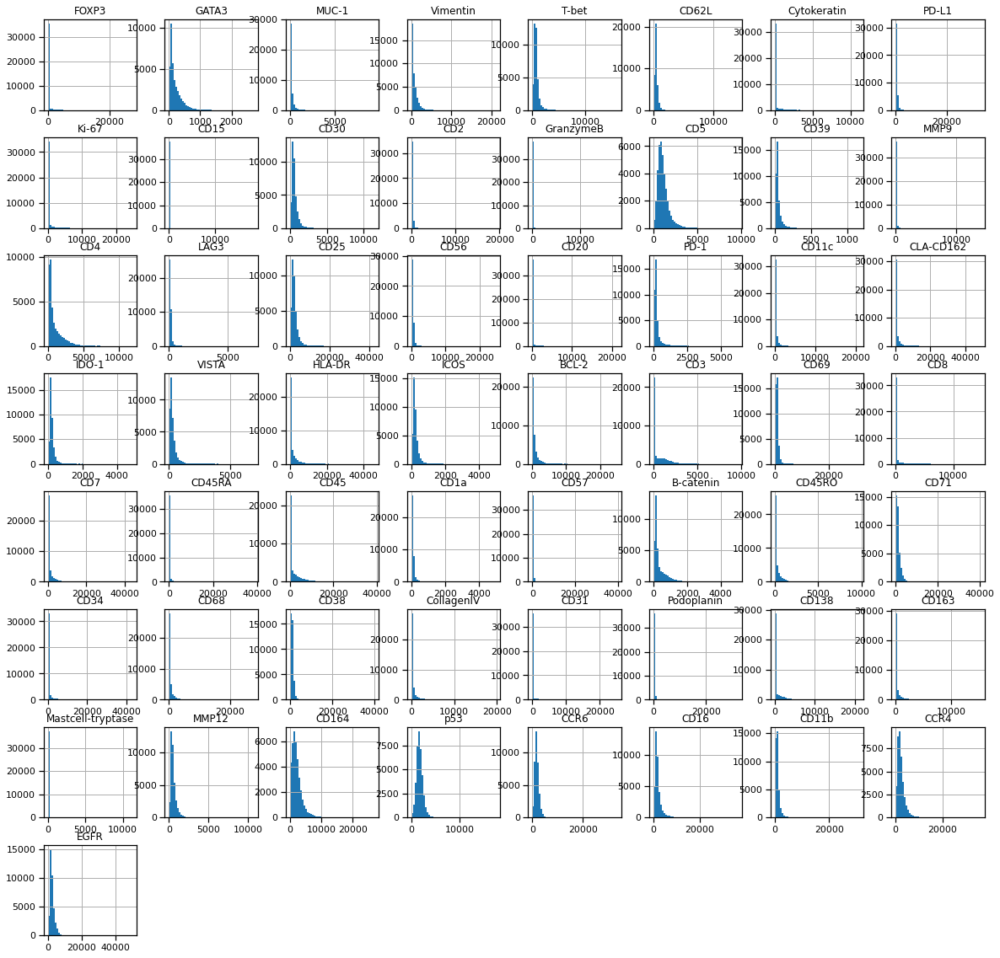

In [53]:
obj[aggreg_vars].hist(bins=50, figsize=(20, 20));

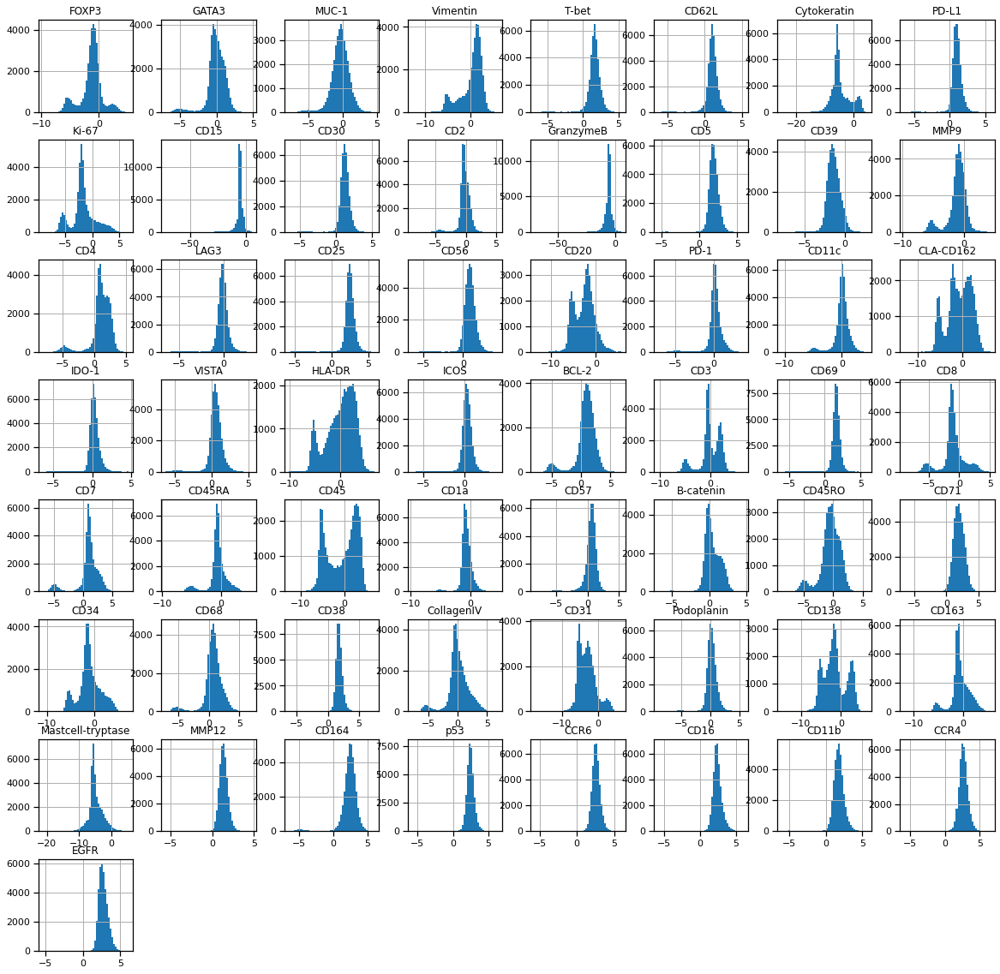

In [54]:
X = obj[aggreg_vars].values
X[X == 0] = X.max() / 100000

X_clr = cs.clr(cs.closure(X))
aggreg_vars_clr = obj[aggreg_vars].copy()
aggreg_vars_clr.loc[:, :] = X_clr
aggreg_vars_clr.hist(bins=50, figsize=(20, 20));

In [55]:
edges_all = pd.read_csv(reconst_dir/ 'all_samples-edges.csv')
pairs = edges_all.values

In [56]:
file_path = nas_dir / f'aggregation_statistics.csv'

if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Computing Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(file_path, index=False)

Loading Neighbors Aggregation Statistics file


In [57]:
embedding, reducer = mosna.get_reducer(
    data=var_aggreg, 
    save_dir=nas_dir,
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean', 
    min_dist=0.0,
    )

Loading reducer object and reduced coordinates


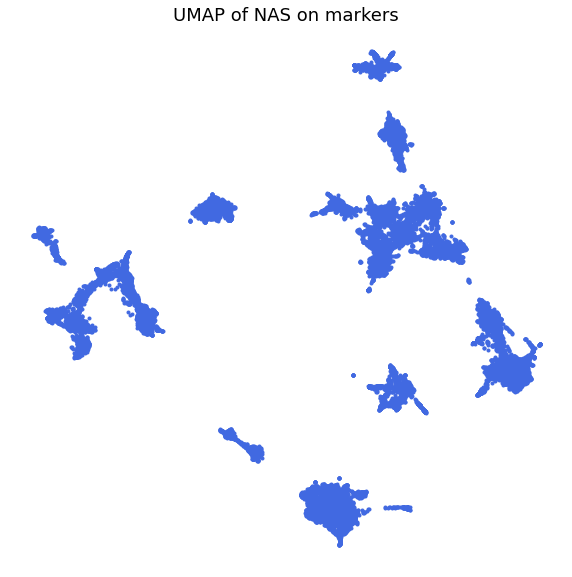

In [58]:
mosna.plot_clusters(embedding)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

#### Leinden clustering

Test:
  - reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-clr
  - reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-obs

In [63]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 17 clusters


In [64]:
nas_dir

PosixPath('../data/processed/CODEX_CTCL/pretreatment_samples_networks_xy_trim_dist-200_solitary-0/nas_on-markers_stats-mean-std_order-1')

Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

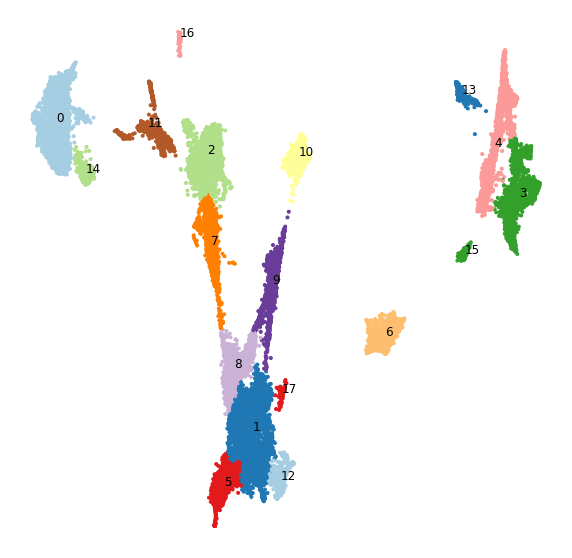

In [65]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

#### Screen clustering parameters

In [ ]:
# for dim_clust in tqdm([2, 3, 4, 5], leave=False):
for dim_clust in tqdm([2], leave=False):
    for n_neighbors in tqdm([15, 45, 75, 100, 200], leave=False):
        for metric in tqdm(['euclidean', 'cosine'], leave=False):
            for k_cluster in tqdm([15, 50], leave=False):
                cluster_params = {
                    'reducer_type': 'umap', 
                    'n_neighbors': n_neighbors, 
                    'metric': metric,
                    'min_dist': 0.0,
                    'clusterer_type': 'leiden', 
                    'dim_clust': dim_clust, 
                    'k_cluster': 15, 
                    'resolution_parameter': 0.005,
                }

                cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)
                
                embed_viz, _ = mosna.get_reducer(
                    var_aggreg, 
                    nas_dir, 
                    reducer_type='umap', 
                    n_neighbors=n_neighbors, 
                    metric=metric,
                    )
                
                mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

Loading clusterer object and cluster labels
There are 23 clusters
Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

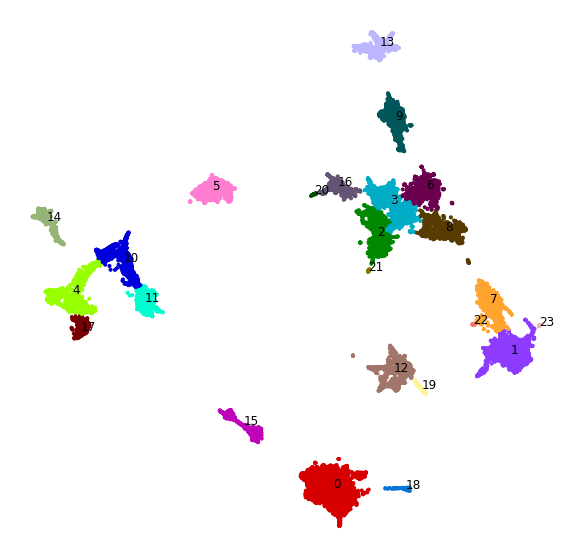

In [62]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 15, 
    'metric': 'euclidean',
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

embed_viz, _ = mosna.get_reducer(
    var_aggreg, 
    nas_dir, 
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean',
    )

mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

Loading clusterer object and cluster labels
There are 18 clusters
Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

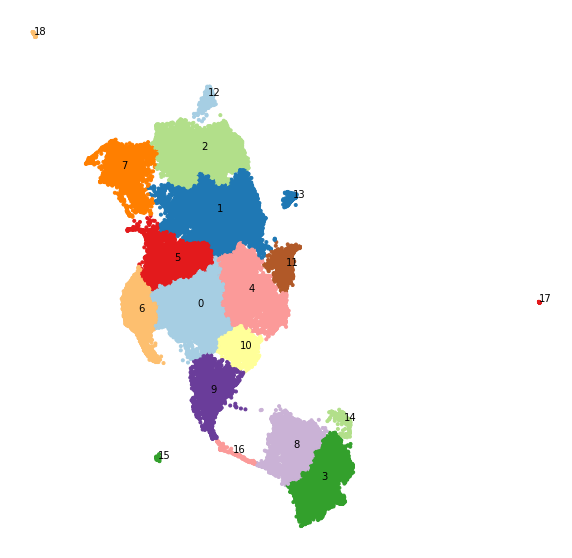

In [ ]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 15, 
    'metric': 'euclidean',
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

embed_viz, _ = mosna.get_reducer(
    var_aggreg, 
    nas_dir, 
    reducer_type='umap', 
    n_neighbors=15, 
    metric='euclidean',
    )

mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

In [29]:
# Merge some small adjacent clusters
# merge_dict = {
#     19: 18,
#     21: 17,
#     24: 1,
#     # 23: 1,
#     # 25: 1,
# }
merge_dict = {
    20: 2,
    18: 16,
    19: 16,
    # 23: 1,
    # 25: 1,
}
for old, new in merge_dict.items():
    cluster_labels[cluster_labels == old] = new
    
# rename clusters ordered by size
class_id, class_count = np.unique(cluster_labels, return_counts=True)


In [30]:
# rename clusters ordered by size
class_id, class_count = np.unique(cluster_labels, return_counts=True)
decreasing_counts_ids = np.argsort(class_count)[::-1]
new_ids = np.arange(len(class_id))[decreasing_counts_ids]
for old, new in zip(class_id, new_ids):
    cluster_labels[cluster_labels == old] = new

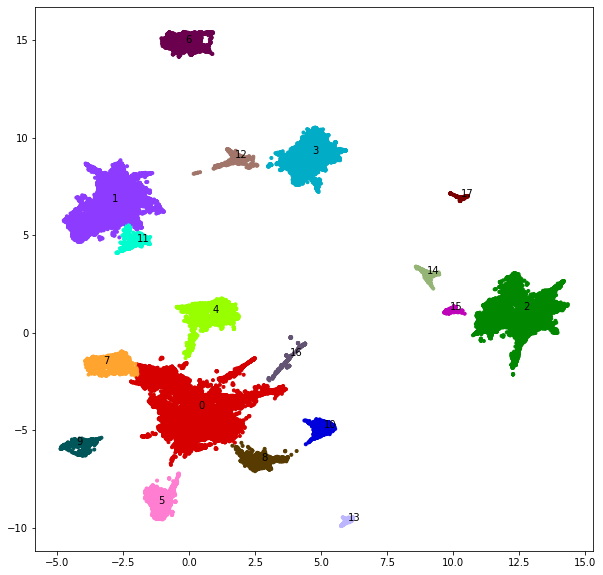

In [31]:
embed_viz = embedding

# choose colormap
if nb_clust < 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in cluster_labels]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = [labels_color_mapper[x] for x in cluster_labels]

plt.figure(figsize=(10,10))
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors, marker='.');

for clust_id in np.unique(cluster_labels):
    clust_targ = cluster_labels == clust_id
    x_mean = embed_viz[clust_targ, 0].mean()
    y_mean = embed_viz[clust_targ, 1].mean()
    plt.text(x_mean, y_mean, str(clust_id))

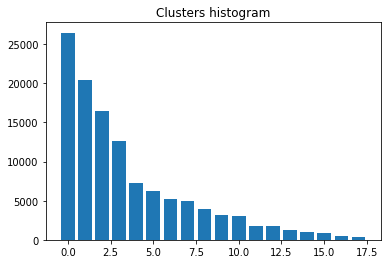

In [32]:
class_id, class_count = np.unique(cluster_labels, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

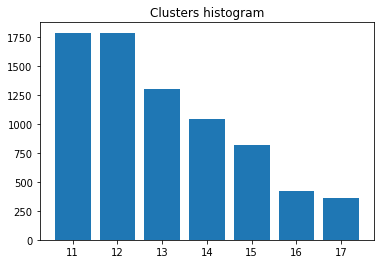

In [33]:
class_id, class_count = np.unique(cluster_labels[cluster_labels > 10], return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

In [34]:
other_str = '_manual-cleaning'

clusterer_name = f"partition-{'RBConfigurationVertexPartition'}_resolution-{resolution_parameter}{other_str}"
file_path = cluster_dir / clusterer_name

# save cluster labels
np.save(str(file_path) + '.npy', cluster_labels, allow_pickle=False, fix_imports=False)

#### HDBSCAN clustering

In [65]:
n_neighbors = 70
metric = 'euclidean'
min_dist = 0.0

reducer_name = f"reducer-umap_nneigh-{n_neighbors}_metric-{metric}_min_dist-{min_dist}"
file_path = nas_dir / reducer_name
if os.path.exists(str(file_path) + '.npy'):
    print("Loading reducer object and reduced coordinates")
    embedding = np.load(str(file_path) + '.npy')
    reducer = joblib.load(str(file_path) + '.pkl')
else:
    print("Computing dimensionality reduction")
    reducer = umap.UMAP(
        random_state=0,
        n_neighbors=n_neighbors,
        metric=metric,
        min_dist=min_dist,
        )
    embedding = reducer.fit_transform(var_aggreg)
    # save reduced coordinates
    np.save(str(file_path) + '.npy', embedding, allow_pickle=False, fix_imports=False)
    # save the reducer object
    joblib.dump(reducer, str(file_path) + '.pkl');


Computing dimensionality reduction


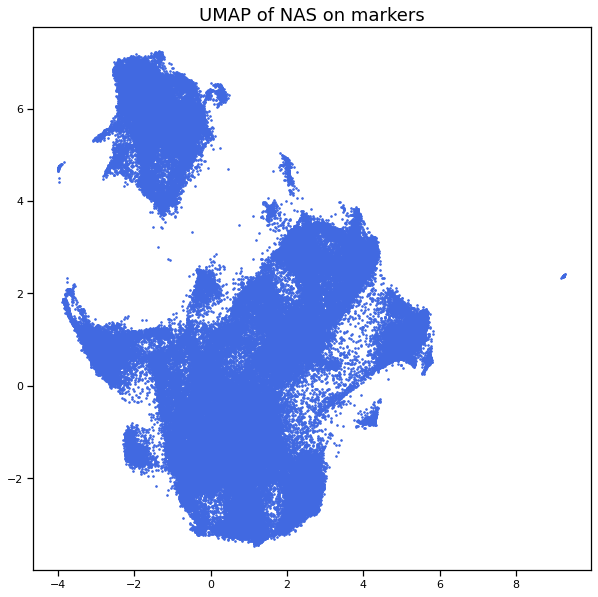

In [66]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

In [58]:
dim_clust = 2
min_samples = 10
min_cluster_size = 2000
epsilon = 0.0 # cluster_selection_epsilon=0.0 by default
# soft_clustering = False or 'knn' or 'proba'
soft_clustering = False 
parallel_clustering = 16
force_recompute = False

cluster_dir = nas_dir / f"clusterer-HDBSCAN_dim_clust-{dim_clust}_min_samples-{min_samples}"   
if not os.path.exists(cluster_dir):
    os.makedirs(cluster_dir)

clusterer_name = f"min_cluster_size-{min_cluster_size}_epsilon-{epsilon}_soft_clustering-{soft_clustering}"
file_path = cluster_dir / clusterer_name
cache_dir = cluster_dir / 'memory_cache'

if os.path.exists(str(file_path) + '.npy') and not force_recompute:
    print("Loading clusterer object and cluster labels")
    cluster_labels = np.load(str(file_path) + '.npy')
    clusterer = joblib.load(str(file_path) + '.pkl')
    nb_clust = cluster_labels.max() # + 1
else:
    print("Performing clustering")
    # select embedded data
    embed_clust = embedding
    # Clustering
    start = time()
    if soft_clustering is False or soft_clustering == 'knn':
        clusterer = hdbscan.HDBSCAN( 
            min_cluster_size=min_cluster_size, 
            min_samples=min_samples,
            cluster_selection_epsilon=epsilon,
            core_dist_n_jobs=parallel_clustering,
            memory=cache_dir.as_posix(),
        )
        clusterer.fit(embed_clust)
        cluster_labels = clusterer.labels_

        # replace points with label -1 to closest labels in the UMAP space
        if soft_clustering == 'knn':
            cluster_labels = cluster_labels.astype(float)
            # set labels -1 to nan
            select = cluster_labels == -1
            cluster_labels[select] = np.nan
            # perform data imputation
            imputer = KNNImputer(n_neighbors=5, weights="distance")
            cluster_labels = imputer.fit_transform(cluster_labels.reshape(-1, 1)).flatten()
            # set to 0/1 the imputed categorical variables
            cluster_labels = cluster_labels.round().astype(int)
            
    # use max proba of labels different from -1
    # it can lead to very different clustering for unknow reason so far
    elif soft_clustering == 'proba':
        clusterer = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size, 
            min_samples=min_samples, 
            cluster_selection_epsilon=epsilon,
            prediction_data=True, 
            core_dist_n_jobs=parallel_clustering,
            memory=cache_dir.as_posix(),
        )
        clusterer.fit(embed_clust)
        soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
        if len(soft_clusters.shape) > 1:
            # set to 0 the probability of being noise
            if -1 in np.unique(clusterer.labels_):
                soft_clusters[:, 0] = 0
            cluster_labels = soft_clusters.argmax(axis=1)
        else:
            cluster_labels = soft_clusters

    end = time()
    duration = end - start
    nb_clust = cluster_labels.max() # + 1
    print("HDBSCAN has detected {} clusters in {:.2f}s".format(nb_clust, duration))
    # save cluster labels
    np.save(str(file_path) + '.npy', cluster_labels, allow_pickle=False, fix_imports=False)
    # save the reducer object
    joblib.dump(clusterer, str(file_path) + '.pkl');
nb_clust = cluster_labels.max() # + 1

Performing clustering
HDBSCAN has detected 10 clusters in 5.33s


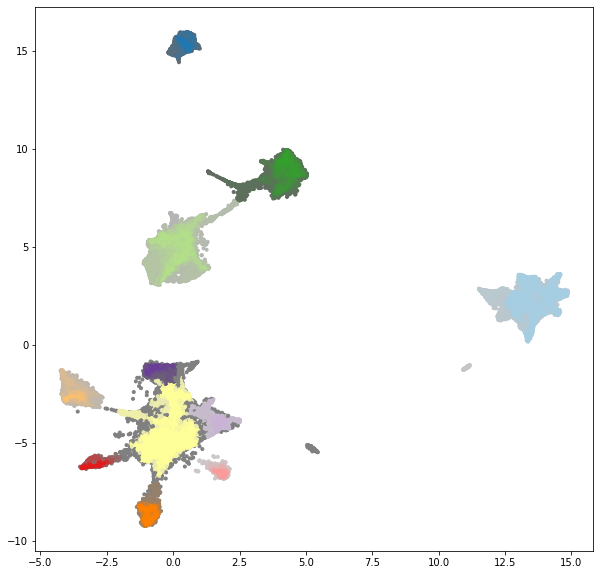

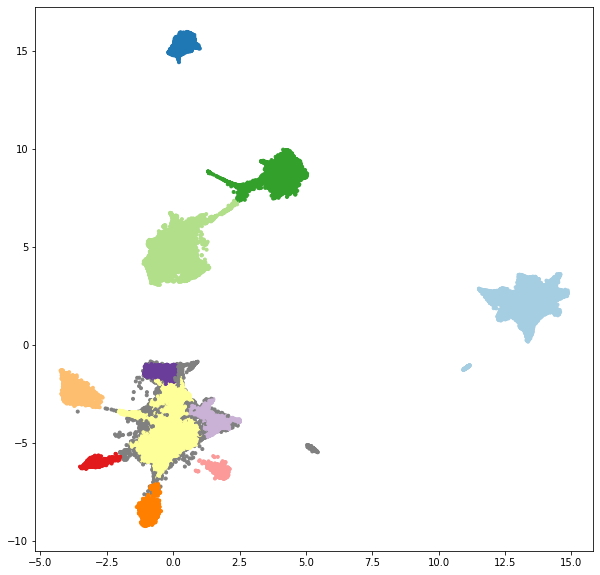

In [59]:
embed_viz = embedding

# make a cohort-wide cmap
clusters_cmap = cc.palette["glasbey_category10"]
# make color mapper
# series to sort by decreasing order
uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
n_colors = len(clusters_cmap)
labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
# make list of colors
labels_colors = [labels_color_mapper[x] for x in cluster_labels]
labels_colors = pd.Series(labels_colors)

# choose colormap
if nb_clust <= 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in clusterer.labels_]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = [labels_color_mapper[x] for x in cluster_labels]

cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clusterer.probabilities_)]

plt.figure(figsize=(10,10))
# plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_colors, marker='.');
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_member_colors, marker='.');

plt.figure(figsize=(10,10))
# plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_colors, marker='.');
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors, marker='.');

That looks good, let's add soft clustering.

In [62]:
dim_clust = 2
min_samples = 10
min_cluster_size = 2000
epsilon = 0.0 # cluster_selection_epsilon=0.0 by default
# soft_clustering = False or 'knn' or 'proba'
soft_clustering = 'knn' 
parallel_clustering = 16
force_recompute = False

cluster_dir = nas_dir / f"clusterer-HDBSCAN_dim_clust-{dim_clust}_min_samples-{min_samples}"   
if not os.path.exists(cluster_dir):
    os.makedirs(cluster_dir)

clusterer_name = f"min_cluster_size-{min_cluster_size}_epsilon-{epsilon}_soft_clustering-{soft_clustering}"
file_path = cluster_dir / clusterer_name
cache_dir = cluster_dir / 'memory_cache'

if os.path.exists(str(file_path) + '.npy') and not force_recompute:
    print("Loading clusterer object and cluster labels")
    cluster_labels = np.load(str(file_path) + '.npy')
    clusterer = joblib.load(str(file_path) + '.pkl')
    nb_clust = cluster_labels.max() # + 1
else:
    print("Performing clustering")
    # select embedded data
    embed_clust = embedding
    # Clustering
    start = time()
    if soft_clustering is False or soft_clustering == 'knn':
        clusterer = hdbscan.HDBSCAN( 
            min_cluster_size=min_cluster_size, 
            min_samples=min_samples,
            cluster_selection_epsilon=epsilon,
            core_dist_n_jobs=parallel_clustering,
            memory=cache_dir.as_posix(),
        )
        clusterer.fit(embed_clust)
        cluster_labels = clusterer.labels_

        # replace points with label -1 to closest labels in the UMAP space
        if soft_clustering == 'knn':
            cluster_labels = cluster_labels.astype(float)
            # set labels -1 to nan
            select = cluster_labels == -1
            cluster_labels[select] = np.nan
            # perform data imputation
            imputer = KNNImputer(n_neighbors=5, weights="distance")
            cluster_labels = imputer.fit_transform(cluster_labels.reshape(-1, 1)).flatten()
            # set to 0/1 the imputed categorical variables
            cluster_labels = cluster_labels.round().astype(int)
            
    # use max proba of labels different from -1
    # it can lead to very different clustering for unknow reason so far
    elif soft_clustering == 'proba':
        clusterer = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size, 
            min_samples=min_samples, 
            cluster_selection_epsilon=epsilon,
            prediction_data=True, 
            core_dist_n_jobs=parallel_clustering,
            memory=cache_dir.as_posix(),
        )
        clusterer.fit(embed_clust)
        soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
        if len(soft_clusters.shape) > 1:
            # set to 0 the probability of being noise
            if -1 in np.unique(clusterer.labels_):
                soft_clusters[:, 0] = 0
            cluster_labels = soft_clusters.argmax(axis=1)
        else:
            cluster_labels = soft_clusters

    end = time()
    duration = end - start
    nb_clust = cluster_labels.max() # + 1
    print("HDBSCAN has detected {} clusters in {:.2f}s".format(nb_clust, duration))
    # save cluster labels
    np.save(str(file_path) + '.npy', cluster_labels, allow_pickle=False, fix_imports=False)
    # save the reducer object
    joblib.dump(clusterer, str(file_path) + '.pkl'.as_posix());
nb_clust = cluster_labels.max() # + 1

Performing clustering
HDBSCAN has detected 10 clusters in 17.62s


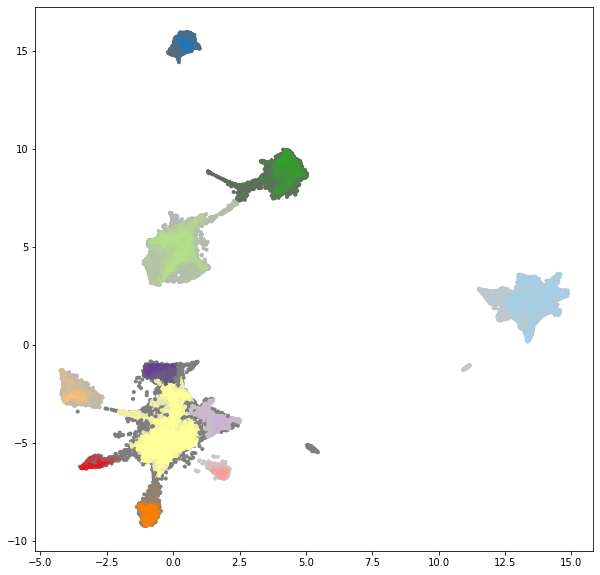

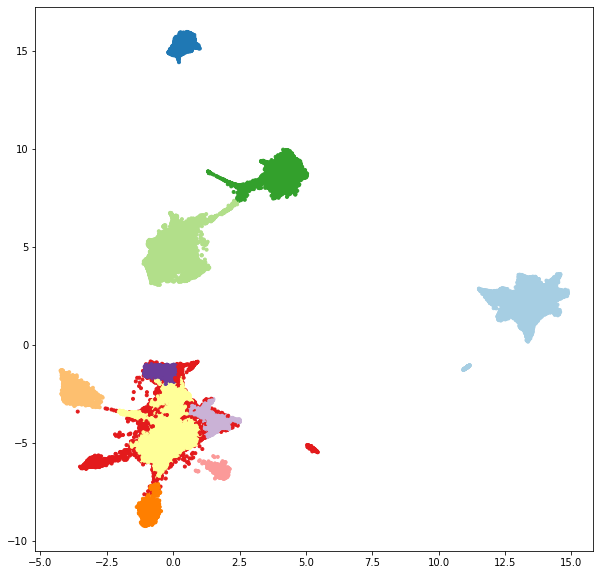

In [63]:
embed_viz = embedding

# make a cohort-wide cmap
clusters_cmap = cc.palette["glasbey_category10"]
# make color mapper
# series to sort by decreasing order
uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
n_colors = len(clusters_cmap)
labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
# make list of colors
labels_colors = [labels_color_mapper[x] for x in cluster_labels]
labels_colors = pd.Series(labels_colors)

# choose colormap
if nb_clust <= 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in cluster_labels]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = [labels_color_mapper[x] for x in cluster_labels]

cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clusterer.probabilities_)]

plt.figure(figsize=(10,10))
# plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_colors, marker='.');
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_member_colors, marker='.');

plt.figure(figsize=(10,10))
# plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_colors, marker='.');
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors, marker='.');

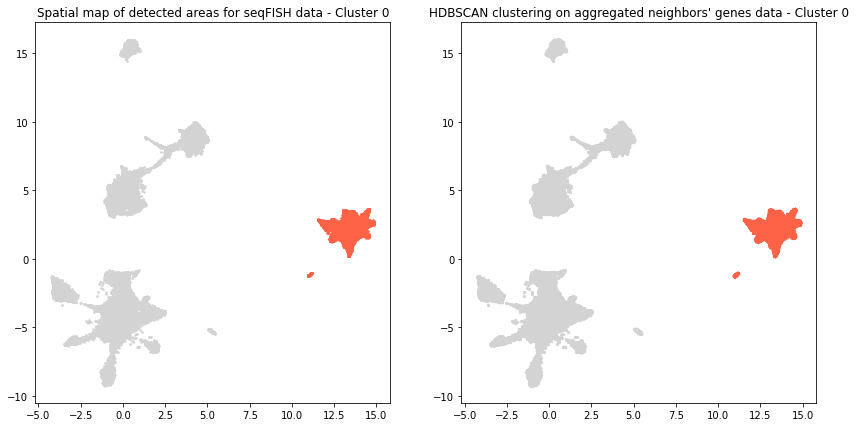

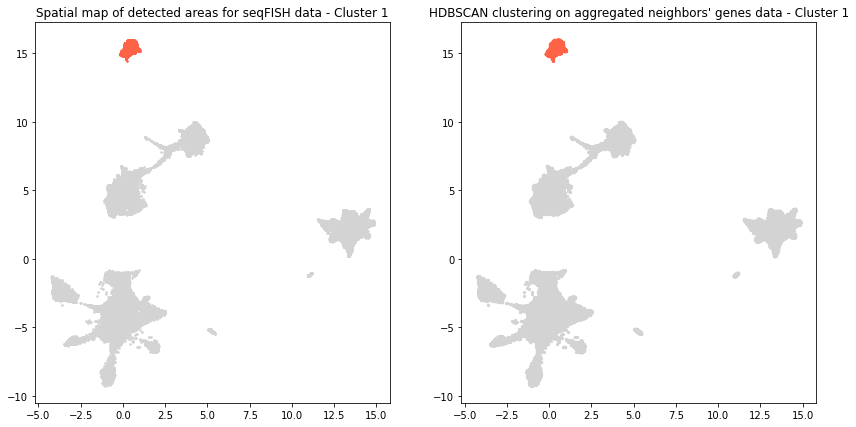

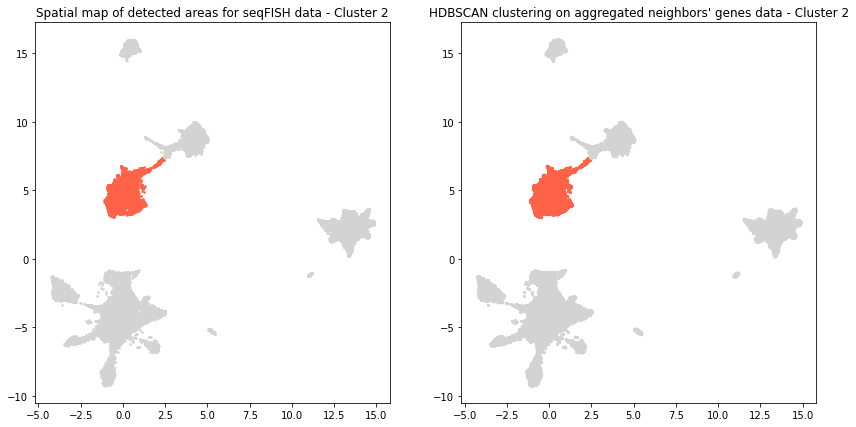

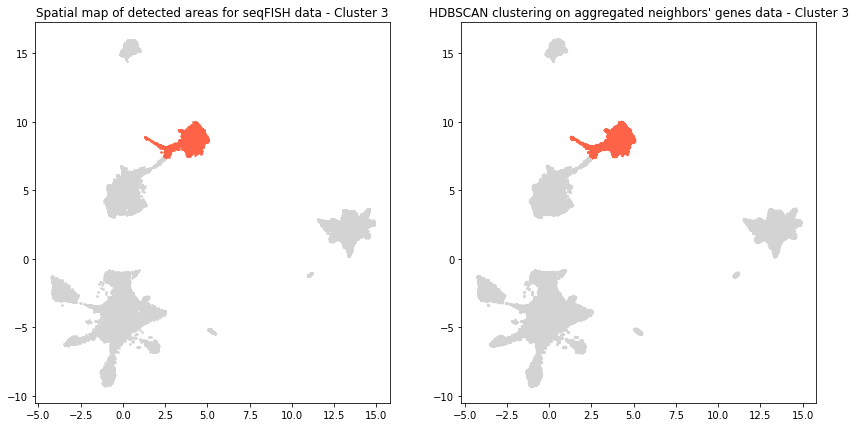

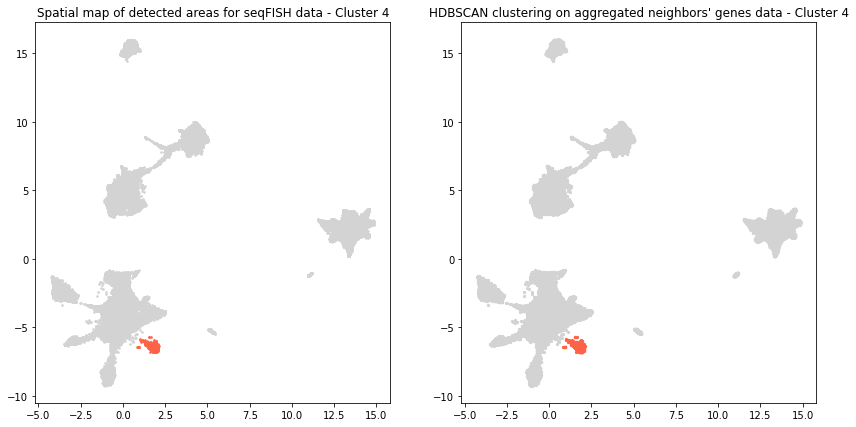

...

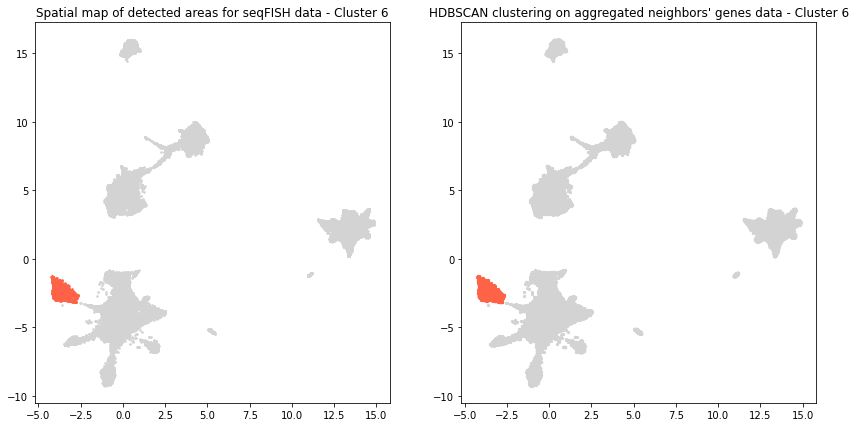

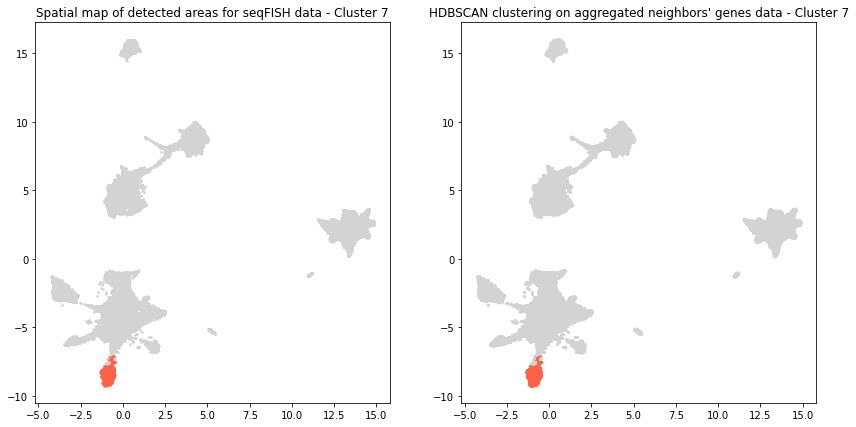

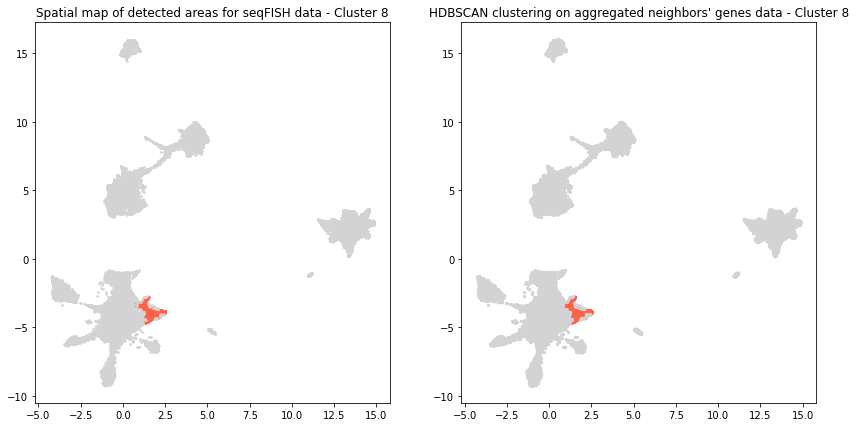

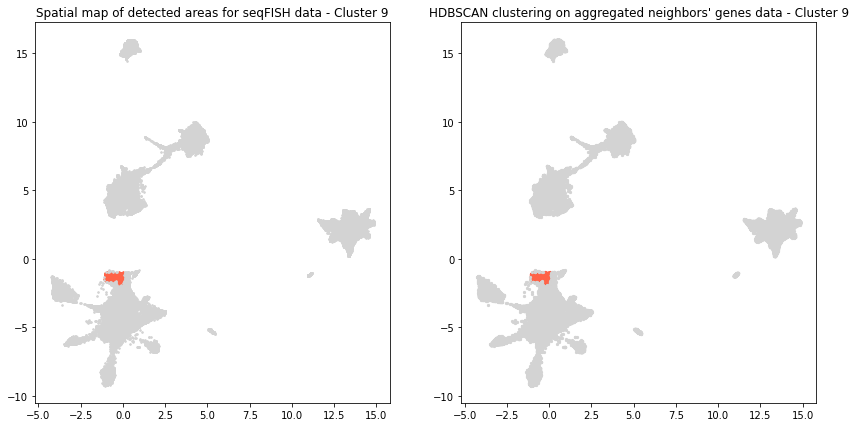

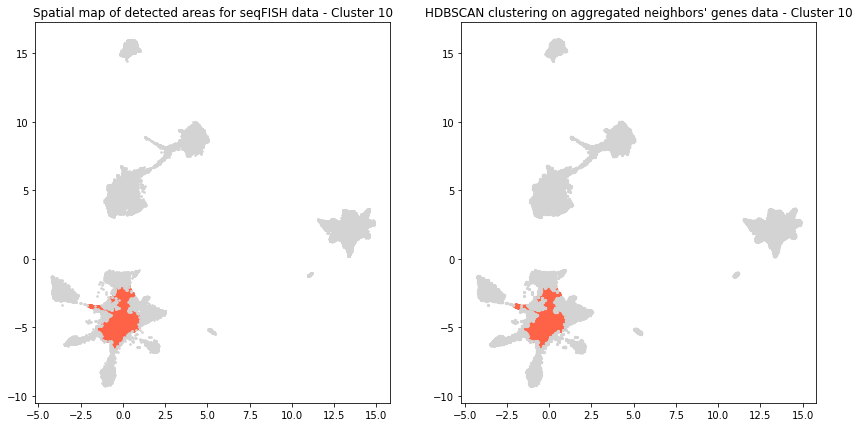

In [64]:
for clust_id in np.unique(cluster_labels):
    clust_targ = cluster_labels == clust_id  # cluster of interest (target)
    clust_comp = cluster_labels != clust_id  # cluster(s) we compare with

    fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

    ax[0].scatter(embed_viz[clust_targ,0], embed_viz[clust_targ,1], c='tomato', marker=marker, s=size_points)
    ax[0].scatter(embed_viz[clust_comp,0], embed_viz[clust_comp,1], c='lightgrey', marker=marker, s=size_points)
    ax[0].set_title('Spatial map of detected areas for seqFISH data - Cluster '+str(clust_id), fontsize=12);
    
    ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
    ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
    ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data - Cluster "+str(clust_id), fontsize=12);
    plt.show()

It seems impossible to ave a partition that makes sense, there are really wrong cluster labeling.

#### Leiden clustering using Scanpy

In [78]:
# Leiden requires an iGraph object
# we could use a network produced by UMAP
# but it's more straightforward to use Scanpy

import anndata as ad
import scanpy as sc

adata = ad.AnnData(X_clr)
adata.var_names = aggreg_vars
adata

/tmp/ipykernel_19796/2195255581.py:4: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = ad.AnnData(X_clr)


AnnData object with n_obs × n_vars = 117170 × 57

In [ ]:
# Computing the neighborhood graph
sc.pp.neighbors(adata)
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

In [ ]:
# sc.tl.paga(adata)
# sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# sc.tl.umap(adata, init_pos='paga')

In [ ]:
# Embedding the neighborhood graph
sc.tl.umap(adata)

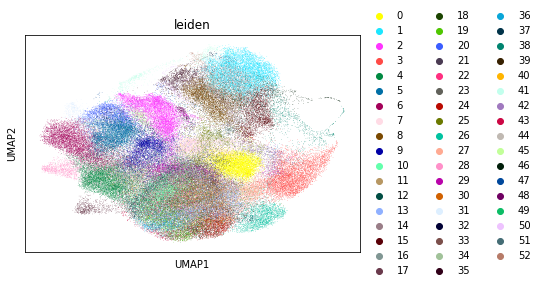

In [ ]:
# Clustering the neighborhood graph
sc.tl.leiden(adata, resolution=2)
sc.pl.umap(adata, color=['leiden'])

The UMAP projected data doesn't look promising.  
Let's try our own UMAP projection.

#### Leiden clustering using scikit knn on UMAP data

In [30]:
import igraph as ig
import leidenalg as la

k_cluster = 15
nas_coords = embedding
nas_pairs = ty.build_knn(nas_coords, k=k_cluster)

G = ty.to_iGraph(nas_coords, nas_pairs, attributes=None)

partition = la.find_partition(G, la.RBConfigurationVertexPartition, resolution_parameter=0.01)
# partition = la.find_partition(G, la.CPMVertexPartition, resolution_parameter=0.00001)
cluster_labels = np.array(partition.membership)
nb_clust = cluster_labels.max()
print(f"Found {nb_clust} clusters")

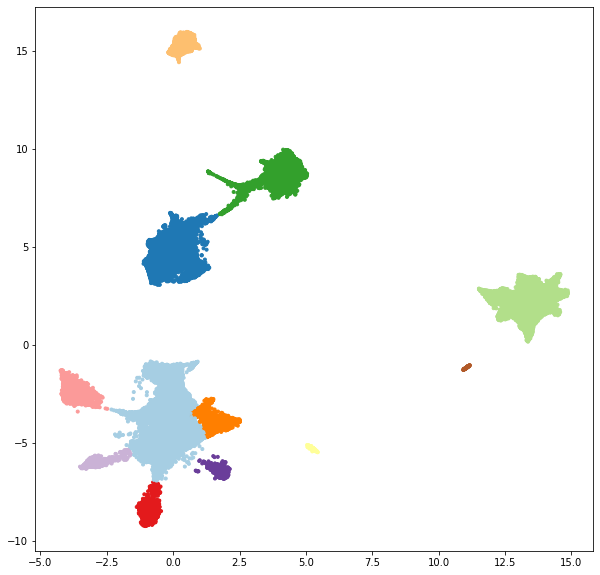

In [65]:
embed_viz = embedding

# choose colormap
if nb_clust <= 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in cluster_labels]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = [labels_color_mapper[x] for x in cluster_labels]

plt.figure(figsize=(10,10))
# plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_colors, marker='.');
plt.scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors, marker='.');

That looks great, we'll do the same with n_neighbors=15, see above.

#### On markers, order 2

In [40]:
order = 2
nas_dir = reconstruction_dir / f"nas_on-{var_type}_stats-{stat_names}_order-{order}"    
if not os.path.exists(nas_dir):
    os.makedirs(nas_dir)

file_path = nas_dir / f'aggregation_statistics.csv'
if file_path.is_file():
    print("Loading Neighbors Aggregation Statistics file")
    var_aggreg = pd.read_csv(file_path)
else:
    print("Compouting Neighbors Aggregation Statistics")
    var_aggreg = mosna.aggregate_k_neighbors(
        X=X_clr,
        pairs=pairs,
        order=order,
        var_names=aggreg_vars,
    )
    var_aggreg.to_csv(file_path, index=False)

Loading Neighbors Aggregation Statistics file


In [ ]:
n_neighbors = 70
metric = 'euclidean'
min_dist = 0.0

reducer_name = f"reducer-umap_nneigh-{n_neighbors}_metric-{metric}_min_dist-{min_dist}"
file_path = nas_dir / reducer_name
if os.path.exists(str(file_path) + '.npy'):
    print("Loading reducer object and reduced coordinates")
    embedding = np.load(str(file_path) + '.npy')
    reducer = joblib.load(str(file_path) + '.pkl')
else:
    print("Computing dimensionality reduction")
    reducer = umap.UMAP(
        random_state=0,
        n_neighbors=n_neighbors,
        metric=metric,
        min_dist=min_dist,
        )
    embedding = reducer.fit_transform(var_aggreg)
    # save reduced coordinates
    np.save(str(file_path) + '.npy', embedding, allow_pickle=False, fix_imports=False)
    # save the reducer object
    joblib.dump(reducer, str(file_path) + '.pkl');

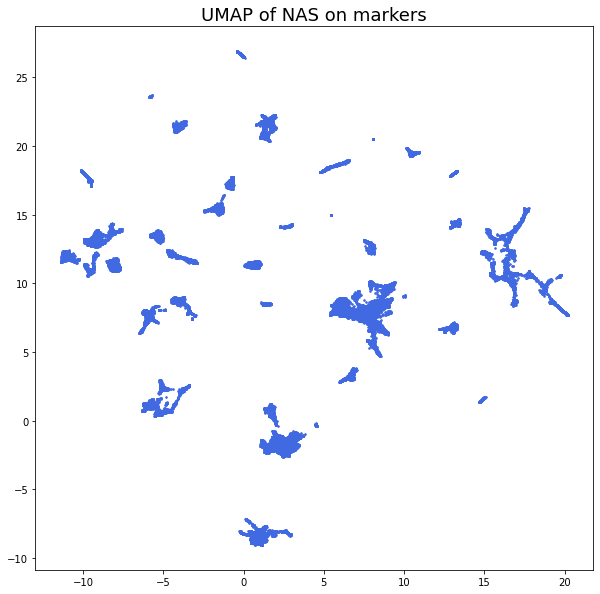

In [44]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

In [45]:
n_neighbors = 100
metric = 'euclidean'
min_dist = 0.0

reducer_name = f"reducer-umap_nneigh-{n_neighbors}_metric-{metric}_min_dist-{min_dist}"
file_path = nas_dir / reducer_name
if os.path.exists(str(file_path) + '.npy'):
    print("Loading reducer object and reduced coordinates")
    embedding = np.load(str(file_path) + '.npy')
    reducer = joblib.load(str(file_path) + '.pkl')
else:
    print("Computing dimensionality reduction")
    reducer = umap.UMAP(
        random_state=0,
        n_neighbors=n_neighbors,
        metric=metric,
        min_dist=min_dist,
        )
    embedding = reducer.fit_transform(var_aggreg)
    # save reduced coordinates
    np.save(str(file_path) + '.npy', embedding, allow_pickle=False, fix_imports=False)
    # save the reducer object
    joblib.dump(reducer, str(file_path) + '.pkl')

Computing dimensionality reduction


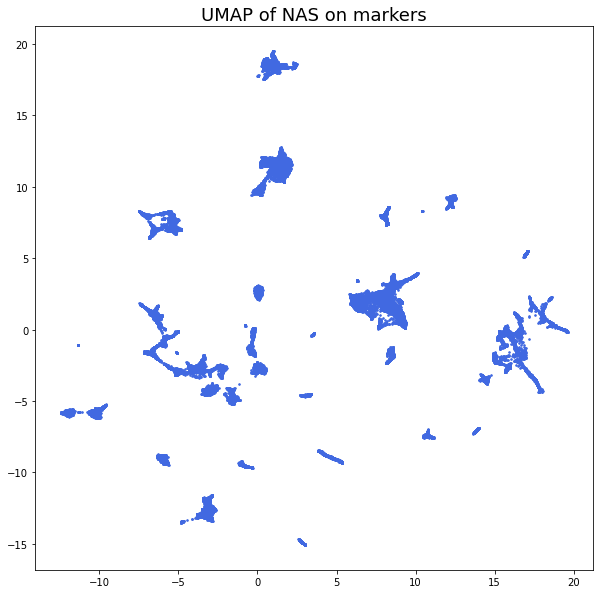

In [46]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = f"UMAP of NAS on {var_type}"
plt.title(title, fontsize=18);

## Survival analysis

We use labels from the Leiden clustering.

In [141]:
cell_types = nodes_all['CellCluster']
niches = cluster_labels

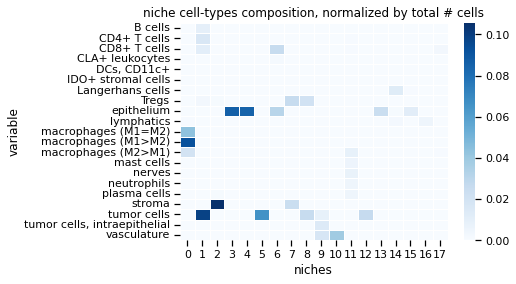

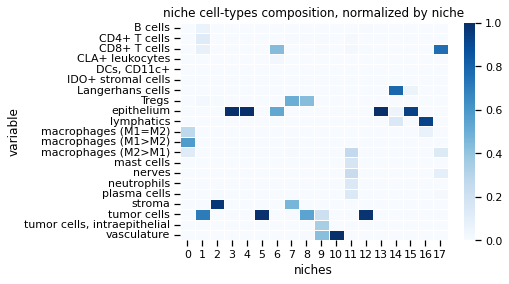

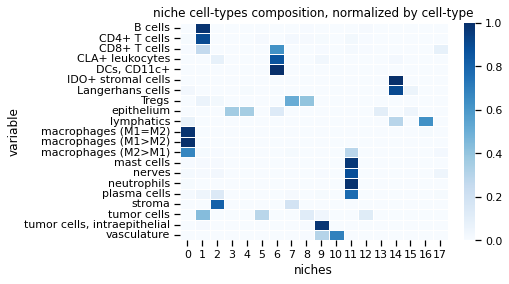

In [151]:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

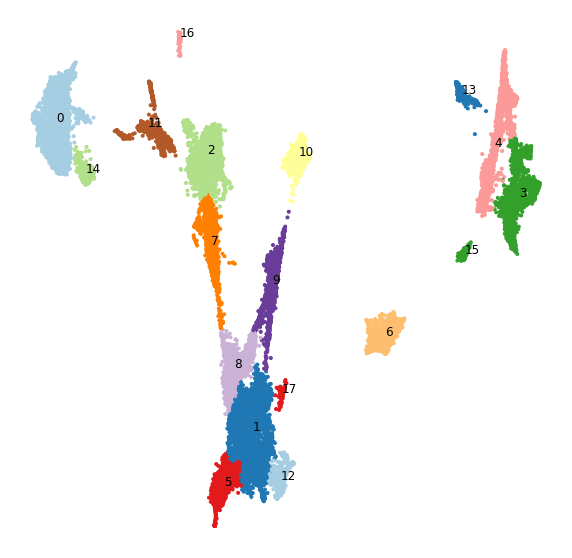

In [158]:
mosna.plot_clusters(embed_viz, cluster_labels, cluster_params=cluster_params)

In [147]:
# proportion of cells in niches per sample
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
variable,,,,,,,,,,,,,,,,,,
reg001,0.238278,0.242890,0.172944,0.000000,0.001537,0.000769,0.075327,0.073021,0.033820,0.061491,0.004612,0.066872,0.000000,0.000000,0.026902,0.000000,0.001537,0.000000
reg002,0.299914,0.083477,0.159639,0.000000,0.000000,0.000861,0.012048,0.096816,0.234079,0.043460,0.004733,0.047762,0.001721,0.000000,0.012048,0.000000,0.000000,0.003442
reg005,0.125000,0.008929,0.419643,0.000000,0.000000,0.000000,0.017857,0.000000,0.044643,0.348214,0.026786,0.008929,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
reg006,0.295191,0.185738,0.260365,0.000000,0.000000,0.001658,0.008292,0.023217,0.096186,0.084577,0.003317,0.014925,0.000000,0.000000,0.026534,0.000000,0.000000,0.000000
reg009,0.151671,0.167952,0.061268,0.002142,0.415167,0.000428,0.021851,0.022708,0.003428,0.073693,0.012425,0.010283,0.001285,0.000000,0.033847,0.000857,0.000428,0.020566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.194307,0.250000,0.011139,0.004950,0.000000,0.016089,0.037129,0.123762,0.047030,0.047030,0.061881,0.018564,0.000000,0.148515,0.025990,0.000000,0.012376,0.001238
reg051,0.103512,0.196858,0.131238,0.392791,0.002773,0.000000,0.001848,0.012015,0.001848,0.007394,0.087800,0.033272,0.003697,0.000000,0.020333,0.001848,0.000000,0.002773
reg052,0.076743,0.147042,0.057996,0.574107,0.056825,0.000000,0.001757,0.018161,0.004101,0.005272,0.014060,0.024019,0.000000,0.000000,0.019332,0.000000,0.000000,0.000586


In [148]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [149]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,Groups,,,,,,,,,,,,,,,,,,
1,1,0.269096,0.163183,0.166291,0.000000,0.000769,0.000815,0.043687,0.084918,0.133950,0.052475,0.004673,0.057317,0.000861,0.000000,0.019475,0.000000,0.000769,0.001721
2,1,0.210095,0.097333,0.340004,0.000000,0.000000,0.000829,0.013075,0.011609,0.070414,0.216396,0.015051,0.011927,0.000000,0.000000,0.013267,0.000000,0.000000,0.000000
3,2,0.139033,0.173316,0.077588,0.001833,0.406568,0.000214,0.021078,0.023537,0.003237,0.064258,0.020933,0.015294,0.001658,0.000000,0.032152,0.001190,0.000214,0.017897
4,2,0.101246,0.082147,0.115535,0.004331,0.299507,0.000283,0.013098,0.003385,0.000000,0.001748,0.060862,0.007116,0.303296,0.000000,0.005243,0.000000,0.001071,0.001133
5,1,0.024358,0.005572,0.034070,0.012122,0.004171,0.000000,0.879056,0.004872,0.004872,0.017890,0.000896,0.006159,0.000000,0.000000,0.005963,0.000000,0.000000,0.000000
6,2,0.219416,0.126800,0.143711,0.000000,0.002325,0.159572,0.136767,0.071181,0.004059,0.005386,0.053511,0.017988,0.015304,0.000000,0.017814,0.002457,0.020364,0.003345
7,2,0.071687,0.007363,0.485111,0.000000,0.000000,0.001946,0.000000,0.000000,0.000000,0.001946,0.060581,0.352329,0.000000,0.000000,0.001946,0.000000,0.007782,0.009309
8,2,0.107294,0.113951,0.056207,0.034313,0.007829,0.304481,0.007627,0.148038,0.006208,0.001392,0.066297,0.102963,0.000477,0.023695,0.001522,0.000175,0.012038,0.005492
9,1,0.112464,0.288906,0.200127,0.215749,0.002027,0.000244,0.042621,0.002757,0.013308,0.083416,0.004045,0.021861,0.000244,0.000000,0.007046,0.000244,0.000000,0.004941


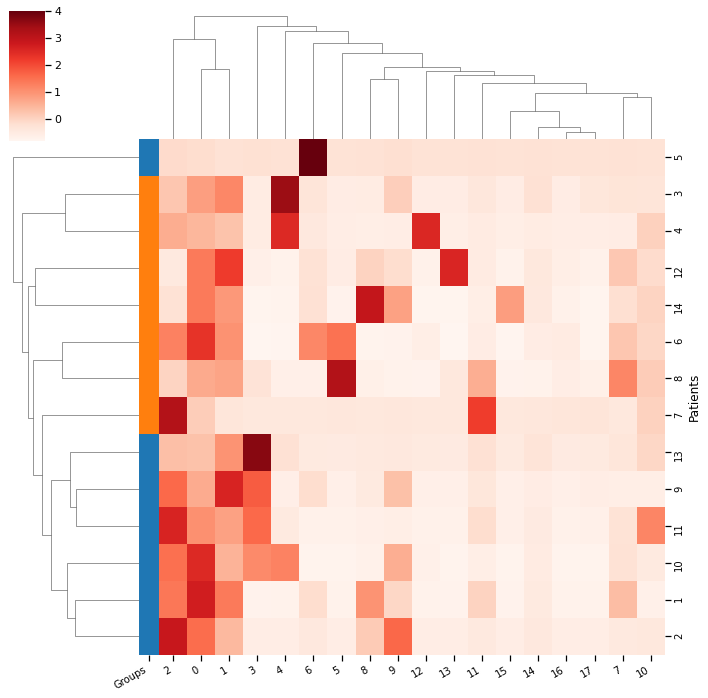

In [173]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

In [174]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
variable,,,,,,,,,,,,,,,,,,
reg001,0.051727,0.059611,0.054387,0.000000,0.000617,0.000397,0.043750,0.048919,0.024499,0.052390,0.004071,0.070331,0.000000,0.00000,0.058043,0.000000,0.010101,0.000000
reg002,0.116302,0.036597,0.089679,0.000000,0.000000,0.000794,0.012500,0.115860,0.302895,0.066143,0.007463,0.089733,0.003902,0.00000,0.046434,0.000000,0.000000,0.049383
reg005,0.002336,0.000189,0.011361,0.000000,0.000000,0.000000,0.000893,0.000000,0.002784,0.025540,0.002035,0.000808,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
reg006,0.029701,0.021128,0.037950,0.000000,0.000000,0.000397,0.002232,0.007209,0.032294,0.033399,0.001357,0.007276,0.000000,0.00000,0.026534,0.000000,0.000000,0.000000
reg009,0.059069,0.073948,0.034566,0.001524,0.299074,0.000397,0.022768,0.027291,0.004454,0.112639,0.019674,0.019402,0.002927,0.00000,0.131012,0.004292,0.005051,0.296296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.026197,0.038106,0.002175,0.001219,0.000000,0.005163,0.013393,0.051493,0.021158,0.024885,0.033921,0.012126,0.000000,0.12973,0.034826,0.000000,0.050505,0.006173
reg051,0.018688,0.040181,0.034324,0.129534,0.000926,0.000000,0.000893,0.006694,0.001114,0.005239,0.064450,0.029103,0.003902,0.00000,0.036484,0.004292,0.000000,0.018519
reg052,0.021859,0.047350,0.023930,0.298689,0.029938,0.000000,0.001339,0.015963,0.003898,0.005894,0.016282,0.033145,0.000000,0.00000,0.054726,0.000000,0.000000,0.006173


In [175]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [176]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,Groups,,,,,,,,,,,,,,,,,,
1,1,0.084015,0.048104,0.072033,0.000000,0.000309,0.000596,0.028125,0.082389,0.163697,0.059267,0.005767,0.080032,0.001951,0.000000,0.052239,0.000000,0.005051,0.024691
2,1,0.016019,0.010658,0.024656,0.000000,0.000000,0.000199,0.001562,0.003605,0.017539,0.029470,0.001696,0.004042,0.000000,0.000000,0.013267,0.000000,0.000000,0.000000
3,2,0.050309,0.070175,0.039642,0.001219,0.270525,0.000199,0.020312,0.026004,0.003898,0.091683,0.029512,0.025869,0.003415,0.000000,0.115257,0.005365,0.002525,0.240741
4,2,0.025363,0.025844,0.043026,0.001676,0.137654,0.000199,0.008929,0.002575,0.000000,0.001637,0.063094,0.008892,0.444878,0.000000,0.012438,0.000000,0.007576,0.012346
5,1,0.002086,0.000566,0.003988,0.001829,0.000617,0.000000,0.199777,0.001287,0.001392,0.005894,0.000339,0.002425,0.000000,0.000000,0.004975,0.000000,0.000000,0.000000
6,2,0.088186,0.058291,0.083273,0.000000,0.001698,0.150715,0.147098,0.088054,0.005290,0.008513,0.086499,0.034762,0.037073,0.000000,0.070481,0.012876,0.247475,0.049383
7,2,0.002419,0.000283,0.022359,0.000000,0.000000,0.000199,0.000000,0.000000,0.000000,0.000327,0.009498,0.058610,0.000000,0.000000,0.000829,0.000000,0.010101,0.012346
8,2,0.033094,0.027416,0.020063,0.019913,0.004630,0.227164,0.006399,0.116203,0.005382,0.001746,0.069199,0.119105,0.000650,0.034955,0.004422,0.000715,0.079125,0.061728
9,1,0.017604,0.071590,0.042905,0.130753,0.000926,0.000199,0.039062,0.002317,0.013920,0.056647,0.001696,0.016572,0.000488,0.000000,0.012438,0.001073,0.000000,0.033951


In [177]:
counts_clinic.sum(axis=0)

0     0.483453
1     0.486292
2     0.489969
3     0.490044
4     0.497685
5     0.386418
6     0.496801
7     0.441898
8     0.497309
9     0.499127
10    0.465400
11    0.440447
12    0.499675
13    0.482523
14    0.497789
15    0.499642
16    0.460438
17    0.469136
dtype: float64

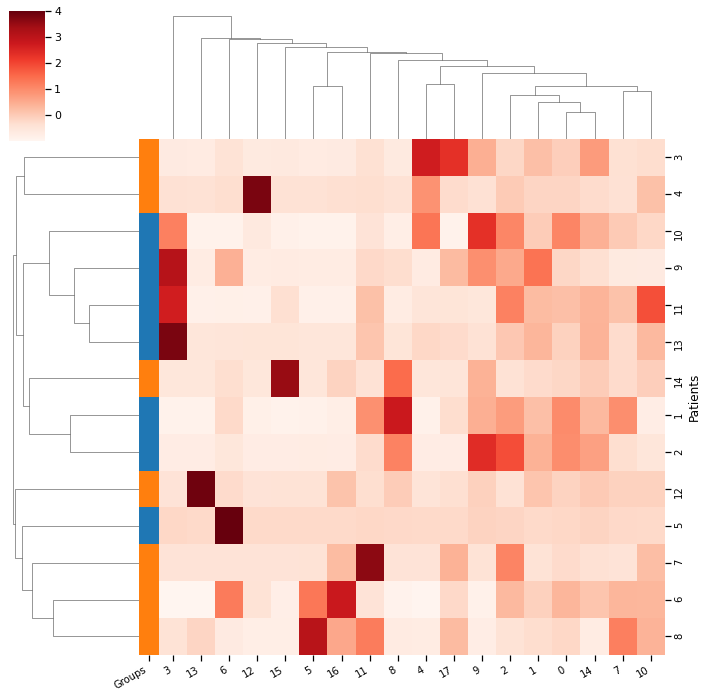

In [178]:
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

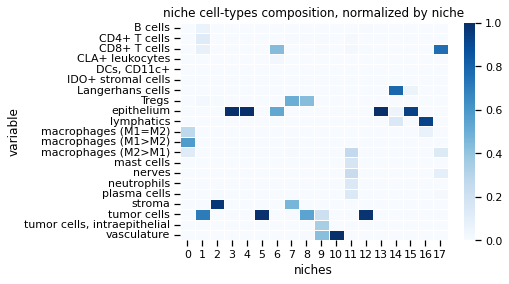

In [179]:
# mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
# plt.title("niche cell-types composition, normalized by total # cells")
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")
# mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
# plt.title("niche cell-types composition, normalized by cell-type")

That look just great, but even if the idea that we should also somehow take into account proportions per niche for normalization sounds correct, it doesn't seem right to ignore proportions per patient. For example if we normalize by the total number of cells we obtain again a very different result:

In [180]:
# proportion of cells in niches per sample, normalized per total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='total')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
variable,,,,,,,,,,,,,,,,,,
reg001,0.008144,0.008302,0.005911,0.000000,0.000053,0.000026,0.002575,0.002496,0.001156,0.002102,0.000158,0.002286,0.000000,0.000000,0.000919,0.000000,0.000053,0.000000
reg002,0.018311,0.005097,0.009746,0.000000,0.000000,0.000053,0.000736,0.005911,0.014291,0.002653,0.000289,0.002916,0.000105,0.000000,0.000736,0.000000,0.000000,0.000210
reg005,0.000368,0.000026,0.001235,0.000000,0.000000,0.000000,0.000053,0.000000,0.000131,0.001025,0.000079,0.000026,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
reg006,0.004676,0.002942,0.004125,0.000000,0.000000,0.000026,0.000131,0.000368,0.001524,0.001340,0.000053,0.000236,0.000000,0.000000,0.000420,0.000000,0.000000,0.000000
reg009,0.009300,0.010298,0.003757,0.000131,0.025456,0.000026,0.001340,0.001392,0.000210,0.004519,0.000762,0.000631,0.000079,0.000000,0.002075,0.000053,0.000026,0.001261
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,0.004125,0.005307,0.000236,0.000105,0.000000,0.000342,0.000788,0.002627,0.000998,0.000998,0.001314,0.000394,0.000000,0.003153,0.000552,0.000000,0.000263,0.000026
reg051,0.002942,0.005596,0.003730,0.011165,0.000079,0.000000,0.000053,0.000342,0.000053,0.000210,0.002496,0.000946,0.000105,0.000000,0.000578,0.000053,0.000000,0.000079
reg052,0.003441,0.006594,0.002601,0.025745,0.002548,0.000000,0.000079,0.000814,0.000184,0.000236,0.000631,0.001077,0.000000,0.000000,0.000867,0.000000,0.000000,0.000026


In [181]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [182]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,Groups,,,,,,,,,,,,,,,,,,
1,1,0.013227,0.006699,0.007829,0.000000,0.000026,0.000039,0.001655,0.004203,0.007724,0.002378,0.000223,0.002601,0.000053,0.000000,0.000828,0.000000,0.000026,0.000105
2,1,0.002522,0.001484,0.002680,0.000000,0.000000,0.000013,0.000092,0.000184,0.000828,0.001182,0.000066,0.000131,0.000000,0.000000,0.000210,0.000000,0.000000,0.000000
3,2,0.007921,0.009773,0.004308,0.000105,0.023026,0.000013,0.001195,0.001327,0.000184,0.003678,0.001143,0.000841,0.000092,0.000000,0.001826,0.000066,0.000013,0.001025
4,2,0.003993,0.003599,0.004676,0.000144,0.011717,0.000013,0.000525,0.000131,0.000000,0.000066,0.002443,0.000289,0.011980,0.000000,0.000197,0.000000,0.000039,0.000053
5,1,0.000328,0.000079,0.000433,0.000158,0.000053,0.000000,0.011756,0.000066,0.000066,0.000236,0.000013,0.000079,0.000000,0.000000,0.000079,0.000000,0.000000,0.000000
6,2,0.013884,0.008118,0.009050,0.000000,0.000144,0.009970,0.008656,0.004492,0.000250,0.000342,0.003350,0.001130,0.000998,0.000000,0.001117,0.000158,0.001287,0.000210
7,2,0.000381,0.000039,0.002430,0.000000,0.000000,0.000013,0.000000,0.000000,0.000000,0.000013,0.000368,0.001905,0.000000,0.000000,0.000013,0.000000,0.000053,0.000053
8,2,0.005210,0.003818,0.002180,0.001716,0.000394,0.015027,0.000377,0.005928,0.000254,0.000070,0.002680,0.003871,0.000018,0.000849,0.000070,0.000009,0.000412,0.000263
9,1,0.002772,0.009970,0.004663,0.011270,0.000079,0.000013,0.002299,0.000118,0.000657,0.002272,0.000066,0.000539,0.000013,0.000000,0.000197,0.000013,0.000000,0.000144


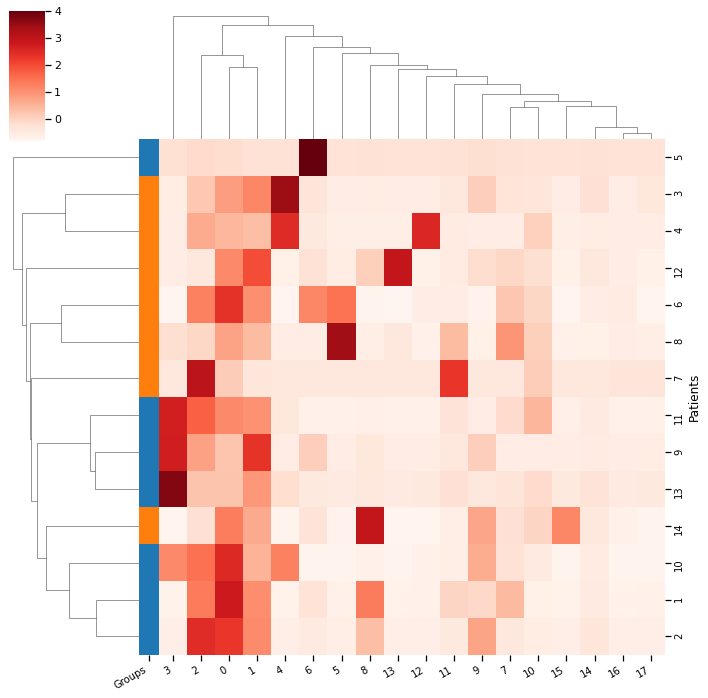

In [184]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-total.png"
plt.savefig(cluster_dir / figname)

A more statistically sound way to take jointly into account proportions per variable and per observation is the Central Log Ratio, that we already applied to protein composition:

In [185]:
# proportion of cells in niches per sample, normalized with Central Log Ratio
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='clr')
counts

niches,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
variable,,,,,,,,,,,,,,,,,,
reg001,4.487353,4.506523,4.166881,-5.834587,-0.556072,-1.249219,3.335748,3.304658,2.534970,3.132807,0.542540,3.216689,-5.834587,-5.834587,2.306129,-5.834587,-0.556072,-5.834587
reg002,4.932069,3.653142,4.301486,-6.200084,-6.200084,-0.921569,1.717488,3.801384,4.684233,3.000404,0.783179,3.094814,-0.228422,-6.200084,1.717488,-6.200084,-6.200084,0.464725
reg005,4.433486,1.794428,5.644576,-2.790939,-2.790939,-2.790939,2.487576,-2.790939,3.403866,5.457990,2.893041,1.794428,-2.790939,-2.790939,-2.790939,-2.790939,-2.790939,-2.790939
reg006,5.139412,4.676128,5.013875,-4.627739,-4.627739,-0.042371,1.567067,2.596686,4.018072,3.889455,0.650776,2.154853,-4.627739,-4.627739,2.730218,-4.627739,-4.627739,-4.627739
reg009,2.957600,3.059565,2.051147,-1.302259,3.964567,-2.911697,1.020128,1.058595,-0.832256,2.235797,0.455599,0.266357,-1.813085,-7.497065,1.457751,-2.218550,-2.911697,0.959504
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
reg046,3.123296,3.375318,0.264275,-0.546655,-6.518317,0.632000,1.468248,2.672221,1.704637,1.704637,1.979073,0.775101,-6.518317,2.854542,1.111573,-6.518317,0.369636,-1.932950
reg051,3.114755,3.757548,3.352083,4.448345,-0.505132,-6.189112,-0.910597,0.961205,-0.910597,0.475697,2.950133,1.979775,-0.217450,-6.189112,1.487298,-0.910597,-6.189112,-0.505132
reg052,3.619916,4.270172,3.339839,5.632271,3.319430,-5.840649,-0.156669,2.178706,0.690629,0.941943,1.922773,2.458291,-5.840649,-5.840649,2.241226,-5.840649,-5.840649,-1.255281


In [186]:
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

In [187]:
counts_clinic

,,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,Groups,,,,,,,,,,,,,,,,,,
1,1,4.709711,4.079832,4.234183,-6.017335,-3.378078,-1.085394,2.526618,3.553021,3.609602,3.066606,0.662860,3.155751,-3.031504,-6.017335,2.011808,-6.017335,-3.378078,-2.684931
2,1,4.786449,3.235278,5.329225,-3.709339,-3.709339,-1.416655,2.027321,-0.097126,3.710969,4.673722,1.771908,1.974641,-3.709339,-3.709339,-0.030361,-3.709339,-3.709339,-3.709339
3,2,3.060523,3.284595,2.458749,-1.278826,4.137485,-4.925535,1.177501,1.287895,-0.697251,2.281961,1.081018,0.800615,-1.390398,-7.218219,1.599045,-1.736972,-4.925535,1.003348
4,2,3.745875,3.309193,3.875648,-2.366848,4.825989,-3.565796,1.702209,0.336326,-5.858480,-0.377232,3.238170,1.086137,4.843574,-5.858480,0.721380,-5.858480,-0.926538,-2.872649
5,1,3.017820,1.317221,3.231542,2.290176,1.061808,-4.072865,6.608981,1.408382,1.408382,2.709727,-1.780182,1.552223,-4.072865,-4.072865,1.611114,-4.072865,-4.072865,-4.072865
6,2,3.428415,2.786507,3.003251,-7.422767,-1.248372,3.055464,2.955289,2.304196,-1.074219,-0.284427,1.981254,0.913970,-2.964717,-7.422767,0.891694,-1.189481,1.052543,-0.765832
7,2,4.324976,2.048038,6.222188,-2.883903,-2.883903,-0.591219,-2.883903,-2.883903,-2.883903,-0.591219,3.983638,5.913345,-2.883903,-2.883903,-0.591219,-2.883903,0.101928,2.250770
8,2,2.488410,2.296509,2.005034,0.615781,-4.175148,3.336321,-0.385828,2.993825,-0.119659,-3.266943,2.214765,2.510396,-3.915580,0.949725,-1.558822,-5.444036,0.172164,-0.716912
9,1,3.645428,4.771651,4.157127,3.599711,-0.208283,-3.305686,-0.723293,0.026719,1.269172,3.434813,-2.500967,2.007126,-3.305686,-5.598369,0.981490,-3.305686,-5.598369,0.653100


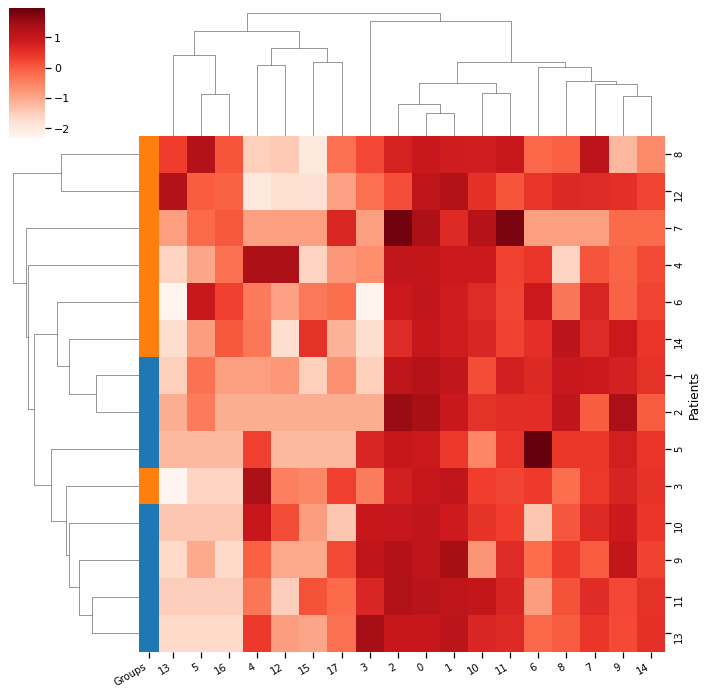

In [188]:
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-clr.png"
plt.savefig(cluster_dir / figname)

With this more statistically sound way of normalizing data we still obtain a good, although not perfect, blind clustering of patients into responders and non responders.

In [189]:
# the colorbar is just wrong
import seaborn as sns
cm = sns.light_palette("green", as_cmap=True)
s = d.style.background_gradient(cmap=cm)
s

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Patients,,,,,,,,,,,,,,,,,,
1,4.709711,4.079832,4.234183,-6.017335,-3.378078,-1.085394,2.526618,3.553021,3.609602,3.066606,0.662860,3.155751,-3.031504,-6.017335,2.011808,-6.017335,-3.378078,-2.684931
2,4.786449,3.235278,5.329225,-3.709339,-3.709339,-1.416655,2.027321,-0.097126,3.710969,4.673722,1.771908,1.974641,-3.709339,-3.709339,-0.030361,-3.709339,-3.709339,-3.709339
3,3.060523,3.284595,2.458749,-1.278826,4.137485,-4.925535,1.177501,1.287895,-0.697251,2.281961,1.081018,0.800615,-1.390398,-7.218219,1.599045,-1.736972,-4.925535,1.003348
4,3.745875,3.309193,3.875648,-2.366848,4.825989,-3.565796,1.702209,0.336326,-5.858480,-0.377232,3.238170,1.086137,4.843574,-5.858480,0.721380,-5.858480,-0.926538,-2.872649
5,3.017820,1.317221,3.231542,2.290176,1.061808,-4.072865,6.608981,1.408382,1.408382,2.709727,-1.780182,1.552223,-4.072865,-4.072865,1.611114,-4.072865,-4.072865,-4.072865
6,3.428415,2.786507,3.003251,-7.422767,-1.248372,3.055464,2.955289,2.304196,-1.074219,-0.284427,1.981254,0.913970,-2.964717,-7.422767,0.891694,-1.189481,1.052543,-0.765832
7,4.324976,2.048038,6.222188,-2.883903,-2.883903,-0.591219,-2.883903,-2.883903,-2.883903,-0.591219,3.983638,5.913345,-2.883903,-2.883903,-0.591219,-2.883903,0.101928,2.250770
8,2.488410,2.296509,2.005034,0.615781,-4.175148,3.336321,-0.385828,2.993825,-0.119659,-3.266943,2.214765,2.510396,-3.915580,0.949725,-1.558822,-5.444036,0.172164,-0.716912
9,3.645428,4.771651,4.157127,3.599711,-0.208283,-3.305686,-0.723293,0.026719,1.269172,3.434813,-2.500967,2.007126,-3.305686,-5.598369,0.981490,-3.305686,-5.598369,0.653100


In [190]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

In [191]:
pvals.head(20)

,pval,pval_corr
16,0.008159,0.146853
8,0.053030,0.159091
1,0.053030,0.159091
2,0.053030,0.159091
3,0.053030,0.159091
11,0.053030,0.159091
5,0.212121,0.424242
14,0.212121,0.424242
9,0.212121,0.424242
15,0.575175,0.647072


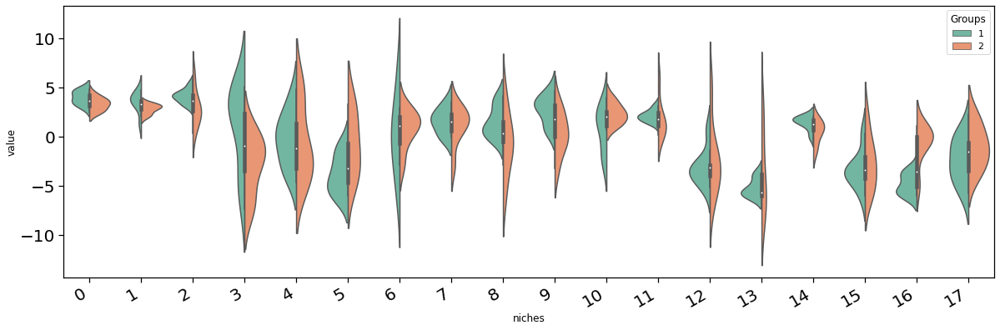

In [192]:
# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

From this plot we would like to add niches 4 and 17 to those that seggregate patients into groups 1 and 2.

Add                              16 with p-value 0.000363948
Add                               4 with p-value 0.0406529
Add                              17 with p-value 0.0424053
Add                               2 with p-value 0.0361688


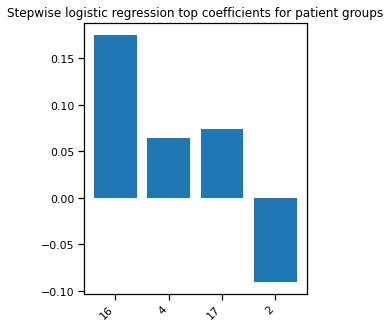

In [196]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")

##### Elasticnet logistic regression

In [197]:
def write_log(file, message):
    print(message)
    file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10

In [198]:
X = counts_clinic.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

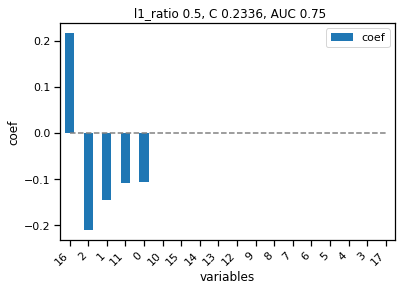

<Figure size 432x288 with 0 Axes>

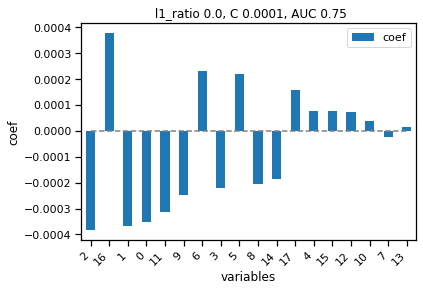

<Figure size 432x288 with 0 Axes>

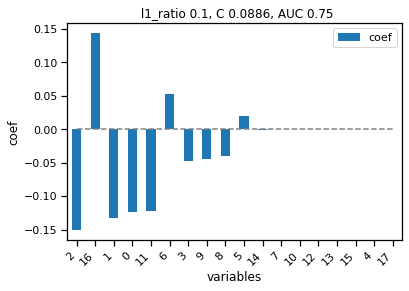

In [200]:
start = time()

for l1_name, l1_ratios in l1_ratios_list:
    dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
log_file.close()

In [ ]:
save_dir = cluster_dir / (clusterer_name + "_spatial_networks_figures")
save_dir.mkdir(parents=True, exist_ok=True)

sample_ids = [
    "reg001",
    "reg003",
    "reg005",
    "reg006",
    "reg037",
    "reg040",
    "reg042",
    "reg051",
    "reg054",
    "reg055",
    "reg016",
    "reg058",
    "reg060",
    "reg019",
]

# choose colormap
if nb_clust <= 20:
    clusters_cmap = sns.color_palette('Paired', 20)
    cluster_colors = [clusters_cmap[x] if x >= 0
                      else (0.5, 0.5, 0.5)
                      for x in cluster_labels]
else:
    clusters_cmap = cc.palette["glasbey"]
    # make color mapper
    # series to sort by decreasing order
    uniq = pd.Series(cluster_labels).value_counts().index.astype(int)
    n_colors = len(clusters_cmap)
    labels_color_mapper = {x: clusters_cmap[i % n_colors] for i, x in enumerate(uniq)}
    labels_color_mapper[-1] = (0.5, 0.5, 0.5)
    cluster_colors = np.array([labels_color_mapper[x] for x in cluster_labels])

# colormap for cell-types
n_cell_types = obj['ClusterName'].unique().size
# palette = sns.color_palette(cc.glasbey, n_colors=n_cell_types).as_hex()
palette = [mpl.colors.rgb2hex(x) for x in mpl.cm.get_cmap('tab20').colors]

plots_marker = '.'
for sample in sample_ids:
    print("filename: {}".format(sample))
    select = np.array(obj['FileName'] == sample)

    # load nodes and edges
    coords = obj.loc[select, cell_pos_cols].values
    pairs = edges_all.loc[edges_all['filename'] == sample, ['source', 'target']].values

    # Big summary plot
    fig, ax = plt.subplots(1, 4, figsize=(int(7*4)+1, 7), tight_layout=False)
    i = 0
    ty.plot_network(coords, pairs, labels=obj.loc[select, 'ClusterName'], cmap_nodes=palette, marker=plots_marker, size_nodes=size_points, ax=ax[0])
    ax[i].set_title('Spatial map of phenotypes', fontsize=14);

    i += 1
    ax[i].scatter(coords[:, 0], coords[:, 1], c=cluster_colors[select], marker=plots_marker, s=size_points)
    ax[i].set_title('Spatial map of detected areas', fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[select, 0], embed_viz[select, 1], c=cluster_colors[select], s=5);
    ax[i].set_title("HDBSCAN clustering on NAS", fontsize=14);
    ax[i].set_aspect('equal')

    i += 1
    ax[i].scatter(embed_viz[:, 0], embed_viz[:, 1], c=cluster_colors);
    ax[i].set_title("HDBSCAN clustering on NAS of all samples", fontsize=14);
    ax[i].set_aspect('equal')
    
    # make plot limits equal
    ax[i-1].set_xlim(ax[i].get_xlim())
    ax[i-1].set_ylim(ax[i].get_ylim())

    suptitle = f"Spatial omics data and detected areas - sample {sample}";
    fig.suptitle(suptitle, fontsize=18)

    fig.savefig(save_dir / suptitle, bbox_inches='tight', facecolor='white', dpi=300)

#### Explore different clustering wrt survival

In [ ]:
# for dim_clust in tqdm([2, 3, 4, 5], leave=False):
for dim_clust in tqdm([2], leave=False):
    for n_neighbors in tqdm([15, 45, 75, 100, 200], leave=False):
        for metric in tqdm(['euclidean', 'cosine'], leave=False):
            for k_cluster in tqdm([15, 50], leave=False):
                for resolution_parameter in [0.005, 0.01, 0.05, 0.1, 0.5]:
                    cluster_params = {
                        'reducer_type': 'umap', 
                        'n_neighbors': n_neighbors, 
                        'metric': metric,
                        'min_dist': 0.0,
                        'clusterer_type': 'leiden', 
                        'dim_clust': dim_clust, 
                        'k_cluster': 15, 
                        'resolution_parameter': resolution_parameter,
                    }

                    cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

                    # Survival analysis (just heatmap for now)
                    niches = cluster_labels
                    for normalize in ['total', 'niche', 'obs', 'clr']:
                        counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize=normalize)
                        # merge clinical data and proportion of cells in niches per sample
                        # counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
                        counts_clinic = pd.concat([status, counts], axis=1, join='inner').fillna(0)
                        # counts_clinic.drop(columns=['Spots'], inplace=True)
                        counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()

                        # plot heatmap
                        g, d = mosna.plot_heatmap(
                            counts_clinic.reset_index(), 
                            obs_labels='Patients', 
                            group_var='Groups', 
                            groups=[1, 2],
                            figsize=(10, 10),
                            z_score=False,
                            cmap=sns.color_palette("Reds", as_cmap=True),
                            return_data=True,
                            )
                        # str_params = '_'.join([str(key) + '-' + str(val) for key, val in cluster_params.items()])
                        figname = f"biclustering_resolution-{resolution_parameter}_normalized-{normalize}.png"
                        plt.savefig(cluster_dir / figname, dpi=150)

## Final parameters

```
reducer-umap_dim-2_nneigh-200_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-niche  
reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-clr  
reducer-umap_dim-2_nneigh-75_metric-euclidean_min_dist-0.0/clusterer-leiden_n_neighbors-15/biclustering_resolution-0.05_normalized-obs
```

In [66]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 17 clusters


In [67]:
nas_dir

PosixPath('../data/processed/CODEX_CTCL/pretreatment_samples_networks_xy_trim_dist-200_solitary-0/nas_on-markers_stats-mean-std_order-1')

Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

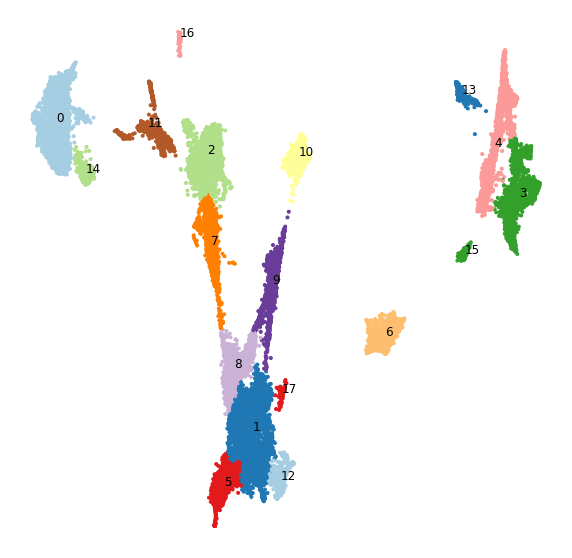

In [68]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

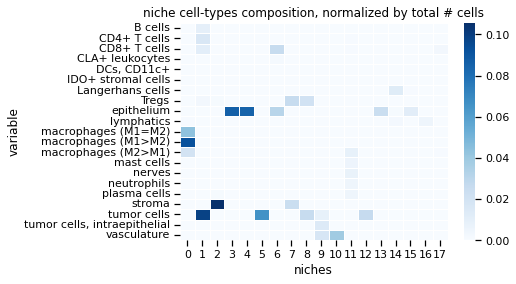

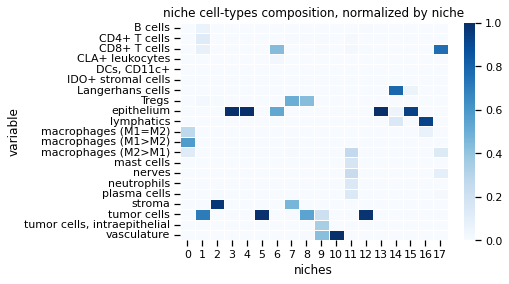

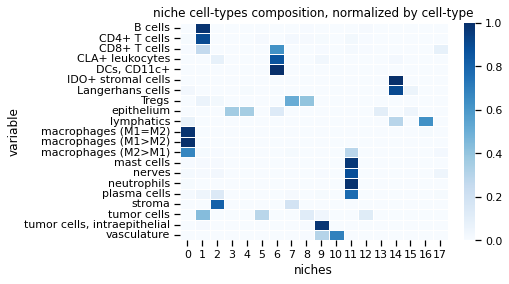

In [70]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

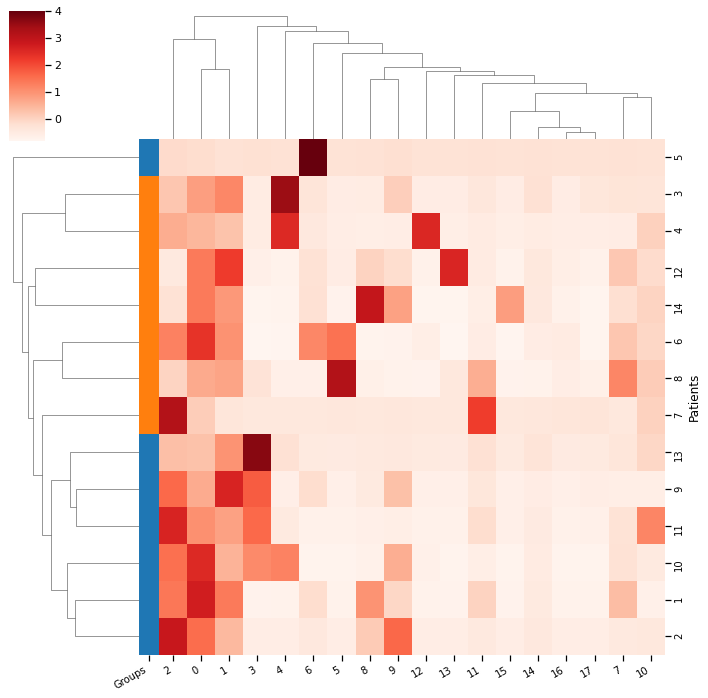

In [81]:
# proportion of cells in niches per sample
other_str = ''
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

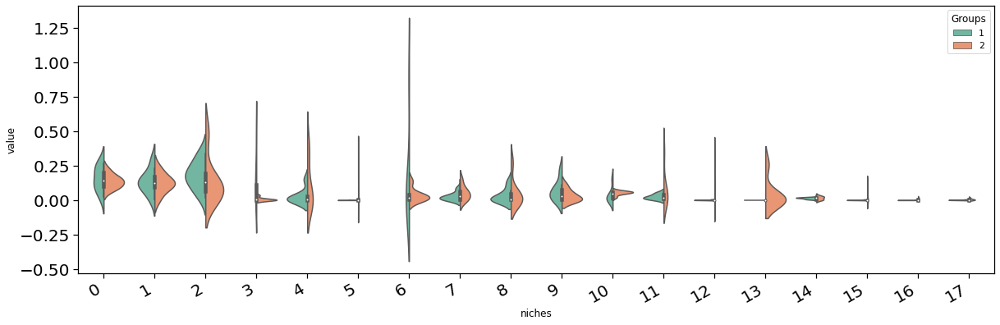

In [82]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

Add                              16 with p-value 0.0100267
Add                               4 with p-value 0.00839606


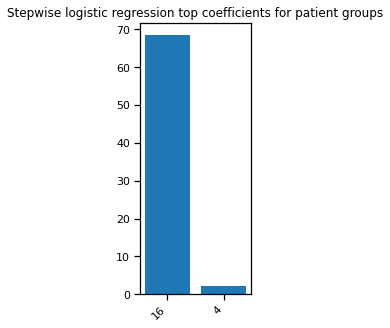

In [83]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

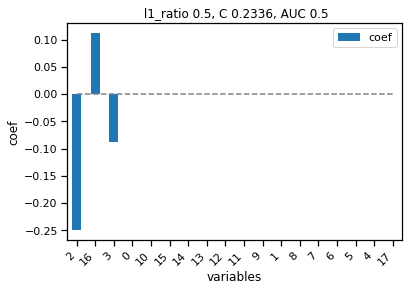

<Figure size 432x288 with 0 Axes>

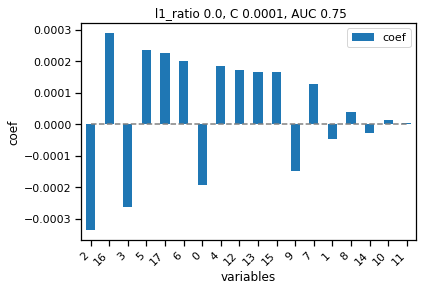

<Figure size 432x288 with 0 Axes>

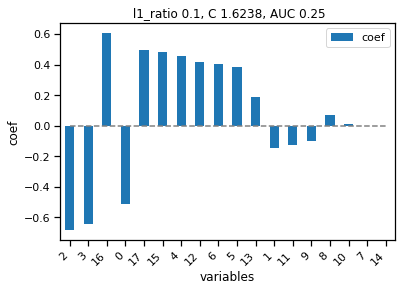

In [84]:
# Elasticnet logistic regression

def write_log(file, message):
    print(message)
    file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = counts_clinic.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
log_file.close()

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

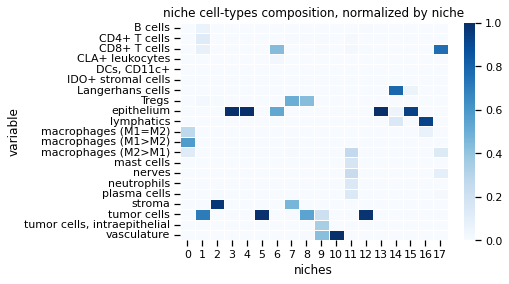

In [85]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

Ok not so interesting, and perfomances are not great

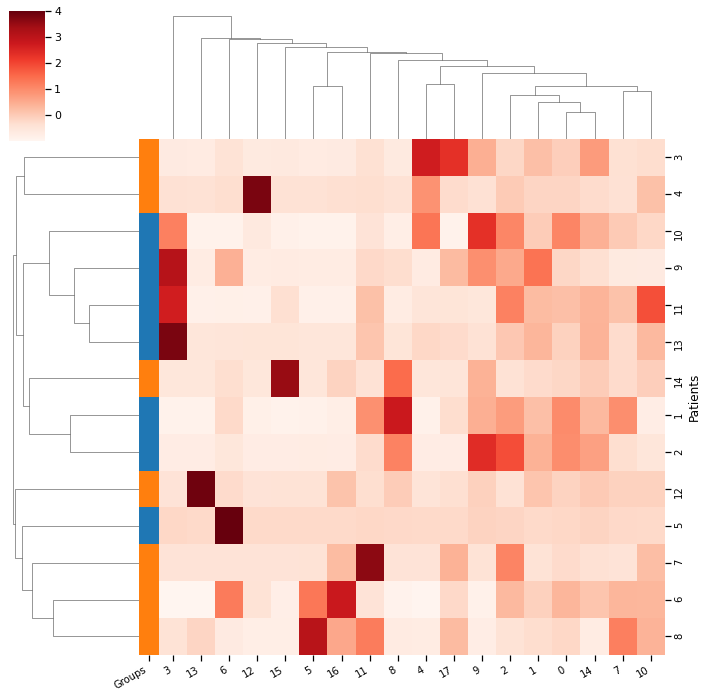

In [73]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
# merge clinical data and proportion of cells
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

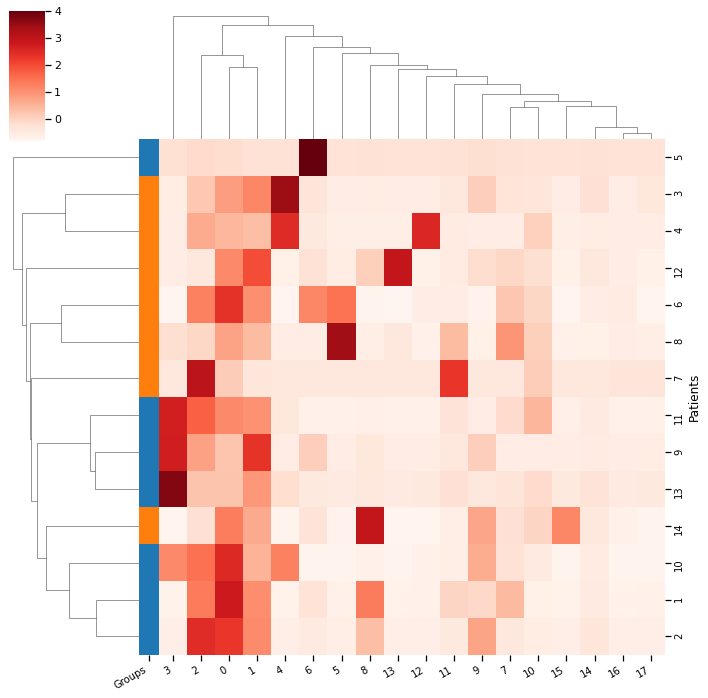

In [74]:
# proportion of cells in niches per sample, normalized per total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='total')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-total.png"
plt.savefig(cluster_dir / figname)


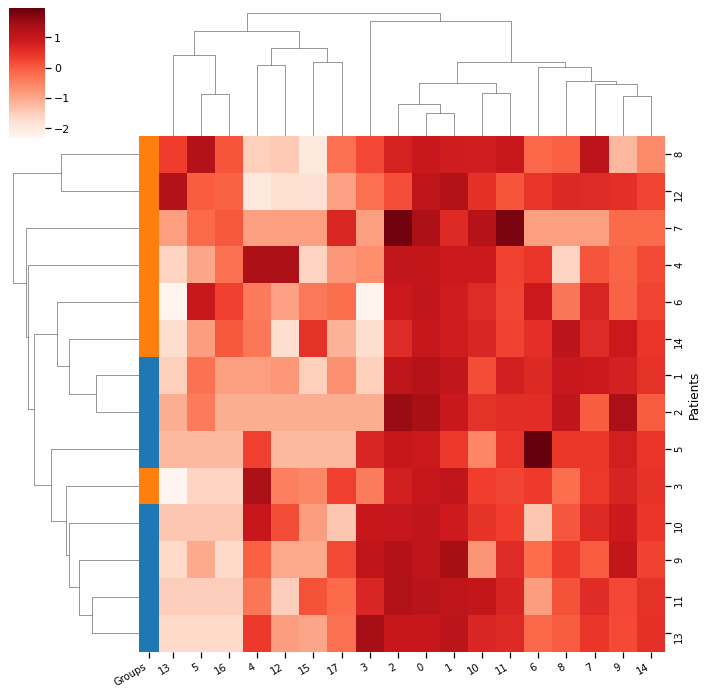

In [75]:
# proportion of cells in niches per sample, normalized with Central Log Ratio
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='clr')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-clr.png"
plt.savefig(cluster_dir / figname)

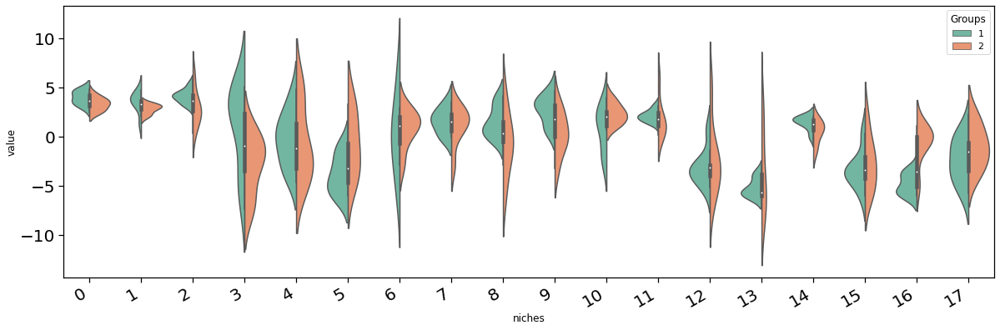

In [76]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

Add                              16 with p-value 0.000363948
Add                               4 with p-value 0.0406529
Add                              17 with p-value 0.0424053
Add                               2 with p-value 0.0361688


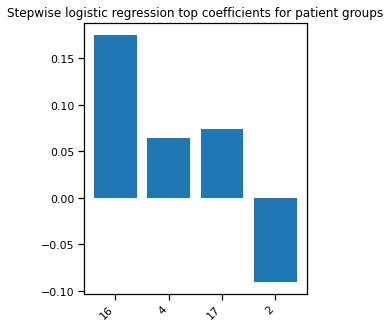

In [77]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

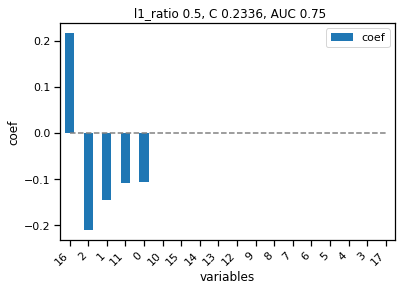

<Figure size 432x288 with 0 Axes>

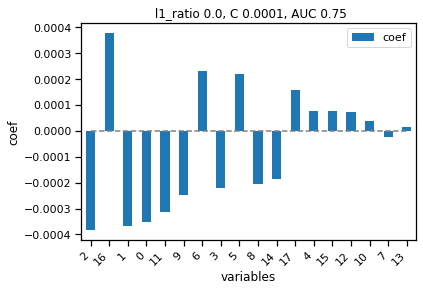

<Figure size 432x288 with 0 Axes>

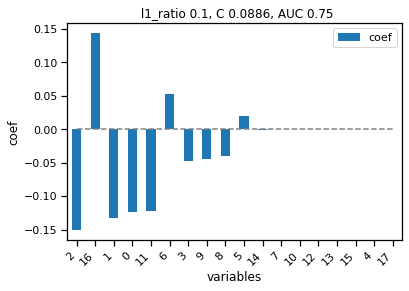

In [79]:
# Elasticnet logistic regression

def write_log(file, message):
    print(message)
    file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = counts_clinic.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
log_file.close()

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

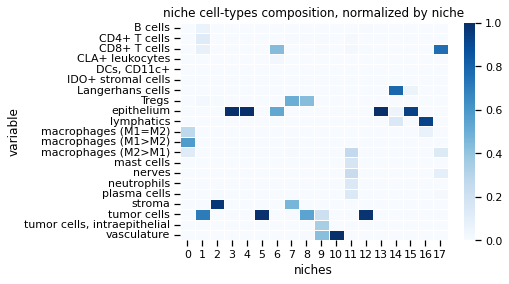

In [80]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

AUC 0.75

Niches that matter:
  - 16: lymphatics + macrophages (M1=M2)
  - 2: stroma only
  - 1: tumor cells + B cells + CD4+ T cells + CD8+ T cells
  - 0: macrophages, all 3 definitions
Interestingly, niches of pure epithelium or *even* pure cancer cells don't matter.

Also from step-wise LR:
  - 16: lymphatics + macrophages (M1=M2)
  - 4: epithelium
  - 17: CD8+ T cells + macrophages (M2 > M1)
  - 2: stroma

In [86]:
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 200, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}

cluster_labels, cluster_dir, nb_clust, _ = mosna.get_clusterer(var_aggreg, nas_dir, **cluster_params)

Loading clusterer object and cluster labels
There are 15 clusters


In [87]:
nas_dir

PosixPath('../data/processed/CODEX_CTCL/pretreatment_samples_networks_xy_trim_dist-200_solitary-0/nas_on-markers_stats-mean-std_order-1')

Loading reducer object and reduced coordinates


(<Figure size 720x720 with 1 Axes>, <AxesSubplot:>)

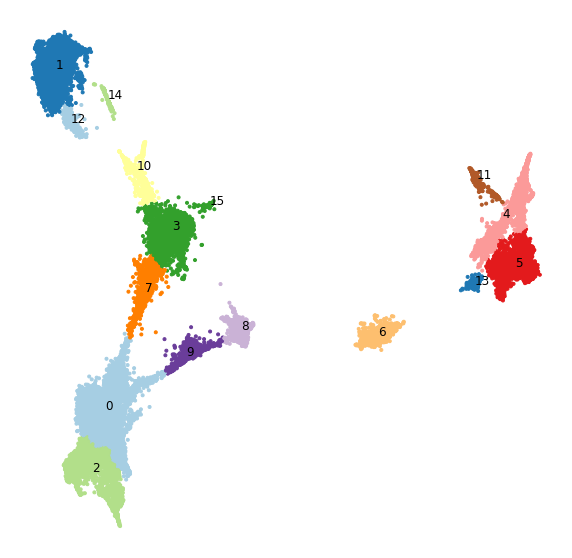

In [88]:
embed_viz, _ = mosna.get_reducer(var_aggreg, nas_dir, reducer_type='umap', n_neighbors=cluster_params['n_neighbors'])
mosna.plot_clusters(embed_viz, cluster_labels, nas_dir, cluster_params=cluster_params)

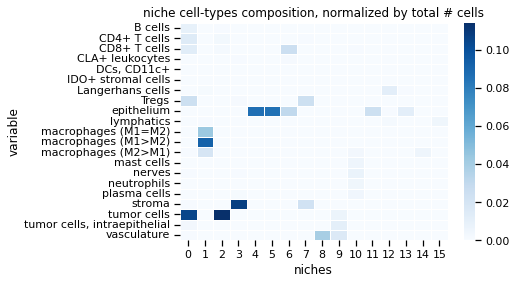

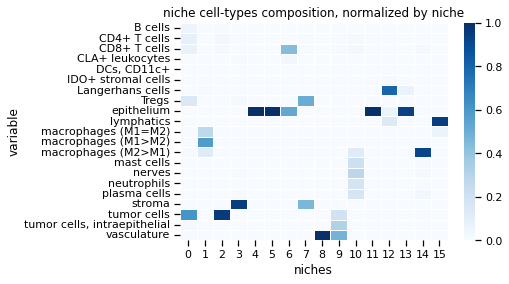

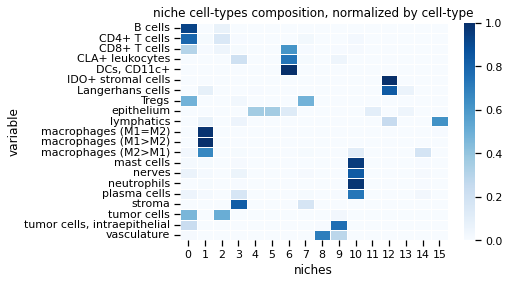

In [89]:
# Survival analysis

cell_types = nodes_all['CellCluster']
niches = cluster_labels

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types')
title = "niche cell-types composition, normalized by total # cells"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
title = "niche cell-types composition, normalized by niche"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='obs')
title = "niche cell-types composition, normalized by cell-type"
plt.title(title)
plt.savefig(cluster_dir / title, bbox_inches='tight', facecolor='white')

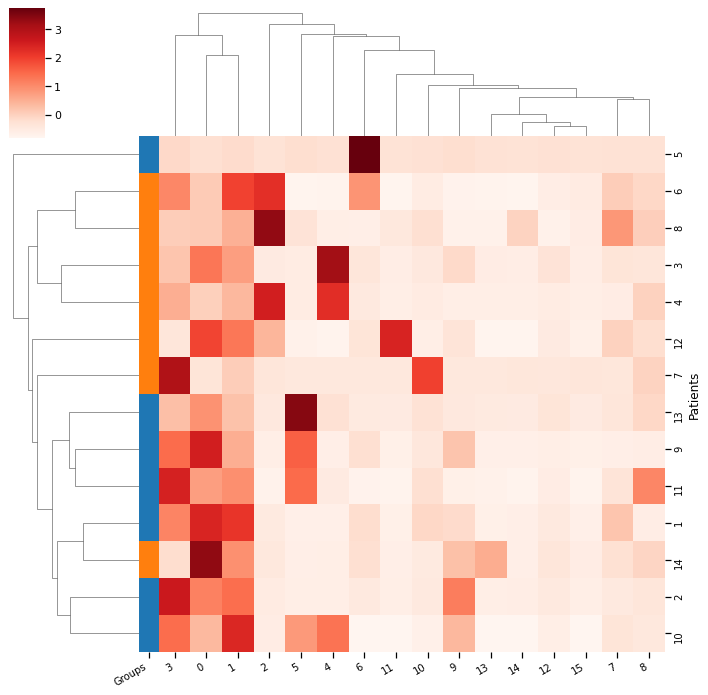

In [90]:
# proportion of cells in niches per sample
other_str = ''
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='obs')
# merge clinical data and proportion of cells in niches per sample
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d =mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-obs.png"
plt.savefig(cluster_dir / figname)

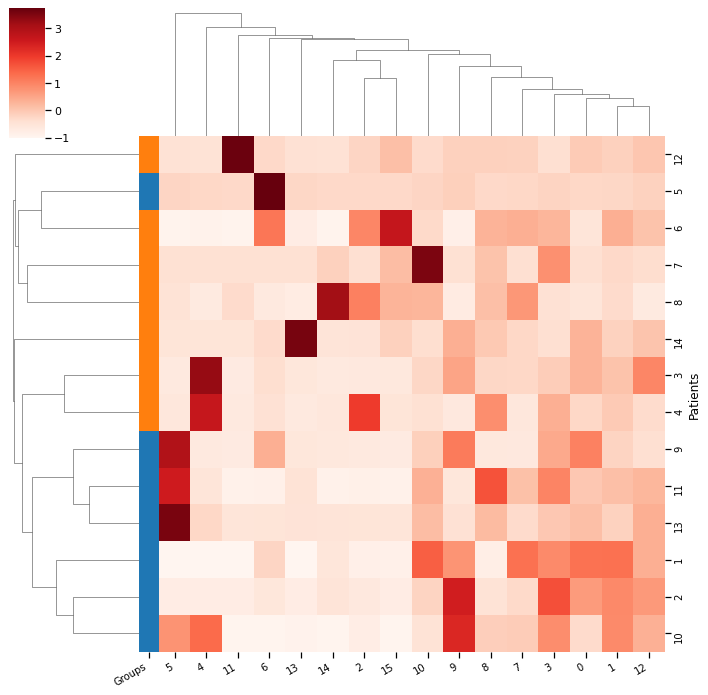

In [91]:
# proportion of cells in niches per sample, normalized per niche total count
counts = mosna.make_niches_composition(obj['FileName'], niches, var_label='variable', normalize='niche')
# merge clinical data and proportion of cells
counts_clinic = pd.concat([status, counts], axis=1, join='inner').sort_values('Spots').fillna(0)
counts_clinic.drop(columns=['Spots'], inplace=True)
counts_clinic = counts_clinic.groupby(['Patients', 'Groups']).mean()
# heatmap
g, d = mosna.plot_heatmap(
    counts_clinic.reset_index(), 
    obs_labels='Patients', 
    group_var='Groups', 
    groups=[1, 2],
    figsize=(10, 10),
    z_score=False,
    cmap=sns.color_palette("Reds", as_cmap=True),
    return_data=True,
    )

figname = f"resolution-{cluster_params['resolution_parameter']}{other_str}_biclustering_normalized-niche.png"
plt.savefig(cluster_dir / figname)

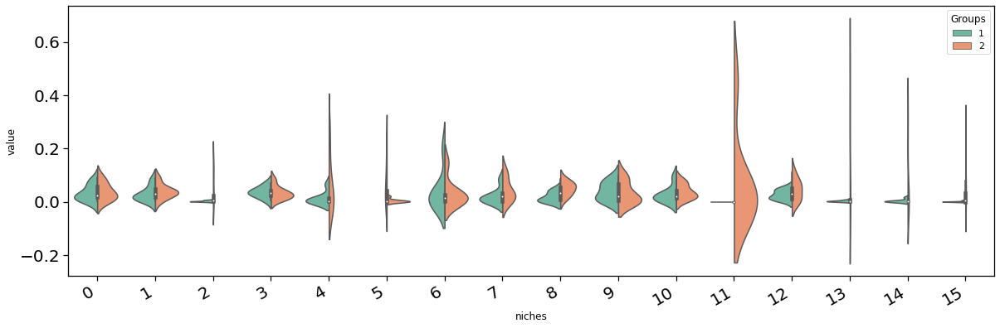

In [92]:
pvals = mosna.find_DE_markers(counts_clinic, group_ref=2, group_tgt=1, group_var='Groups')
pvals = pvals.sort_values(by='pval', ascending=True)

# DE analysis
fig, ax = mosna.plot_distrib_groups(
    counts_clinic, 
    group_var='Groups',
    groups=[1, 2], 
    pval_data=None,
    multi_ind_to_col=True,
    var_name='niches',
    )

Add                               8 with p-value 0.0250028
Add                               5 with p-value 0.0414848


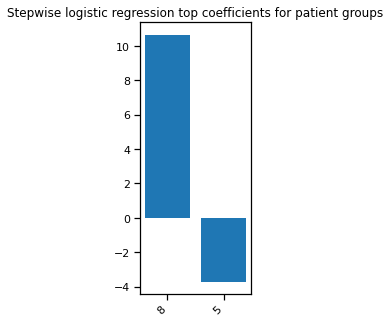

In [93]:
# Stepwise logistic regression
best_pval_names = pvals.loc[pvals['pval'] < 0.05, :].index.tolist()
if len(best_pval_names) > 0:
    model, included = mosna.stepwise_regression(X=counts_clinic, y_name='Groups', y_values=[1, 2], verbose=True)

    # plot the model's coefficients
    coefs = model.params[1:] # skip intercept
    nb_coefs = min(coefs.size, 20)
    if nb_coefs > 0:
        fig, ax = plt.subplots(figsize=(nb_coefs,5))
        ax.bar(range(len(coefs.index)), coefs)
        plt.xticks(ticks=range(len(coefs.index)), labels=coefs.index, rotation=45, ha='right');
        title = f"Stepwise logistic regression top coefficients for patient groups"
        plt.title(title)
else:
    print("There is no niche statistically related to response group")







-------------------------------------------
------------------- END -------------------
-------------------------------------------
Training took {duration}s


<Figure size 432x288 with 0 Axes>

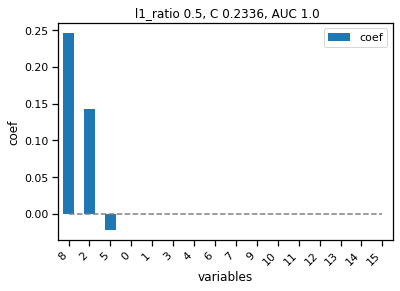

<Figure size 432x288 with 0 Axes>

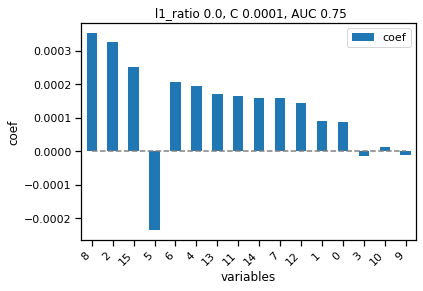

<Figure size 432x288 with 0 Axes>

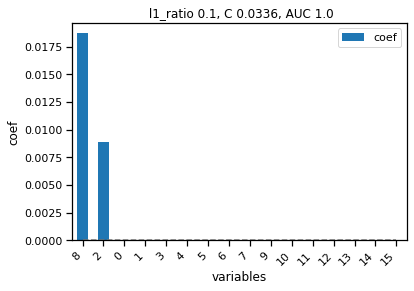

In [94]:
# Elasticnet logistic regression

def write_log(file, message):
    print(message)
    file.write(message + '\n')

# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
CV_TRAIN = 5
CV_ADAPT = True
CV_MAX = 10


# /!\ not related to `X = obj[aggreg_vars].values`
X = counts_clinic.reset_index()
X = X.loc[(X.loc[:, 'Groups'] == 1) | (X.loc[:, 'Groups'] == 2), :]
y = X['Groups'].values - 1  # to have resp=0, non-resp=1
var_idx = X.iloc[:, 2:].columns
X = X.iloc[:, 2:]

start = time()

for l1_name, l1_ratios in l1_ratios_list:
    dir_save = cluster_dir / "logistic_regression" / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_split = {}
    # stratify train / test by response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # Standardize data to give same weight to regularization
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    training_succeeded = False
    cv_used = CV_TRAIN
    while not training_succeeded and cv_used <= CV_MAX:
        np.random.seed(0)
        clf = linear_model.LogisticRegressionCV(
            cv=cv_used,
            Cs=20, 
            penalty='elasticnet', 
            # scoring='neg_log_loss', 
            scoring='roc_auc', 
            solver='saga', 
            l1_ratios=l1_ratios,
            max_iter=10000,
            n_jobs=-1,  # or n_jobs-1 to leave one core available
        )
        clf = clf.fit(X_train, y_train)
        training_succeeded = not np.all(clf.coef_ == 0)
        if not training_succeeded:
            if CV_ADAPT:
                cv_used += 1
                print("        training failed, trying with cv = {cv_used}")
            else:
                print("        training failed")
                break
        
    if training_succeeded:
        y_pred_proba = clf.predict_proba(X_test)[:, 1]
        y_pred = clf.predict(X_test)
        score = {
            'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
            'AP' : metrics.average_precision_score(y_test, y_pred_proba),
            'MCC': metrics.matthews_corrcoef(y_test, y_pred),
        }

        # Save model coefficients and plots
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)

        coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
        coef['abs coef'] = coef['coef'].abs()
        coef = coef.sort_values(by='abs coef', ascending=False)
        coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
        coef['cum % total'] = coef['% total'].cumsum()
        coef['coef OR'] = np.exp(coef['coef'])
        coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients.csv")
        nb_coef = coef.shape[0]
        
        nb_coef_plot = min(20, nb_coef)
        labels = coef.index[:nb_coef_plot]

        plt.figure()
        ax = coef.loc[labels, 'coef'].to_frame().plot.bar()
        ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
        ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
        # ticks_label = np.round(ticks_label, decimals=2)
        ax.set_xticks(ticks_pos);
        # ax.set_xticklabels(ticks_label)
        ax.set_xticklabels(labels, rotation=45, ha='right');
        plt.xlabel('variables')
        plt.ylabel('coef')
        plt.title(f" l1_ratio {l1_ratio}, C {C}, AUC {score['ROC AUC']}")
        plt.savefig(dir_save / f"coef.png", bbox_inches='tight', facecolor='white')

    else:
        score = {
            'ROC AUC': np.nan,
            'AP' : np.nan,
            'MCC': np.nan,
        }
        print("        training failed with cv <= {CV_MAX}")
            
    # plt.show()

    scores = pd.DataFrame.from_dict(score, orient='index')
    scores.to_csv(dir_save / 'scores_niches.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
print("Training took {duration}s")
log_file.close()

Text(0.5, 1.0, 'niche cell-types composition, normalized by niche')

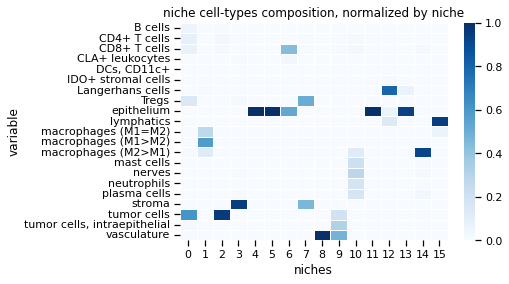

In [95]:
# as a reminder:
mosna.plot_niches_composition(var=cell_types, niches=niches, var_label='cell-types', normalize='niche')
plt.title("niche cell-types composition, normalized by niche")

ROC AUC score perfect, only from pure niches.  
  - 8: vasculature
  - 2: tumor cells
  - 5: epithelium
  - 15: lymphatics + macrophages (M1=M2)  


Pure proportions of these cell types was not predictive of response, but proportion of ***pure niches*** are predictive.  
So mosna detects tumor exclusive areas predictive of response?!

In [98]:
# So we keep
cluster_params = {
    'reducer_type': 'umap', 
    'n_neighbors': 75, 
    'metric': 'euclidean', 
    'min_dist': 0.0,
    'clusterer_type': 'leiden', 
    'dim_clust': 2, 
    'k_cluster': 15, 
    'resolution_parameter': 0.05,
}